<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [1]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr>
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr>
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4>
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

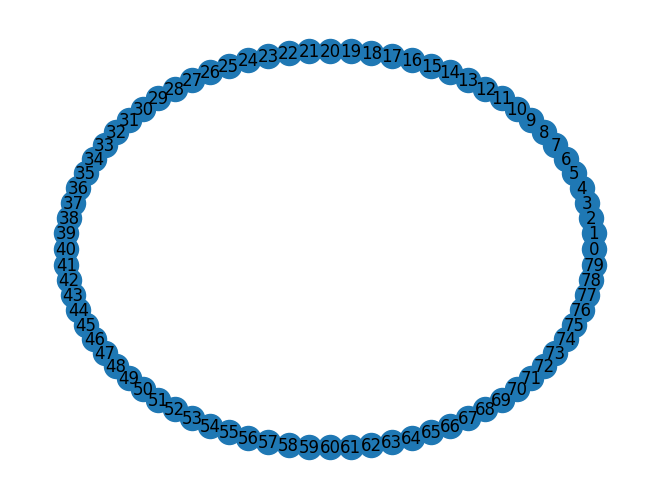

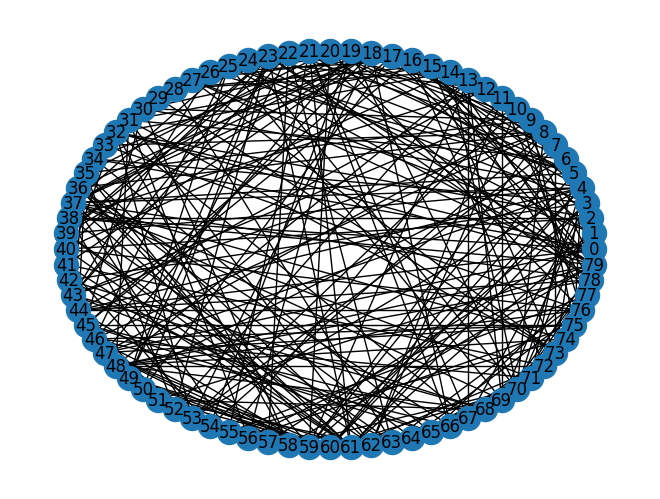

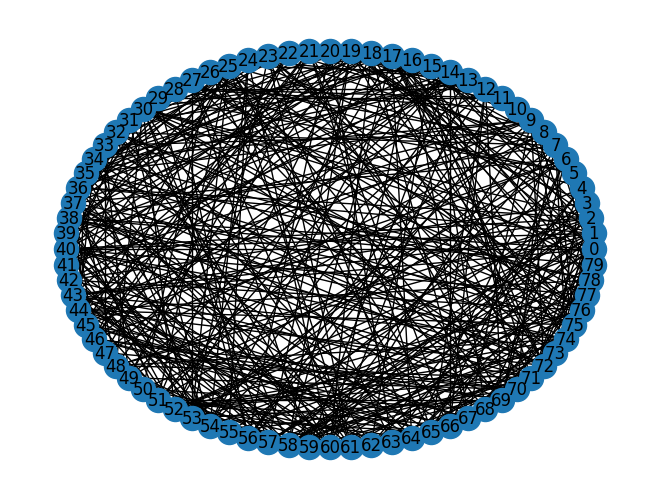

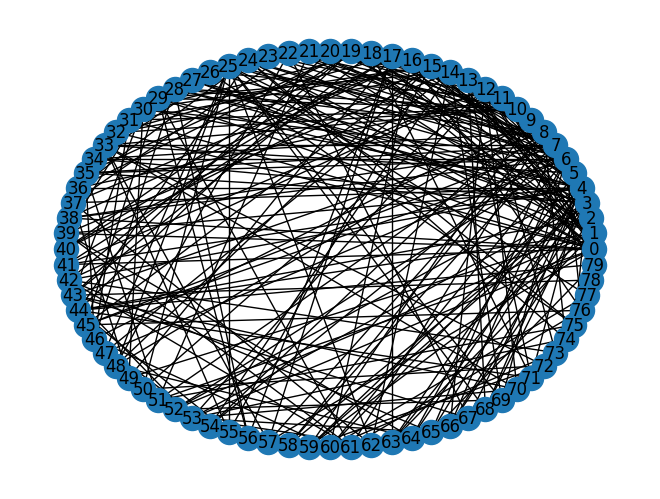

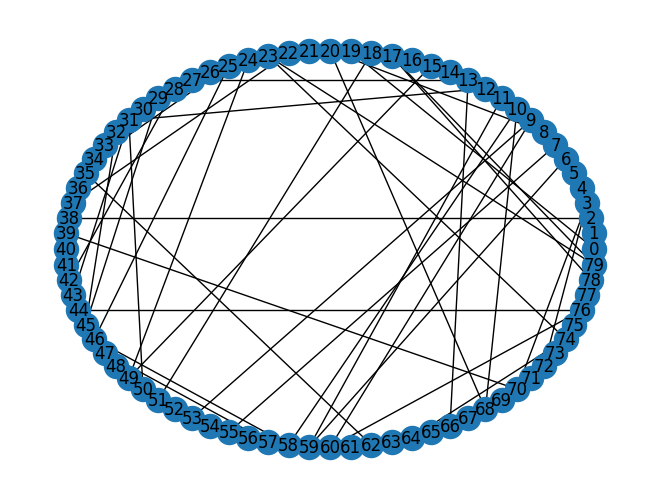

In [2]:
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random
n=80
d=4
M=300
R=0.25
p=0.3
k=4
seedno=5
random.seed(seedno)

REG =nx.watts_strogatz_graph(n,d,p=0,seed=random.seed(seedno))
nx.draw_circular(REG,with_labels=True)
plt.show()

RGER =nx.gnm_random_graph(n, M, seed=random.seed(seedno))
nx.draw_circular(RGER,with_labels=True)
plt.show()

RGG =nx.random_geometric_graph(n,R,seed=random.seed(seedno))
nx.draw_circular(RGG,with_labels=True)
plt.show()

SF =nx.barabasi_albert_graph(n,d,k,random.seed(seedno))
nx.draw_circular(SF,with_labels=True)
plt.show()

SW =nx.watts_strogatz_graph(n,d,p,seed=random.seed(seedno))
nx.draw_circular(SW,with_labels=True)
plt.show()


<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

In [3]:
#football network
football=nx.read_gml(r"football.gml")

In [4]:
#Game of thrones network
import csv
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [5]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

EU network nodes' statistics and graph:
Degree centrality of each node is: {'0': 0.04183266932270916, '1': 0.049800796812749, '2': 0.09262948207171315, '3': 0.06872509960159362, '4': 0.09362549800796813, '5': 0.16832669322709162, '6': 0.11254980079681275, '7': 0.0697211155378486, '8': 0.0348605577689243, '9': 0.037848605577689244, '10': 0.046812749003984064, '11': 0.07370517928286853, '12': 0.055776892430278883, '13': 0.17729083665338646, '14': 0.07768924302788845, '15': 0.049800796812749, '16': 0.07370517928286853, '17': 0.10856573705179283, '18': 0.053784860557768925, '19': 0.0697211155378486, '20': 0.07171314741035856, '21': 0.13545816733067728, '22': 0.01294820717131474, '23': 0.07868525896414343, '24': 0.037848605577689244, '25': 0.03286852589641434, '26': 0.03286852589641434, '27': 0.060756972111553786, '28': 0.10258964143426294, '29': 0.055776892430278883, '30': 0.06573705179282868, '31': 0.04780876494023904, '32': 0.03286852589641434, '33': 0.027888446215139442, '34': 0.0288844

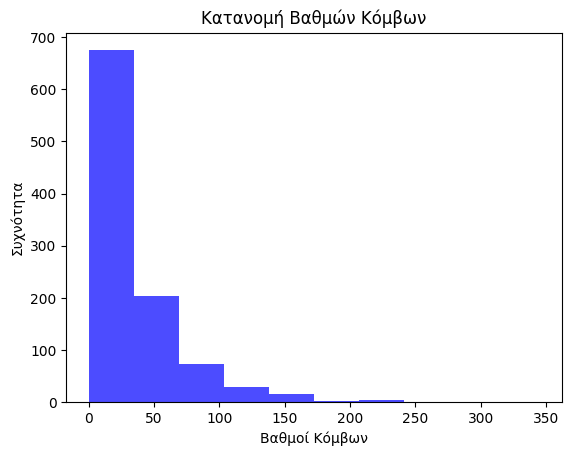

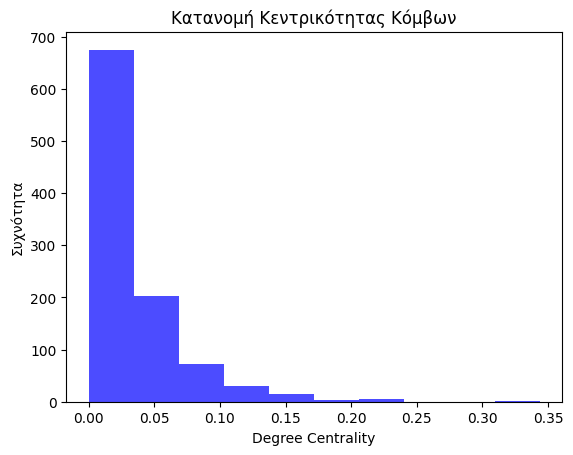



Football network nodes' statistics and graph:
Degree centrality of each node is: {'BrighamYoung': 0.10526315789473684, 'FloridaState': 0.10526315789473684, 'Iowa': 0.10526315789473684, 'KansasState': 0.10526315789473684, 'NewMexico': 0.09649122807017543, 'TexasTech': 0.10526315789473684, 'PennState': 0.10526315789473684, 'SouthernCalifornia': 0.10526315789473684, 'ArizonaState': 0.09649122807017543, 'SanDiegoState': 0.09649122807017543, 'Baylor': 0.08771929824561403, 'NorthTexas': 0.08771929824561403, 'NorthernIllinois': 0.08771929824561403, 'Northwestern': 0.09649122807017543, 'WesternMichigan': 0.08771929824561403, 'Wisconsin': 0.10526315789473684, 'Wyoming': 0.09649122807017543, 'Auburn': 0.09649122807017543, 'Akron': 0.09649122807017543, 'VirginiaTech': 0.09649122807017543, 'Alabama': 0.09649122807017543, 'UCLA': 0.09649122807017543, 'Arizona': 0.09649122807017543, 'Utah': 0.09649122807017543, 'ArkansasState': 0.08771929824561403, 'NorthCarolinaState': 0.09649122807017543, 'BallS

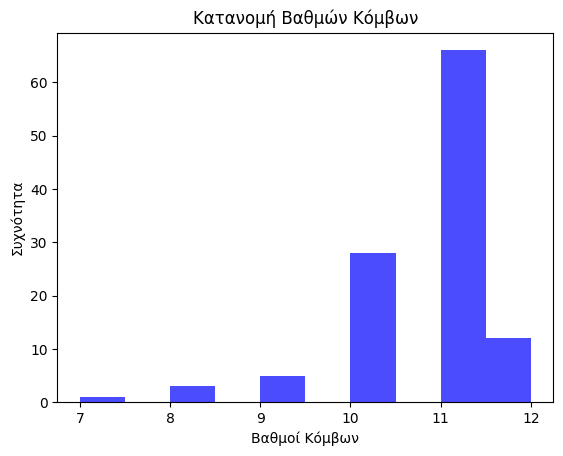

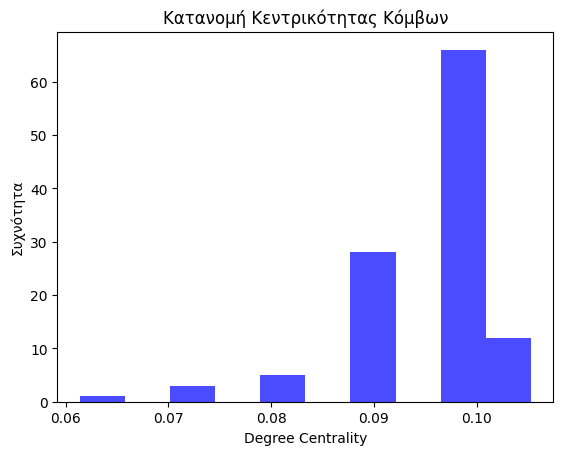



Game of thrones network nodes' statistics and graph:
Degree centrality of each node is: {'ARYA': 0.09322033898305085, 'JAQEN': 0.05084745762711865, 'JORAH': 0.09322033898305085, 'TYRION': 0.16101694915254236, 'BRONN': 0.1016949152542373, 'JAIME': 0.1440677966101695, 'VARYS': 0.059322033898305086, 'DAENERYS': 0.11864406779661017, 'CERSEI': 0.2542372881355932, 'HIGH_SPARROW': 0.09322033898305085, 'BRIENNE': 0.06779661016949153, 'PODRICK': 0.05084745762711865, 'JON': 0.211864406779661, 'STANNIS': 0.2033898305084746, 'LITTLEFINGER': 0.211864406779661, 'SANSA': 0.17796610169491525, 'SAM': 0.1694915254237288, 'GILLY': 0.1016949152542373, 'DAARIO': 0.0847457627118644, 'MARGAERY': 0.06779661016949153, 'TOMMEN': 0.1016949152542373, 'THEON': 0.0847457627118644, 'HIZDAHR': 0.0847457627118644, 'DAVOS': 0.07627118644067797, 'TORMUND': 0.06779661016949153, 'MYRCELLA': 0.06779661016949153, 'MYRANDA': 0.05084745762711865, 'RAMSAY': 0.06779661016949153, 'MELISANDRE': 0.0847457627118644, 'ROOSE_BOLTON

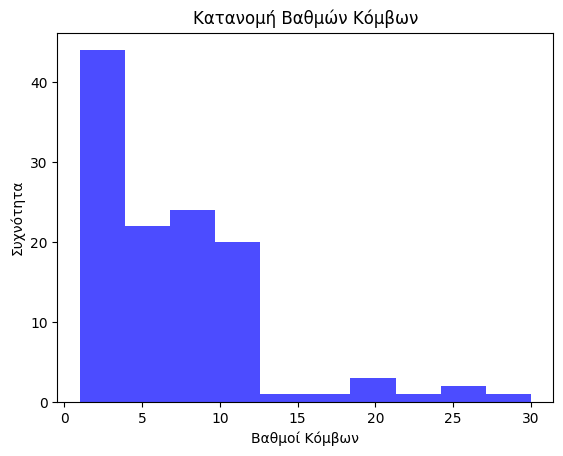

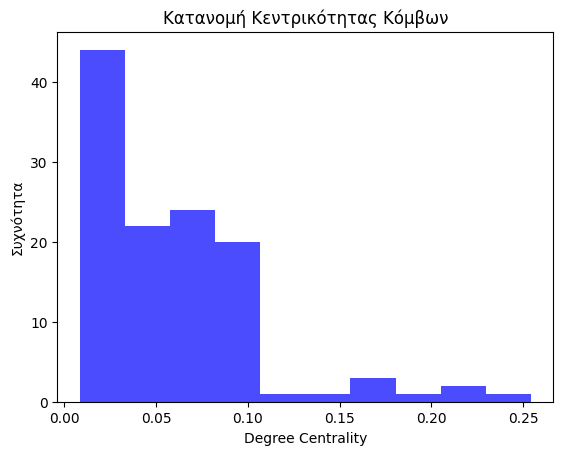



REG network nodes' statistics and graph:
Degree centrality of each node is: {0: 0.05063291139240506, 1: 0.05063291139240506, 2: 0.05063291139240506, 3: 0.05063291139240506, 4: 0.05063291139240506, 5: 0.05063291139240506, 6: 0.05063291139240506, 7: 0.05063291139240506, 8: 0.05063291139240506, 9: 0.05063291139240506, 10: 0.05063291139240506, 11: 0.05063291139240506, 12: 0.05063291139240506, 13: 0.05063291139240506, 14: 0.05063291139240506, 15: 0.05063291139240506, 16: 0.05063291139240506, 17: 0.05063291139240506, 18: 0.05063291139240506, 19: 0.05063291139240506, 20: 0.05063291139240506, 21: 0.05063291139240506, 22: 0.05063291139240506, 23: 0.05063291139240506, 24: 0.05063291139240506, 25: 0.05063291139240506, 26: 0.05063291139240506, 27: 0.05063291139240506, 28: 0.05063291139240506, 29: 0.05063291139240506, 30: 0.05063291139240506, 31: 0.05063291139240506, 32: 0.05063291139240506, 33: 0.05063291139240506, 34: 0.05063291139240506, 35: 0.05063291139240506, 36: 0.05063291139240506, 37: 0.

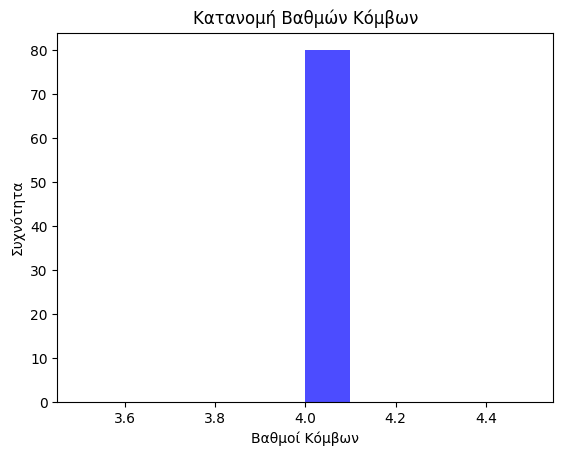

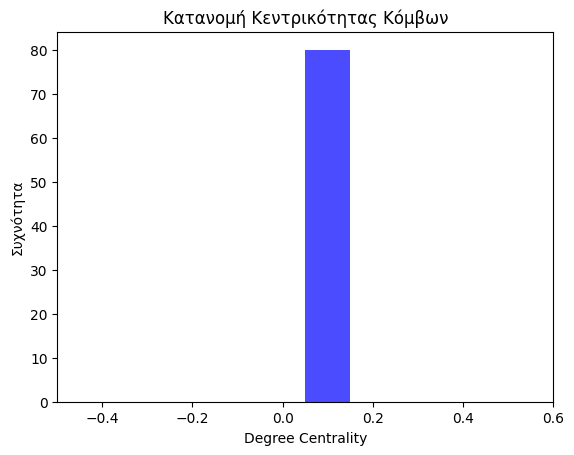



RGER network nodes' statistics and graph:
Degree centrality of each node is: {0: 0.0759493670886076, 1: 0.0759493670886076, 2: 0.0759493670886076, 3: 0.08860759493670886, 4: 0.17721518987341772, 5: 0.08860759493670886, 6: 0.08860759493670886, 7: 0.08860759493670886, 8: 0.13924050632911392, 9: 0.06329113924050633, 10: 0.08860759493670886, 11: 0.06329113924050633, 12: 0.05063291139240506, 13: 0.06329113924050633, 14: 0.08860759493670886, 15: 0.10126582278481013, 16: 0.06329113924050633, 17: 0.12658227848101267, 18: 0.12658227848101267, 19: 0.11392405063291139, 20: 0.13924050632911392, 21: 0.10126582278481013, 22: 0.08860759493670886, 23: 0.16455696202531644, 24: 0.0379746835443038, 25: 0.12658227848101267, 26: 0.0759493670886076, 27: 0.06329113924050633, 28: 0.0759493670886076, 29: 0.02531645569620253, 30: 0.11392405063291139, 31: 0.08860759493670886, 32: 0.11392405063291139, 33: 0.05063291139240506, 34: 0.06329113924050633, 35: 0.11392405063291139, 36: 0.11392405063291139, 37: 0.22784

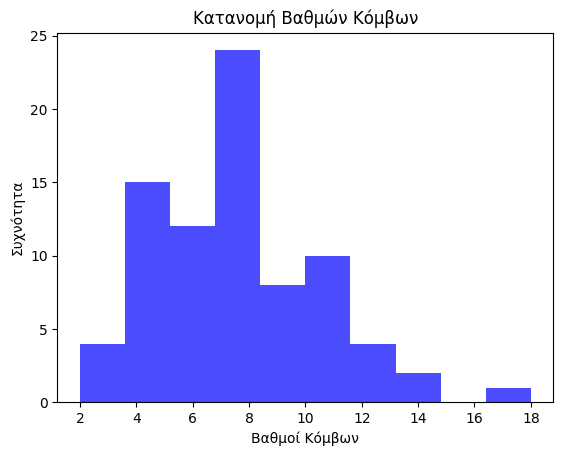

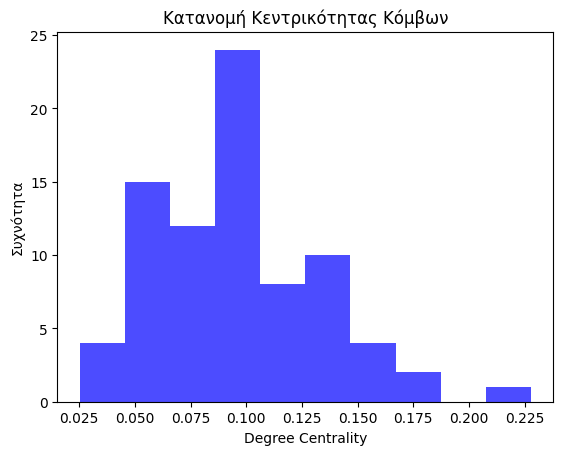



RGG network nodes' statistics and graph:
Degree centrality of each node is: {0: 0.21518987341772153, 1: 0.18987341772151897, 2: 0.20253164556962025, 3: 0.0759493670886076, 4: 0.10126582278481013, 5: 0.0759493670886076, 6: 0.13924050632911392, 7: 0.16455696202531644, 8: 0.11392405063291139, 9: 0.16455696202531644, 10: 0.0759493670886076, 11: 0.08860759493670886, 12: 0.12658227848101267, 13: 0.11392405063291139, 14: 0.16455696202531644, 15: 0.11392405063291139, 16: 0.12658227848101267, 17: 0.17721518987341772, 18: 0.17721518987341772, 19: 0.16455696202531644, 20: 0.0759493670886076, 21: 0.1518987341772152, 22: 0.10126582278481013, 23: 0.1518987341772152, 24: 0.10126582278481013, 25: 0.18987341772151897, 26: 0.10126582278481013, 27: 0.13924050632911392, 28: 0.06329113924050633, 29: 0.0379746835443038, 30: 0.22784810126582278, 31: 0.11392405063291139, 32: 0.1518987341772152, 33: 0.06329113924050633, 34: 0.17721518987341772, 35: 0.21518987341772153, 36: 0.12658227848101267, 37: 0.18987341

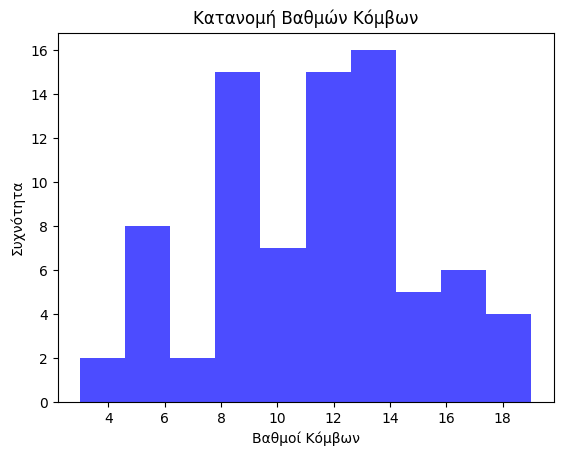

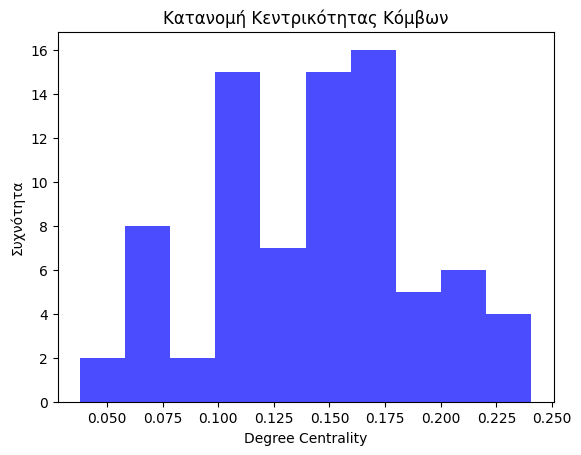



SF network nodes' statistics and graph:
Degree centrality of each node is: {0: 0.3291139240506329, 1: 0.24050632911392406, 2: 0.11392405063291139, 3: 0.21518987341772153, 4: 0.3291139240506329, 5: 0.18987341772151897, 6: 0.3037974683544304, 7: 0.22784810126582278, 8: 0.24050632911392406, 9: 0.12658227848101267, 10: 0.1518987341772152, 11: 0.10126582278481013, 12: 0.18987341772151897, 13: 0.08860759493670886, 14: 0.16455696202531644, 15: 0.12658227848101267, 16: 0.10126582278481013, 17: 0.1518987341772152, 18: 0.11392405063291139, 19: 0.11392405063291139, 20: 0.06329113924050633, 21: 0.06329113924050633, 22: 0.08860759493670886, 23: 0.0759493670886076, 24: 0.11392405063291139, 25: 0.17721518987341772, 26: 0.06329113924050633, 27: 0.06329113924050633, 28: 0.0759493670886076, 29: 0.10126582278481013, 30: 0.08860759493670886, 31: 0.06329113924050633, 32: 0.05063291139240506, 33: 0.10126582278481013, 34: 0.06329113924050633, 35: 0.08860759493670886, 36: 0.05063291139240506, 37: 0.08860759

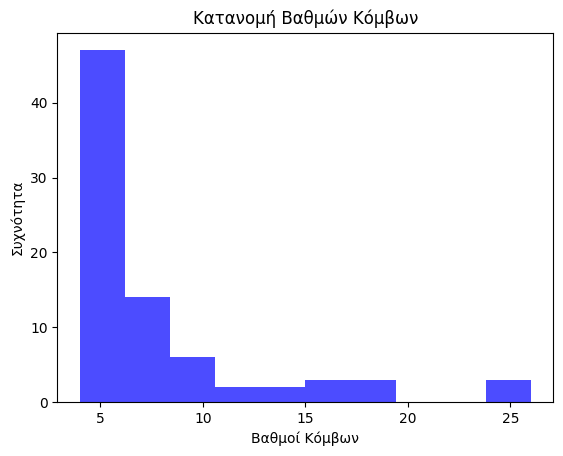

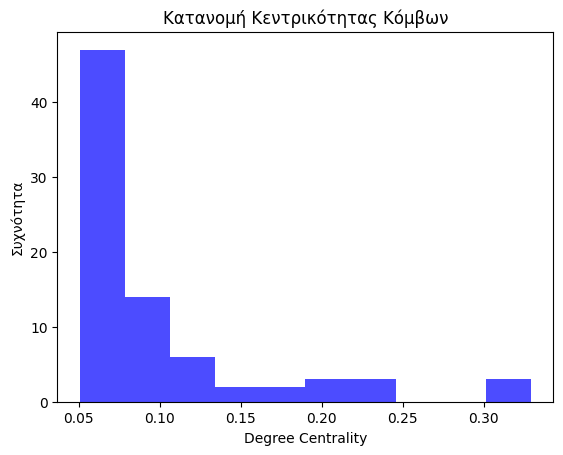



SW network nodes' statistics and graph:
Degree centrality of each node is: {0: 0.05063291139240506, 1: 0.0379746835443038, 2: 0.05063291139240506, 3: 0.06329113924050633, 4: 0.06329113924050633, 5: 0.0379746835443038, 6: 0.05063291139240506, 7: 0.0379746835443038, 8: 0.05063291139240506, 9: 0.0379746835443038, 10: 0.05063291139240506, 11: 0.05063291139240506, 12: 0.0379746835443038, 13: 0.0379746835443038, 14: 0.0379746835443038, 15: 0.0379746835443038, 16: 0.0379746835443038, 17: 0.05063291139240506, 18: 0.0379746835443038, 19: 0.05063291139240506, 20: 0.0379746835443038, 21: 0.0379746835443038, 22: 0.0379746835443038, 23: 0.06329113924050633, 24: 0.05063291139240506, 25: 0.0379746835443038, 26: 0.0379746835443038, 27: 0.06329113924050633, 28: 0.05063291139240506, 29: 0.0379746835443038, 30: 0.05063291139240506, 31: 0.06329113924050633, 32: 0.0379746835443038, 33: 0.0379746835443038, 34: 0.06329113924050633, 35: 0.05063291139240506, 36: 0.06329113924050633, 37: 0.05063291139240506, 

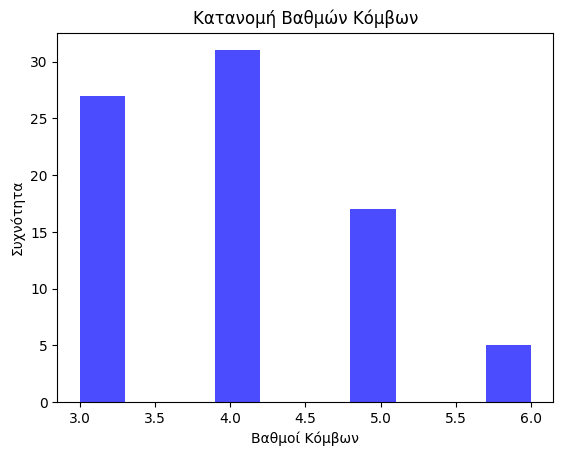

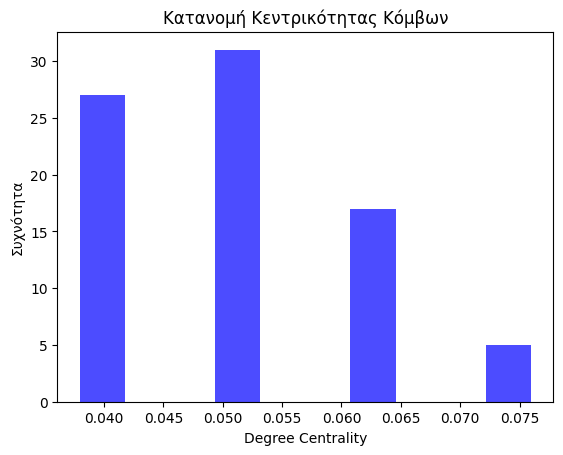

In [17]:
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

graphs=[]
graphs_c=[]
def degree(G):
  degree_centrality=nx.degree_centrality(G)
  degree=nx.degree(G)
  degrees=[G.degree(node) for node in G.nodes]
  mean_degree=np.mean(degrees)
  mean_degree_centrality=sum(degree_centrality.values())/len(degree_centrality)
  var_degree=(sum([(d-mean_degree)**2 for d in degrees]))/len(degrees)
  var_degree_centrality=sum([(d-mean_degree_centrality)**2 for d in degree_centrality.values()]) /len(degree_centrality)
  print(f"Degree centrality of each node is: {degree_centrality}\nDegree of each node is: {degree}")
  print(f"Mean degree centrality is: {mean_degree_centrality}\nMean degree is: {mean_degree}")
  print(f"Variance of degree centrality is: {var_degree_centrality}\nVariance of degree is: {var_degree}")
  graphs.append(degrees)
  graphs_c.append(degree_centrality.values())
  print(f"This network has {len(G.nodes)} nodes\n")
  plt.hist(degrees, bins=10, alpha=0.7, color='b')
  plt.xlabel('Βαθμοί Κόμβων')
  plt.ylabel('Συχνότητα')
  plt.title('Κατανομή Βαθμών Κόμβων')
  plt.show()
  plt.hist(degree_centrality.values(), bins=10, alpha=0.7, color='b')
  plt.xlabel('Degree Centrality')
  plt.ylabel('Συχνότητα')
  plt.title('Κατανομή Κεντρικότητας Κόμβων')
  plt.show()


eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)

print("EU network nodes' statistics and graph:")
degree(eu)
print("\n")

print("Football network nodes' statistics and graph:")
degree(football)
print("\n")


print("Game of thrones network nodes' statistics and graph:")
degree(got)
print("\n")

print("REG network nodes' statistics and graph:")
degree(REG)
print("\n")

print("RGER network nodes' statistics and graph:")
degree(RGER)
print("\n")

print("RGG network nodes' statistics and graph:")
degree(RGG)
print("\n")

print("SF network nodes' statistics and graph:")
degree(SF)
print("\n")

print("SW network nodes' statistics and graph:")
degree(SW)
print("\n")


#Στο προηγούμενο ερώτημα ορίσαμε τις συνδεδεμένες συνθετικές τοπολογίες REG, RGER, RGG, SF και SW, με 80 κόμβους το κάθε ένα.
#Από εκεί και πέρα έχουμε τα πραγματικά συνδεδεμένα και κατευθυνόμενα  δίκτυα eu, football  και Game of Thrones
#Από το δίκτυο eu  παίρνουμε τη μεγαλύτερη συνδεδεμένη συνιστώσα. Η συνιστώσα αυτή έχει 1005 κόμβους.
#Το δίκτυο footbal έχει 115 κόμβους.
#Το δίκτυο got έχει 119 κόμβους.
#Όπως είναι απόλυτα λογικό λοιπόν, το δίκτυο eu έχει το μέγαλυτερο μέσο όρο βαθμού συνδεδεμένων κόμβων.
#Συγκεκριμένα κάθε κόμβος του συνδέεται συνήθως με περίπου 32 κόμβους. Από εκεί και πέρα ο μέσος όρος πέφτει αρκετά.
#Ακολουθούν τα δίκτυα RGG και football με 11.25 και 10.66 μέσο όρο βαθμών αντίστοιχα.
#Το δίκτυο RGG είναι ένας τύπος γράφου όπου οι κόμβοι τοποθετούνται τυχαία και αυτό οδηγεί σε μεγάλη ποικιλία όσο αφορά την απόσταση μεταξύ
#τους. Αυτό σημαίνει ότι οι κόμβοι που βρίσκονται κάτω από μία συγκεκριμένη απόσταση , συνδέονται περισσότερο μεταξύ τους.
#Από εκεί και πέρα ακολουθούν οι συνθετικές τοπολογίες RGER και SF με περίπου 7,5 κόμβους μέσο όρο.
#Ακολουθεί το πραγματικό δίκτυο got με 6.65
#Τέλος ακολουθούν οι συνθετικές τοπολογίες REG και  SW, που ο μέσος όρος είναι γύρω στους 4 κόμβους.

#Τώρα όσο αφορά τη διασπορά των τιμών, το συμπέρασμα είναι κατά κάποιο τρόπο κοινό για όλες τις τοπολογίες και τα δίκτυα.
#Η διασπορά τους είναι πάρα πολύ μικρή γεγονός που δείχνει ότι ο βαθμός κάθει κόμβου απέχει ελάχιστα ή και καθόλου από τη μέση τιμή.

#Το degree centrality για κάθε κόμβο δείχνει το πόσο σημαντικός είναι  ο κόμβος σε ένα δίκτυο.Συνεπώς ο μέσος όρος δείχνει
#το κατά πόσο είναι σημαντικοί οι κόμβοι σε ένα δίκτυο.Αυτό σημαίνει ότι όσο μικρότερη είναι η διαφορά πλήθους κόμβων
#με μέσο όρο βαθμών, τόσο μεγαλύτερο είναι το μέσο  degree centrality για έναν κόμβο.Από την άλλη,
#όσο μεγαλύτερη είναι η διαφορά πλήθους κόμβων με μέσο όρο βαθμών, τόσο μικρότερο είναι το μέσο  degree centrality για έναν κόμβο.
#Για το λόγο αυτό τη μικρότερη αξία και σημαντικότητα πληροφορίας έχουν οι κόμβοι του δικτυού eu.
#Τη μεγαλύτερη αξία και σημαντικότητα πληροφορίας έχουν οι κόμβοι του συνθετικού δικτύου RGG.

#Μέσα από τα παραπάνω στοιχεία και μελετώντας τα γραφήματα καταλήγουμε στα εξής συμπεράσματα:
#Το δίκτυο football έχει πολλά από τα στοιχεία του δικτύου RGG. Είναι χαρακτηριστική η ομοιότητα τους στο μέσο βαθμό συνδεδεδεμένων κόμβων
#ή καλύτερα στο πόσους γείτονες έχουν κατά μέσο όρο καθώς και στα γραφήματα κατανομής των τιμών βαθμού και degree centrality
#Tα δίκτυα got και eu έχουν πολλά από τα στοιχεία του δικτύου SF. Είναι χαρακτηριστική η ομοιότητα τους στα γραφήματα κατανομής
# των τιμών βαθμού και degree centrality.Επίσης το δίκτο got έχει πολύ κοινό μέσο βαθμό κόμβων με τη συγκεκριμένη συνθετική τοπολογία.




<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

EU network nodes' statistics and graph:
Clustering coefficient of each node is: {'0': 0.2764227642276423, '1': 0.2653061224489796, '2': 0.2978027115474521, '3': 0.38491048593350385, '4': 0.31869137497140243, '5': 0.10700197238658778, '6': 0.15518331226295828, '7': 0.28778467908902694, '8': 0.4470588235294118, '9': 0.42532005689900426, '10': 0.3154486586493987, '11': 0.22917437985931136, '12': 0.3025974025974026, '13': 0.11089951120421507, '14': 0.21578421578421578, '15': 0.3526530612244898, '16': 0.28470936690114773, '17': 0.28593272171253825, '18': 0.30118798043326345, '19': 0.28322981366459626, '20': 0.28482003129890454, '21': 0.24803921568627452, '22': 0.38461538461538464, '23': 0.3427458617332035, '24': 0.38549075391180654, '25': 0.48295454545454547, '26': 0.5208333333333334, '27': 0.36885245901639346, '28': 0.34475537787930705, '29': 0.3935064935064935, '30': 0.4027972027972028, '31': 0.4122340425531915, '32': 0.5473484848484849, '33': 0.5793650793650794, '34': 0.6379310344827587,

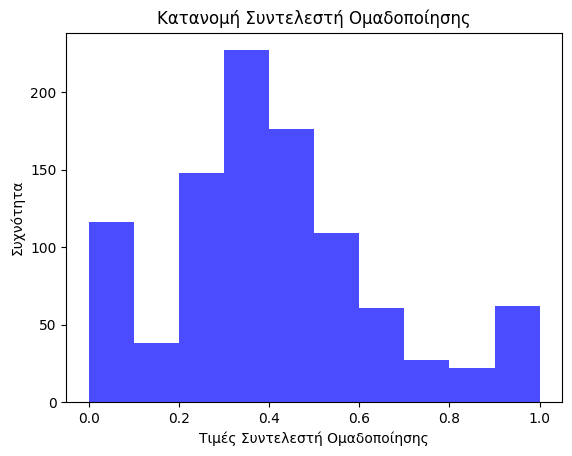



Football network nodes' statistics and graph:
Clustering coefficient of each node is: {'BrighamYoung': 0.3484848484848485, 'FloridaState': 0.4393939393939394, 'Iowa': 0.3787878787878788, 'KansasState': 0.3333333333333333, 'NewMexico': 0.41818181818181815, 'TexasTech': 0.36363636363636365, 'PennState': 0.3181818181818182, 'SouthernCalifornia': 0.3939393939393939, 'ArizonaState': 0.4727272727272727, 'SanDiegoState': 0.4727272727272727, 'Baylor': 0.4444444444444444, 'NorthTexas': 0.3111111111111111, 'NorthernIllinois': 0.3333333333333333, 'Northwestern': 0.38181818181818183, 'WesternMichigan': 0.37777777777777777, 'Wisconsin': 0.3484848484848485, 'Wyoming': 0.41818181818181815, 'Auburn': 0.34545454545454546, 'Akron': 0.4, 'VirginiaTech': 0.43636363636363634, 'Alabama': 0.36363636363636365, 'UCLA': 0.45454545454545453, 'Arizona': 0.509090909090909, 'Utah': 0.45454545454545453, 'ArkansasState': 0.2222222222222222, 'NorthCarolinaState': 0.509090909090909, 'BallState': 0.3333333333333333, '

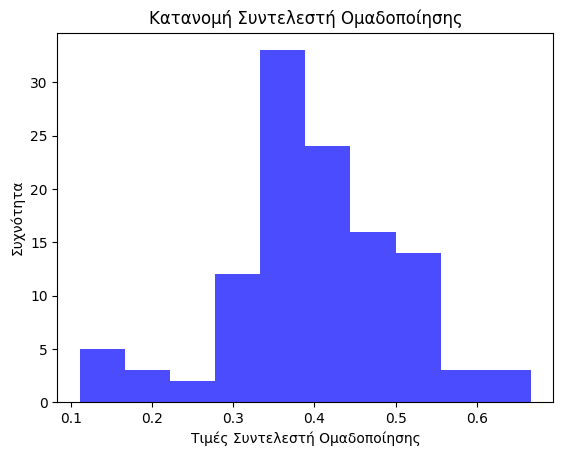



Game of thrones network nodes' statistics and graph:
Clustering coefficient of each node is: {'ARYA': 0.2727272727272727, 'JAQEN': 0.8, 'JORAH': 0.4909090909090909, 'TYRION': 0.23976608187134502, 'BRONN': 0.3939393939393939, 'JAIME': 0.3235294117647059, 'VARYS': 0.47619047619047616, 'DAENERYS': 0.4065934065934066, 'CERSEI': 0.1724137931034483, 'HIGH_SPARROW': 0.36363636363636365, 'BRIENNE': 0.39285714285714285, 'PODRICK': 0.5333333333333333, 'JON': 0.22, 'STANNIS': 0.2572463768115942, 'LITTLEFINGER': 0.18333333333333332, 'SANSA': 0.20952380952380953, 'SAM': 0.30526315789473685, 'GILLY': 0.5606060606060606, 'DAARIO': 0.6666666666666666, 'MARGAERY': 0.6785714285714286, 'TOMMEN': 0.3787878787878788, 'THEON': 0.4888888888888889, 'HIZDAHR': 0.6, 'DAVOS': 0.7777777777777778, 'TORMUND': 0.4642857142857143, 'MYRCELLA': 0.7857142857142857, 'MYRANDA': 1.0, 'RAMSAY': 0.6428571428571429, 'MELISANDRE': 0.7333333333333333, 'ROOSE_BOLTON': 0.4, 'WAIF': 1.0, 'SHIREEN': 0.9523809523809523, 'QYBURN': 

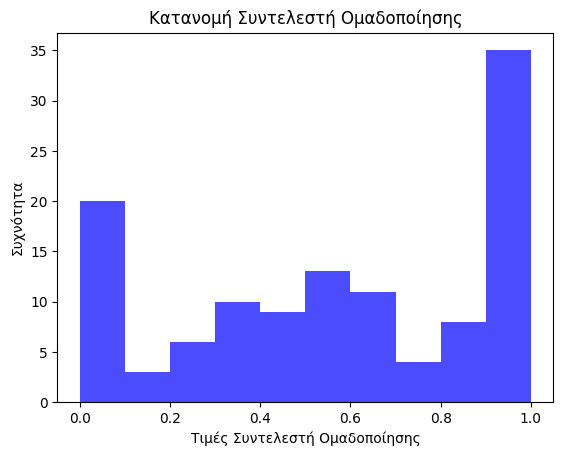



REG network nodes' statistics and graph:
Clustering coefficient of each node is: {0: 0.5, 1: 0.5, 2: 0.5, 3: 0.5, 4: 0.5, 5: 0.5, 6: 0.5, 7: 0.5, 8: 0.5, 9: 0.5, 10: 0.5, 11: 0.5, 12: 0.5, 13: 0.5, 14: 0.5, 15: 0.5, 16: 0.5, 17: 0.5, 18: 0.5, 19: 0.5, 20: 0.5, 21: 0.5, 22: 0.5, 23: 0.5, 24: 0.5, 25: 0.5, 26: 0.5, 27: 0.5, 28: 0.5, 29: 0.5, 30: 0.5, 31: 0.5, 32: 0.5, 33: 0.5, 34: 0.5, 35: 0.5, 36: 0.5, 37: 0.5, 38: 0.5, 39: 0.5, 40: 0.5, 41: 0.5, 42: 0.5, 43: 0.5, 44: 0.5, 45: 0.5, 46: 0.5, 47: 0.5, 48: 0.5, 49: 0.5, 50: 0.5, 51: 0.5, 52: 0.5, 53: 0.5, 54: 0.5, 55: 0.5, 56: 0.5, 57: 0.5, 58: 0.5, 59: 0.5, 60: 0.5, 61: 0.5, 62: 0.5, 63: 0.5, 64: 0.5, 65: 0.5, 66: 0.5, 67: 0.5, 68: 0.5, 69: 0.5, 70: 0.5, 71: 0.5, 72: 0.5, 73: 0.5, 74: 0.5, 75: 0.5, 76: 0.5, 77: 0.5, 78: 0.5, 79: 0.5}
Mean clustering coefficient is: 0.5
Variance of clustering coefficient is: 0.0



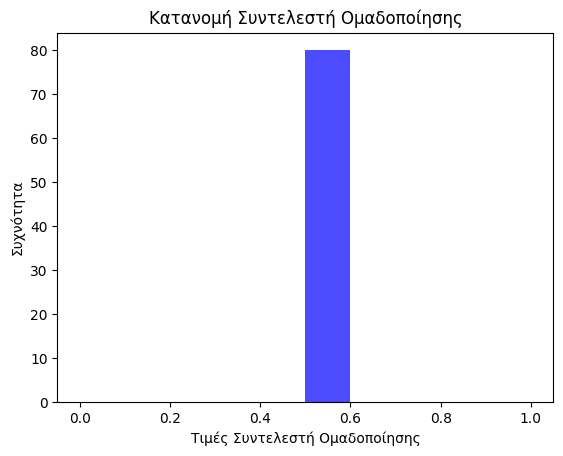



RGER network nodes' statistics and graph:
Clustering coefficient of each node is: {0: 0.06666666666666667, 1: 0.06666666666666667, 2: 0, 3: 0.047619047619047616, 4: 0.08791208791208792, 5: 0.19047619047619047, 6: 0.14285714285714285, 7: 0.09523809523809523, 8: 0.07272727272727272, 9: 0.2, 10: 0.047619047619047616, 11: 0.2, 12: 0, 13: 0, 14: 0.09523809523809523, 15: 0.10714285714285714, 16: 0, 17: 0.1111111111111111, 18: 0.15555555555555556, 19: 0, 20: 0.09090909090909091, 21: 0.03571428571428571, 22: 0, 23: 0.11538461538461539, 24: 0, 25: 0.17777777777777778, 26: 0.13333333333333333, 27: 0.2, 28: 0, 29: 0, 30: 0.05555555555555555, 31: 0.14285714285714285, 32: 0.05555555555555555, 33: 0, 34: 0, 35: 0.1388888888888889, 36: 0.1388888888888889, 37: 0.08496732026143791, 38: 0.03571428571428571, 39: 0.17857142857142858, 40: 0.14285714285714285, 41: 0.2, 42: 0.06666666666666667, 43: 0.07142857142857142, 44: 0.08888888888888889, 45: 0.06666666666666667, 46: 0.06666666666666667, 47: 0.1111111

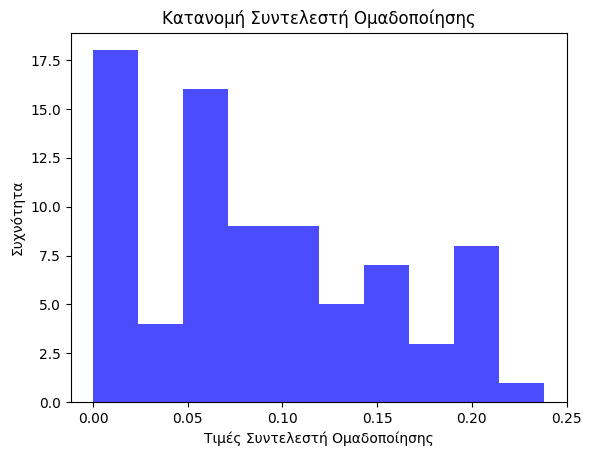



RGG network nodes' statistics and graph:
Clustering coefficient of each node is: {0: 0.6617647058823529, 1: 0.7523809523809524, 2: 0.7666666666666667, 3: 0.6666666666666666, 4: 0.5, 5: 0.7333333333333333, 6: 0.8363636363636363, 7: 0.5, 8: 0.6388888888888888, 9: 0.6923076923076923, 10: 0.8, 11: 0.6666666666666666, 12: 0.4666666666666667, 13: 0.9166666666666666, 14: 0.48717948717948717, 15: 0.6388888888888888, 16: 0.8888888888888888, 17: 0.5824175824175825, 18: 0.7032967032967034, 19: 0.9102564102564102, 20: 0.4666666666666667, 21: 0.6818181818181818, 22: 0.75, 23: 0.48484848484848486, 24: 0.5714285714285714, 25: 0.5904761904761905, 26: 0.5, 27: 0.5818181818181818, 28: 0.9, 29: 1.0, 30: 0.6666666666666666, 31: 0.9166666666666666, 32: 0.5303030303030303, 33: 1.0, 34: 0.7032967032967034, 35: 0.5294117647058824, 36: 0.8444444444444444, 37: 0.6, 38: 0.5897435897435898, 39: 0.7272727272727273, 40: 0.7132352941176471, 41: 0.9444444444444444, 42: 0.4888888888888889, 43: 0.7047619047619048, 44

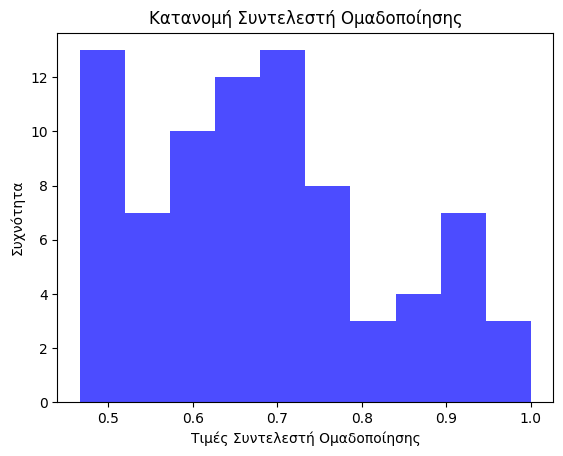



SF network nodes' statistics and graph:
Clustering coefficient of each node is: {0: 0.13538461538461538, 1: 0.15204678362573099, 2: 0.05555555555555555, 3: 0.08823529411764706, 4: 0.11384615384615385, 5: 0.2761904761904762, 6: 0.12318840579710146, 7: 0.09803921568627451, 8: 0.13450292397660818, 9: 0.17777777777777778, 10: 0.10606060606060606, 11: 0.32142857142857145, 12: 0.14285714285714285, 13: 0.23809523809523808, 14: 0.10256410256410256, 15: 0.06666666666666667, 16: 0.35714285714285715, 17: 0.045454545454545456, 18: 0.16666666666666666, 19: 0.19444444444444445, 20: 0, 21: 0.4, 22: 0.14285714285714285, 23: 0.06666666666666667, 24: 0.25, 25: 0.0989010989010989, 26: 0.1, 27: 0, 28: 0.13333333333333333, 29: 0.10714285714285714, 30: 0.14285714285714285, 31: 0.2, 32: 0, 33: 0.03571428571428571, 34: 0.3, 35: 0.047619047619047616, 36: 0.16666666666666666, 37: 0.09523809523809523, 38: 0.5, 39: 0.2, 40: 0.1, 41: 0.6666666666666666, 42: 0.19047619047619047, 43: 0.07142857142857142, 44: 0.095

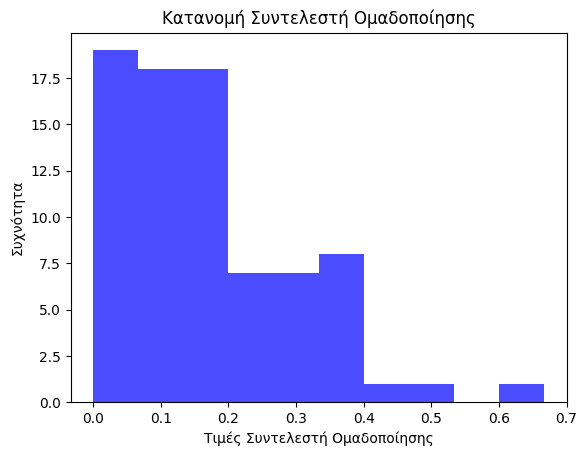



SW network nodes' statistics and graph:
Clustering coefficient of each node is: {0: 0, 1: 0.3333333333333333, 2: 0.3333333333333333, 3: 0.2, 4: 0.2, 5: 0.3333333333333333, 6: 0.16666666666666666, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0.16666666666666666, 18: 0, 19: 0, 20: 0, 21: 0, 22: 0, 23: 0, 24: 0, 25: 0, 26: 0.3333333333333333, 27: 0.1, 28: 0.16666666666666666, 29: 0, 30: 0, 31: 0, 32: 0, 33: 0.3333333333333333, 34: 0.2, 35: 0.3333333333333333, 36: 0.2, 37: 0, 38: 0, 39: 0, 40: 0.16666666666666666, 41: 0.6666666666666666, 42: 0.3, 43: 0.2, 44: 0.3333333333333333, 45: 0.2, 46: 0.2, 47: 0.3, 48: 0.5, 49: 0.13333333333333333, 50: 0.16666666666666666, 51: 0.16666666666666666, 52: 0.3333333333333333, 53: 0.3, 54: 0.5, 55: 0.3, 56: 0.3333333333333333, 57: 0.16666666666666666, 58: 0, 59: 0, 60: 0, 61: 0.3333333333333333, 62: 0.2, 63: 0.5, 64: 0.3333333333333333, 65: 0.2, 66: 0.3333333333333333, 67: 0.3333333333333333, 68: 0.06666666666666667, 69: 0.3333

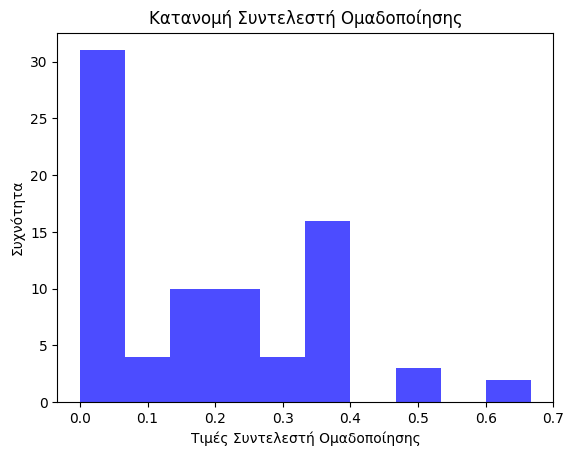

In [73]:
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

graphs=[]
def cc(G):
  clustering_coefficient=nx.clustering(G)
  nodes=list(clustering_coefficient.values())
  mean_cc=np.mean(nodes,axis=0)
  var=np.mean((nodes-mean_cc)**2,axis=0)
  print(f"Clustering coefficient of each node is: {clustering_coefficient}")
  print(f"Mean clustering coefficient is: {mean_cc}")
  print(f"Variance of clustering coefficient is: {var}\n")
  plt.hist(list(clustering_coefficient.values()), bins=10, alpha=0.7, color='b')
  plt.xlabel('Τιμές Συντελεστή Ομαδοποίησης')
  plt.ylabel('Συχνότητα')
  plt.title('Κατανομή Συντελεστή Ομαδοποίησης')
  plt.show()


eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)

print("EU network nodes' statistics and graph:")
cc(subgraph)
print("\n")

print("Football network nodes' statistics and graph:")
cc(football)
print("\n")


print("Game of thrones network nodes' statistics and graph:")
cc(got)
print("\n")

print("REG network nodes' statistics and graph:")
cc(REG)
print("\n")

print("RGER network nodes' statistics and graph:")
cc(RGER)
print("\n")

print("RGG network nodes' statistics and graph:")
cc(RGG)
print("\n")

print("SF network nodes' statistics and graph:")
cc(SF)
print("\n")

print("SW network nodes' statistics and graph:")
cc(SW)
print("\n")


#Ο συντελεστής ομαδοποίησης, γνωστός και ως "συντελεστής συγκέντρωσης" ή "συντελεστής συστηματοποίησης" (clustering coefficient),
#είναι ένα μέτρο που χρησιμοποιείται σε γράφους για να μετρήσει το πόσο συνδεδεμένοι είναι οι γείτονες ενός κόμβου μεταξύ τους.
#Αποτελεί έναν τρόπο να αξιολογηθεί ο βαθμός συμπυκνότητας των συνδέσεων σε ένα γράφο.
#Στη συγκεκριμένη περίπτωση τα πραγατικά μας δίκτυα έχουν αρκετά μεγάλη διαφορά με τα  συνθετικά.
#Τα δίκτυα eu και football έχουν μέσο clustering coefficiet 40%
#Το δίκτυο got έχει  57%
#Από εκεί και πέρα η τοπολογία RGG βρίσκεται στη τάξη του 68%, η REG στο 50% και από εκεί και
#πέρα υπάρχουν πολύ σημαντικές αποκλίσεις αφού SF και SW έχουν clustering coefficient  γύρω στο 15%
#Σε όλες τις περιπτώσεις η διασπορά είναι πολύ μικρή, γεγονός το οποίο σημαίνει ότι ο συντελεστής ομαδοποιήσης
#για κάθε κόμβο δεν διαφέρει σχεδόν καθόλου από τη μέση τιμή.
#Με βάση τα παραπάνω θα έλεγα ότι και τα 3 πραγματικά δίκτυα μοιάζουν στο συνθετικό δίκτυο RGG.
#Αυτή η άποψη τεκμηριώνεται από το γεγονός ότι έχουν την μικρότερη απόκλιση από το μέσο συντελεστή ομαδοποιήσης
#καθώς και απο το γεγονός ότι ταυτίζονται αρκετά με το εύρος τιμων που παίρνουν οι κόμβοι του δικτύου RGG.




<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

EU network nodes' statistics and graph:
Closeness centrality  of each node is: {'0': 0.43013100436681223, '1': 0.430506993006993, '2': 0.47039159503342887, '3': 0.45018281535648996, '4': 0.47106647537063606, '5': 0.5111572392319668, '6': 0.48498276710979815, '7': 0.4282608695652174, '8': 0.42112013681060284, '9': 0.3630667158127534, '10': 0.451007326007326, '11': 0.4395359214636323, '12': 0.44150605109816227, '13': 0.5127537740760021, '14': 0.4505946935041171, '15': 0.43816725978647686, '16': 0.466824644549763, '17': 0.478852698104035, '18': 0.4505946935041171, '19': 0.4499771585198721, '20': 0.460710944808232, '21': 0.497223624432105, '22': 0.38657770800627944, '23': 0.4600653900046707, '24': 0.40585084466419447, '25': 0.42184154175588867, '26': 0.3888669561784445, '27': 0.4385574354407836, '28': 0.4763056092843327, '29': 0.4499771585198721, '30': 0.4518348623853211, '31': 0.42622241453916054, '32': 0.3949478748997594, '33': 0.4010586319218241, '34': 0.389944576405384, '35': 0.4503886

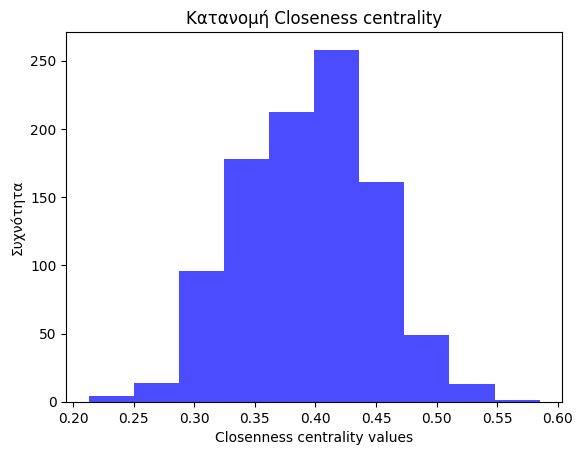



Football network nodes' statistics and graph:
Closeness centrality  of each node is: {'BrighamYoung': 0.42379182156133827, 'FloridaState': 0.41304347826086957, 'Iowa': 0.40714285714285714, 'KansasState': 0.42066420664206644, 'NewMexico': 0.4028268551236749, 'TexasTech': 0.3838383838383838, 'PennState': 0.4253731343283582, 'SouthernCalifornia': 0.4014084507042254, 'ArizonaState': 0.36075949367088606, 'SanDiegoState': 0.397212543554007, 'Baylor': 0.38127090301003347, 'NorthTexas': 0.4028268551236749, 'NorthernIllinois': 0.3904109589041096, 'Northwestern': 0.42066420664206644, 'WesternMichigan': 0.38513513513513514, 'Wisconsin': 0.42379182156133827, 'Wyoming': 0.42379182156133827, 'Auburn': 0.41155234657039713, 'Akron': 0.38, 'VirginiaTech': 0.3904109589041096, 'Alabama': 0.4028268551236749, 'UCLA': 0.397212543554007, 'Arizona': 0.36774193548387096, 'Utah': 0.38513513513513514, 'ArkansasState': 0.42379182156133827, 'NorthCarolinaState': 0.41304347826086957, 'BallState': 0.39860139860139

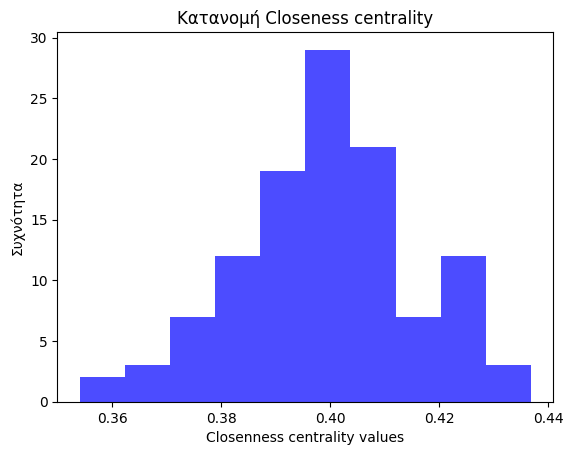



Game of thrones network nodes' statistics and graph:
Closeness centrality  of each node is: {'ARYA': 0.3352272727272727, 'JAQEN': 0.2822966507177033, 'JORAH': 0.3400576368876081, 'TYRION': 0.3881578947368421, 'BRONN': 0.3352272727272727, 'JAIME': 0.40273037542662116, 'VARYS': 0.3746031746031746, 'DAENERYS': 0.3342776203966006, 'CERSEI': 0.4591439688715953, 'HIGH_SPARROW': 0.3653250773993808, 'BRIENNE': 0.39730639730639733, 'PODRICK': 0.4068965517241379, 'JON': 0.37942122186495175, 'STANNIS': 0.4521072796934866, 'LITTLEFINGER': 0.4555984555984556, 'SANSA': 0.44528301886792454, 'SAM': 0.34911242603550297, 'GILLY': 0.3400576368876081, 'DAARIO': 0.29064039408866993, 'MARGAERY': 0.3522388059701492, 'TOMMEN': 0.38436482084690554, 'THEON': 0.3522388059701492, 'HIZDAHR': 0.29064039408866993, 'DAVOS': 0.33618233618233617, 'TORMUND': 0.33146067415730335, 'MYRCELLA': 0.33053221288515405, 'MYRANDA': 0.3430232558139535, 'RAMSAY': 0.3746031746031746, 'MELISANDRE': 0.3342776203966006, 'ROOSE_BOLTON

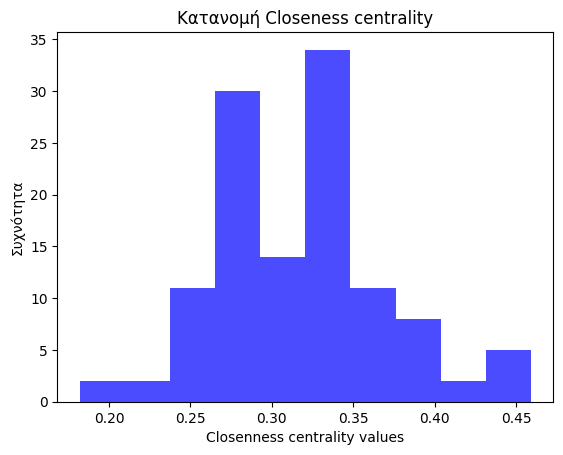



REG network nodes' statistics and graph:
Closeness centrality  of each node is: {0: 0.09634146341463415, 1: 0.09634146341463415, 2: 0.09634146341463415, 3: 0.09634146341463415, 4: 0.09634146341463415, 5: 0.09634146341463415, 6: 0.09634146341463415, 7: 0.09634146341463415, 8: 0.09634146341463415, 9: 0.09634146341463415, 10: 0.09634146341463415, 11: 0.09634146341463415, 12: 0.09634146341463415, 13: 0.09634146341463415, 14: 0.09634146341463415, 15: 0.09634146341463415, 16: 0.09634146341463415, 17: 0.09634146341463415, 18: 0.09634146341463415, 19: 0.09634146341463415, 20: 0.09634146341463415, 21: 0.09634146341463415, 22: 0.09634146341463415, 23: 0.09634146341463415, 24: 0.09634146341463415, 25: 0.09634146341463415, 26: 0.09634146341463415, 27: 0.09634146341463415, 28: 0.09634146341463415, 29: 0.09634146341463415, 30: 0.09634146341463415, 31: 0.09634146341463415, 32: 0.09634146341463415, 33: 0.09634146341463415, 34: 0.09634146341463415, 35: 0.09634146341463415, 36: 0.09634146341463415, 37

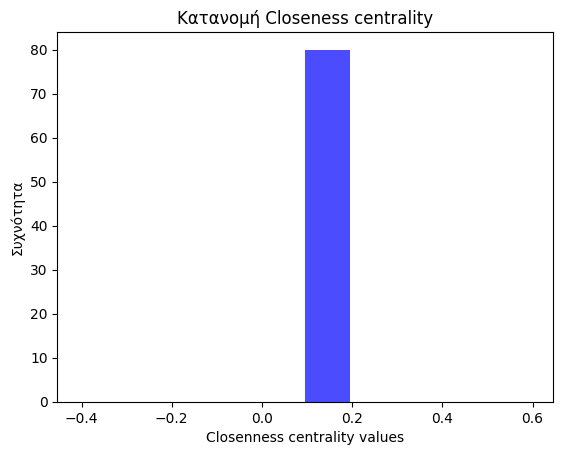



RGER network nodes' statistics and graph:
Closeness centrality  of each node is: {0: 0.4030612244897959, 1: 0.4030612244897959, 2: 0.4072164948453608, 3: 0.42245989304812837, 4: 0.512987012987013, 5: 0.42021276595744683, 6: 0.43169398907103823, 7: 0.42473118279569894, 8: 0.45930232558139533, 9: 0.3910891089108911, 10: 0.4340659340659341, 11: 0.3691588785046729, 12: 0.3761904761904762, 13: 0.3853658536585366, 14: 0.41798941798941797, 15: 0.41798941798941797, 16: 0.395, 17: 0.47023809523809523, 18: 0.441340782122905, 19: 0.44886363636363635, 20: 0.4619883040935672, 21: 0.42021276595744683, 22: 0.41361256544502617, 23: 0.4759036144578313, 24: 0.3574660633484163, 25: 0.47305389221556887, 26: 0.4030612244897959, 27: 0.395, 28: 0.4072164948453608, 29: 0.3172690763052209, 30: 0.4388888888888889, 31: 0.4114583333333333, 32: 0.4388888888888889, 33: 0.4072164948453608, 34: 0.3798076923076923, 35: 0.4619883040935672, 36: 0.45930232558139533, 37: 0.5302013422818792, 38: 0.42702702702702705, 39: 

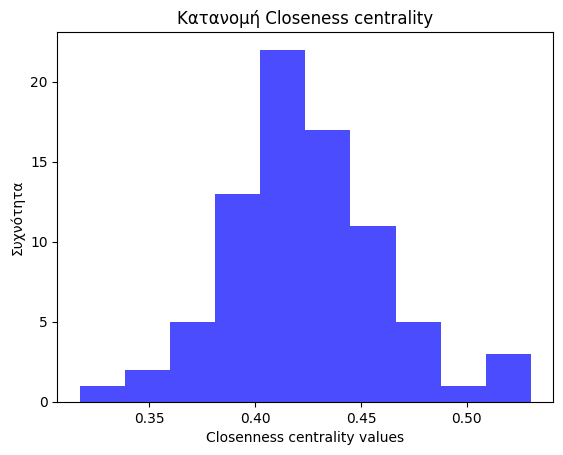



RGG network nodes' statistics and graph:
Closeness centrality  of each node is: {0: 0.37799043062200954, 1: 0.32510288065843623, 2: 0.32644628099173556, 3: 0.28113879003558717, 4: 0.2791519434628975, 5: 0.2344213649851632, 6: 0.3319327731092437, 7: 0.43169398907103823, 8: 0.2801418439716312, 9: 0.32644628099173556, 10: 0.2633333333333333, 11: 0.26421404682274247, 12: 0.30859375, 13: 0.2831541218637993, 14: 0.305019305019305, 15: 0.27147766323024053, 16: 0.305019305019305, 17: 0.4030612244897959, 18: 0.30980392156862746, 19: 0.30859375, 20: 0.2705479452054795, 21: 0.3237704918032787, 22: 0.2651006711409396, 23: 0.398989898989899, 24: 0.29259259259259257, 25: 0.33760683760683763, 26: 0.3110236220472441, 27: 0.3969849246231156, 28: 0.24842767295597484, 29: 0.21066666666666667, 30: 0.33617021276595743, 31: 0.2831541218637993, 32: 0.4114583333333333, 33: 0.22636103151862463, 34: 0.30980392156862746, 35: 0.3574660633484163, 36: 0.2633333333333333, 37: 0.3674418604651163, 38: 0.395, 39: 0.3

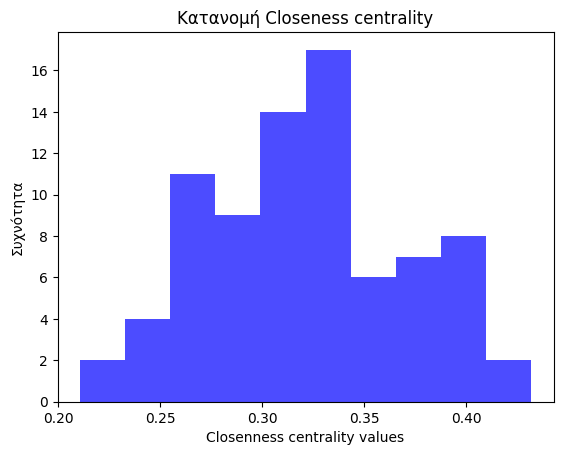



SF network nodes' statistics and graph:
Closeness centrality  of each node is: {0: 0.5939849624060151, 1: 0.5448275862068965, 2: 0.4540229885057471, 3: 0.5064102564102564, 4: 0.5851851851851851, 5: 0.541095890410959, 6: 0.5766423357664233, 7: 0.5524475524475524, 8: 0.5524475524475524, 9: 0.47023809523809523, 10: 0.4759036144578313, 11: 0.47305389221556887, 12: 0.5064102564102564, 13: 0.4514285714285714, 14: 0.5096774193548387, 15: 0.47023809523809523, 16: 0.45930232558139533, 17: 0.47878787878787876, 18: 0.4619883040935672, 19: 0.4619883040935672, 20: 0.43169398907103823, 21: 0.4388888888888889, 22: 0.42934782608695654, 23: 0.42245989304812837, 24: 0.49375, 25: 0.5, 26: 0.4010152284263959, 27: 0.43646408839779005, 28: 0.4514285714285714, 29: 0.4540229885057471, 30: 0.45930232558139533, 31: 0.42245989304812837, 32: 0.41361256544502617, 33: 0.43646408839779005, 34: 0.4438202247191011, 35: 0.44886363636363635, 36: 0.4072164948453608, 37: 0.42021276595744683, 38: 0.43646408839779005, 39:

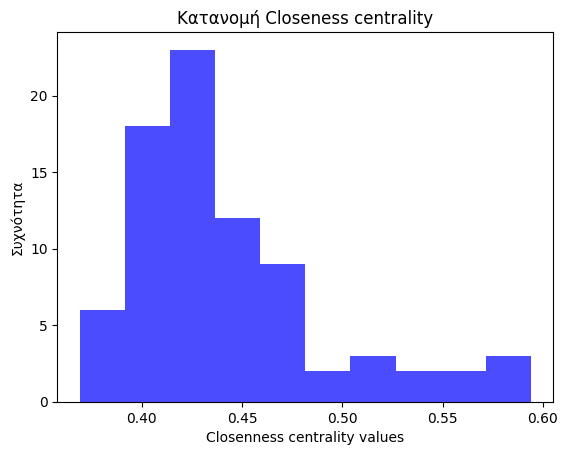



SW network nodes' statistics and graph:
Closeness centrality  of each node is: {0: 0.26245847176079734, 1: 0.24012158054711247, 2: 0.2523961661341853, 3: 0.25901639344262295, 4: 0.27526132404181186, 5: 0.24921135646687698, 6: 0.2762237762237762, 7: 0.2476489028213166, 8: 0.2705479452054795, 9: 0.25901639344262295, 10: 0.29259259259259257, 11: 0.2872727272727273, 12: 0.2801418439716312, 13: 0.2687074829931973, 14: 0.25483870967741934, 15: 0.2581699346405229, 16: 0.246875, 17: 0.2507936507936508, 18: 0.25, 19: 0.2581699346405229, 20: 0.2762237762237762, 21: 0.27147766323024053, 22: 0.2677966101694915, 23: 0.3147410358565737, 24: 0.30268199233716475, 25: 0.2981132075471698, 26: 0.27335640138408307, 27: 0.28214285714285714, 28: 0.2668918918918919, 29: 0.26245847176079734, 30: 0.2523961661341853, 31: 0.2841726618705036, 32: 0.2598684210526316, 33: 0.25732899022801303, 34: 0.2771929824561403, 35: 0.27335640138408307, 36: 0.2831541218637993, 37: 0.27335640138408307, 38: 0.24458204334365324,

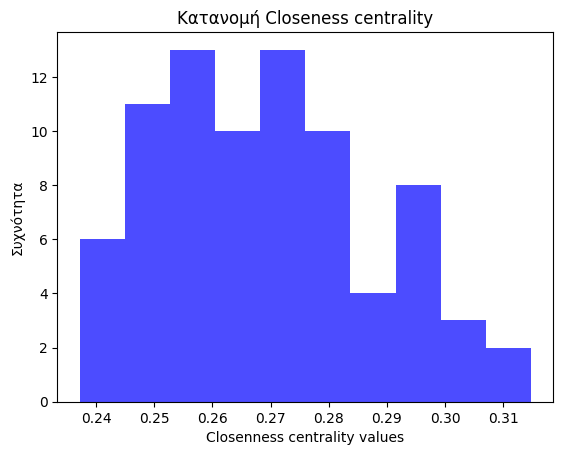

In [18]:
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

def closeness_centrality(G):
  closeness_centrality=nx.closeness_centrality(G)
  clos_values=closeness_centrality.values()
  mean_closeness_centrality=sum(clos_values)/len(clos_values)
  var_closeness_centrality= sum([(value - mean_closeness_centrality)**2 for value in clos_values])/len(clos_values)
  print(f"Closeness centrality  of each node is: {closeness_centrality}")
  print(f"Mean closeness centrality is: {mean_closeness_centrality}")
  print(f"Variance of closeness centrality is: {var_closeness_centrality}\n")
  plt.hist(closeness_centrality.values(),bins=10, alpha=0.7, color="b")
  plt.xlabel("Closenness centrality values")
  plt.ylabel("Συχνότητα")
  plt.title("Κατανομή Closeness centrality")
  plt.show()

eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)

print("EU network nodes' statistics and graph:")
closeness_centrality(subgraph)
print("\n")

print("Football network nodes' statistics and graph:")
closeness_centrality(football)
print("\n")


print("Game of thrones network nodes' statistics and graph:")
closeness_centrality(got)
print("\n")

print("REG network nodes' statistics and graph:")
closeness_centrality(REG)
print("\n")

print("RGER network nodes' statistics and graph:")
closeness_centrality(RGER)
print("\n")

print("RGG network nodes' statistics and graph:")
closeness_centrality(RGG)
print("\n")

print("SF network nodes' statistics and graph:")
closeness_centrality(SF)
print("\n")

print("SW network nodes' statistics and graph:")
closeness_centrality(SW)
print("\n")

#Το Closeness Centrality (κεντρικότητα εγγύτητας) είναι ένα μέτρο κεντρικότητας σε ένα γράφο, το οποίο μετρά την απόσταση ενός κόμβου από
# όλους τους άλλους κόμβους. Στο πλαίσιο του closeness centrality, η κεντρικότητα αυτής της τιμής υποδεικνύει το πόσο εύκολα επιτυγχάνεται η
#σύνδεση ενός  κόμβου με τους υπόλοιπους κόμβους στο γράφο.
#Το closeness centrality είναι υψηλό για κόμβους που είναι "κοντά" σε όλους τους άλλους κόμβους, δηλαδή για κόμβους που απέχουν σε μικρή
#απόσταση από όλα τα υπόλοιπα σημεία του γράφου. Είναι ένα μέτρο κεντρικότητας που εστιάζει στην ευκολία επικοινωνίας ενός κόμβου με το
#υπόλοιπο δίκτυο.
#Μπορεί να χρησιμοποιηθεί για να προσδιορίσει ποιοι κόμβοι είναι πιο κεντρικοί όσον αφορά την γεωμετρία του γράφου.
# Σε κοινωνικά δίκτυα,κόμβοι με υψηλό closeness centrality θεωρούνται πιο "κεντρικοί" επειδή μπορούν να επικοινωνούν με
# άλλους κόμβους πιο γρήγορα.
#Στη συγκεκριμένη περίπτωση τα  δίκτυα κατατάσονται ως προς την μέση κεντρικότητας τους με την εξής σειρά:
#1.SF(44%)
#2.RGER(42%)
#3.football(40%)
#4.eu(39%)
#5.RGG(32%)
#6.got(31%)
#7.SW(27%)
#8.REG(9%)
#Συνεπώς μέσα από τα παραπάνω στοιχεία καταλαβαίνουμε ότι το δίκτυο got μοιάζει με το RGG.
#Τα δίκτυα eu και  football μοιάζουν πολύ ως προς το closeness centrality με τα συνθετικά δίκτυα
#RGER και SF. Ωστόσο επειδή το εύρος τιμών των πραγματικών δικτύων δεν ξεπερνάει το 50% , ενώ το SF ακουμπάει αυτές τις τιμές
#πιστεύω οτί τα 2 αυτά πραγματικά δίκτυα αντιστοιχούν καλύτερα στο συνθετικό δίκτυο RGER



<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [6]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικ΄ές τοπολογίες σε integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping


converted=conv2int(eu,0)
print(converted[0].nodes)
print(converted[1])


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [7]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())


<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p>
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [29]:
%matplotlib inline
import itertools
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random
import networkx as nx
from tqdm import tqdm
import community.community_louvain
#from sklearn.metrics.cluster import performance_score
#from networkx.algorithms.community.quality import performance
from networkx.algorithms.community import  girvan_newman
from networkx.algorithms.community import modularity
#from networkx.algorithms.community import girvan_newman
mod_score={}
community_list=[]
def Girvan_Newman(G):
  max_modularity=0
  max_performance=0

  partitions= nx.community.girvan_newman(G)
  counter=0
  for i in tqdm(range(1,2)):
    for partition in partitions:
      counter+=1
      if len(partition)<=50:
        modularity_score = modularity(G, partition)
        if (modularity_score>max_modularity):
          max_modularity=modularity_score
          partition_modularity=partition
          modularity_length=len(partition)
        performance=nx.algorithms.community.partition_quality(G,partition)
        if (performance[1]>max_performance):
          max_performance=performance[1]
          partition_performance=partition
          performance_length=len(partition)

  print("Girvan Newman's statistics:")
  print(f"Modularity statistics:\nThe partition with the maximum modularity score is: {partition_modularity}\nModularity score: {max_modularity}\nCommunities in partition: {modularity_length}")
  print(f"Performance statistics:\nThe partition with the maximum performance score is: {partition_performance}\nPerformance score: {max_performance}\nCommunities in partition: {performance_length}")
  print(f"There are {counter} partitions\n")
  return partition_modularity, partition_performance,counter

eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())

print("EU network ")
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)
comp = nx.community.girvan_newman(subgraph)
counter=0
max_modularity=0
max_performance=0
limited = itertools.takewhile(lambda c: len(c) <= 50, comp)
for i in tqdm(range(1,2)):
  for partition in limited:
    counter+=1
    if len(partition)<=50:
      modularity_score = modularity(subgraph, partition)
      if (modularity_score>max_modularity):
        eu_max_modularity=modularity_score
        eu_partition_modularity=partition
        modularity_length=len(partition)
      performance=nx.algorithms.community.partition_quality(subgraph,partition)
      if (performance[1]>max_performance):
        eu_max_performance=performance[1]
        eu_partition_performance=partition
        performance_length=len(partition)
print("Girvan Newman's statistics:")
print(f"Modularity statistics:\nThe partition with the maximum modularity score is: {eu_partition_modularity}\nModularity score: {eu_max_modularity}\nCommunities in partition: {modularity_length}")
print(f"Performance statistics:\nThe partition with the maximum performance score is: {eu_partition_performance}\nPerformance score: {eu_max_performance}\nCommunities in partition: {performance_length}")
print(f"There are {counter} partitions\n\n")




print("Ground-Truth results:")
eu_label=nx.read_edgelist("email-Eu-core-department-labels.txt",create_using=nx.Graph())
to_remove=[]
for label in eu_label:
  if (label not in subgraph):
    to_remove.append(label)
for node in to_remove:
  eu_label.remove_node(node)
for i in tqdm(range(1,2)):
  partitions = [{x} for x in eu_label]
  modularity_score = modularity(subgraph, partitions)
  performance=nx.algorithms.community.partition_quality(subgraph,partitions)[1]
print(f"Modularity score:{modularity_score}")
print(f"Performance:{performance}\n")



print("Football network ")
BALL=Girvan_Newman(football)
print("\n")


print("Game of thrones network")
GAME_OF_THRONES=Girvan_Newman(got)
print("\n")

print("REG network ")
reg=Girvan_Newman(REG)
print("\n")

print("RGER network ")
rger=Girvan_Newman(RGER)
print("\n")

print("RGG network")
rgg=Girvan_Newman(RGG)
print("\n")

print("SF network ")
sf=Girvan_Newman(SF)
print("\n")

print("SW network")
sw=Girvan_Newman(SW)
print("\n")

#Στον αλγόριθμο Newman Girvan ο χρόνος διεκπεραίωσης υπολογισμού των διαμερίσεων και των μετρικών τους είναι αρκετά μεγάλος
#σε ορισμένες περιπτώσεις. Συγκεκριένα, για την υλοποίηση του αλγορίθμου πάνω στη μεγαλύτερη συνιστώσα του EU απαιτήθηκαν περίπου 19 λεπτά,
#για το δίκτυο football 8sec, για το δίκτυο got 4sec, ενώ για τα υπόλοιπα δίκτυα απαιτήθηκαν το πολύ 2second.
#Όλα τα δίκτυα πραγματοποίησαν performance πάνω από 90% με το σύνθετο δίκτυο REG να ξεχωρίζει με 97%
#Παράλληλα παρατηρείται πολύ χαμηλό ποσοστό στη μεγαύτερη συνδεδεμενη συνιστώσα του eu.
#Τα αναλυτικά αποτελέσματα όσο αφορά το performance των διαμερίσεων των δικτύων είναι:
#1.REG---97%
#2.SW---96%
#3.football---96%
#4.got---95%
#5.RGG---92%
#6.RGER---92%
#7.SF---91%
#8.eu---13%

#Από την άλλη στο modularity το υψηλότερο score το σημείωσε το συνθετικό δίκτυο REG 72%
#Γενικά το αναλυτικό score  είναι:
#1.REG---72%
#2.got---66%
#3.football---60%
#4.RGG---60%
#5.SW---57%
#6.RGER---21%
#7.SF---16%
#8.EU---0%

#Γενικά μία καλή επίδοση σε performance θεωρείται μία επίδοση της τάξης του 90% και πάνω.
#Στο modularity τιμές από 60% και πάνω. Συνεπώς΄, όλα τα δίκτυα έχουν καλό performance, αλλά
#αλλά στη μετρική modularity τα δίκτυα eu,RGER και SF έχουν πολύ χαμηλή επίδοση. Αυτό μπορείτε να οφείλεται στο γεγονός ότι και τα 3
#δίκτυα , είναι δίκτυα με πολλές ακμές και συνεπώς είναι πιο δύσκολο για αυτά να χωριστούν σε μη επικαλυπτόμενες διαμερίσεις.
#Τώρα όσο αφορά τη σύγκριση ground truth με eu , βλέπουμε πολύ μεγάλή διαφορά τόσο ως προς το modularity score όσο και ως προς το performance.
#Modularity: eu:0.0006 --- ground_truth:-0.002
#Performance: eu:0.13 --- ground_truth:0.96
#Όταν το modularity score  είναι κοντά στο 0 υποδεικνύει ότι οι κόμβοι έχουν συσχετιστεί με τρόπο που δεν αυξάνει τη συνολική πυκνότητα
#των συνδέσεων εντός των κοινοτήτων σε σχέση με ένα τυχαίο μοντέλο. Σε ορισμένες περιπτώσεις, αυτό μπορεί να σημαίνει ότι ο αλγόριθμος
#εντοπισμού κοινοτήτων δεν καταφέρνει να εντοπίσει μια ξεκάθαρη δομή κοινοτήτων στο δίκτυο.
#Ο αλγόριθμος   Girvan Newman παρήγαγε 49 διαμερίσεις , όπου η κάθε μία είχε 50 κοινότητες.
#Για το δίκτυο Game of Thrones το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 8 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 50 communities.
#Για το δίκτυο football το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει  10 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση  17 communities.
#Για το συνθετικό δίκτυο REG το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 8 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 16 communities.
#Για το συνθετικό δίκτυο RGER το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 24 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 34 communities.
#Για το συνθετικό δίκτυο RGG το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 5 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 22 communities.
#Για το συνθετικό δίκτυο SW το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 8 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 31 communities.
#Για το συνθετικό δίκτυο SF το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 23 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 44 communities.
#Βλέπουμε λοιπόν ότι τα δίκτυα got ,eu και SF παράγουν τις διαμερίσεις με τις μεγαλύτερες κοινότητες.


EU network 


100%|██████████| 1/1 [10:00<00:00, 600.15s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({'522', '320', '620', '475', '2', '773', '116', '218', '485', '416', '234', '354', '804', '924', '378', '129', '523', '970', '249', '793', '43', '902', '259', '874', '863', '867', '671', '283', '376', '123', '826', '927', '398', '268', '662', '708', '335', '756', '60', '681', '447', '192', '980', '389', '987', '464', '958', '763', '487', '1002', '456', '250', '783', '383', '717', '52', '362', '357', '438', '828', '427', '979', '611', '269', '137', '108', '896', '602', '613', '77', '738', '967', '509', '71', '428', '308', '419', '262', '933', '845', '803', '956', '796', '920', '167', '23', '408', '572', '458', '213', '88', '364', '629', '243', '345', '394', '492', '109', '615', '38', '495', '991', '634', '50', '379', '339', '858', '106', '174', '207', '472', '254', '235', '735', '114', '786', '300', '348', '0', '550', '995', '403', '334', '7', '443', '800', '448', '315', '224', '134',

100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


Modularity score:-0.0023237168358438793
Performance:0.9669196157370703

Football network 


100%|██████████| 1/1 [00:05<00:00,  5.16s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({'Oregon', 'WashingtonState', 'SanDiegoState', 'OregonState', 'Arizona', 'UCLA', 'SouthernCalifornia', 'Utah', 'Washington', 'ColoradoState', 'AirForce', 'NewMexico', 'California', 'Stanford', 'NevadaLasVegas', 'Wyoming', 'BrighamYoung', 'ArizonaState'}, {'Maryland', 'GeorgiaTech', 'NorthCarolinaState', 'Duke', 'FloridaState', 'WakeForest', 'NorthCarolina', 'Clemson', 'Virginia'}, {'Purdue', 'PennState', 'Michigan', 'Iowa', 'OhioState', 'Wisconsin', 'Indiana', 'Minnesota', 'Northwestern', 'Illinois', 'MichiganState'}, {'Nebraska', 'Colorado', 'Baylor', 'KansasState', 'NotreDame', 'Missouri', 'Texas', 'TexasA&M', 'Kansas', 'IowaState', 'OklahomaState', 'Oklahoma', 'TexasTech'}, {'NewMexicoState', 'NorthTexas', 'UtahState', 'Idaho', 'BoiseState', 'ArkansasState'}, {'WesternMichigan', 'CentralMichigan', 'Buffalo', 'Toledo', 'Connecticut', 'Kent', 'MiamiOhio', 'EasternMichigan', 'Ohio', 

100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({'MERYN_TRANT', 'MACE', 'MADAME', 'WALDER', 'THIN_MAN', 'JAQEN', 'TYCHO', 'ARYA', 'WAIF', 'MOUNTAIN'}, {'SHAE', 'MALKO', 'GREY_WORM', 'JORAH', 'BARRISTAN', 'MOSSADOR', 'AERYS', 'OWNER', 'TYRION', 'QUICK', 'BLACK_HAIRED_PROSTITUTE', 'MISSANDEI', 'HIZDAHR', 'DAARIO', 'STRONG', 'DAENERYS', 'RHAEGAR'}, {'DORNISH_RIDER', 'BRONN', 'LOLLYS', 'OBARA', 'OBERYN', 'JAIME', 'FALYSE', 'NYMERIA', 'ELLARIA', 'TANDA', 'AREO', 'DORAN', 'TRYSTANE', 'MYRCELLA', 'TYENE'}, {'TYWIN', 'OLYVAR', 'VARYS', 'MELARA', 'ROBERT', 'JOFFREY', 'OLENNA', 'SEPTA_UNELLA', 'HIGH_SPARROW', 'CERSEI', 'MAGGY', 'HIGH_SEPTON', 'QYBURN', 'TOMMEN', 'PYCELLE', 'LORAS', 'LANCEL', 'MARGAERY', 'KEVAN'}, {'ROYCE', 'LITTLEFINGER', 'YOHN_ROYCE', 'RICKON', 'RENLY', 'THEON', 'CERWYN', 'WALDA', 'SANSA', 'RAMSAY', 'CATELYN', 'ROBIN', 'NED', 'BRIENNE', 'PODRICK', 'ROOSE_BOLTON', 'LYANNA', 'BRAN', 'ROBB', 'LYSA', 'SELWYN', 'MAESTER_WOLKAN'

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 1, 2, 3, 74, 75, 76, 77, 78, 79}, {4, 5, 6, 7, 8, 9, 10, 11, 12, 13}, {14, 15, 16, 17, 18, 19, 20, 21, 22, 23}, {32, 33, 24, 25, 26, 27, 28, 29, 30, 31}, {34, 35, 36, 37, 38, 39, 40, 41, 42, 43}, {44, 45, 46, 47, 48, 49, 50, 51, 52, 53}, {54, 55, 56, 57, 58, 59, 60, 61, 62, 63}, {64, 65, 66, 67, 68, 69, 70, 71, 72, 73})
Modularity score: 0.7249999999999999
Communities in partition: 8
Performance statistics:
The partition with the maximum performance score is: ({0, 1, 2, 3, 79}, {4, 5, 6, 7, 8}, {9, 10, 11, 12, 13}, {14, 15, 16, 17, 18}, {19, 20, 21, 22, 23}, {24, 25, 26, 27, 28}, {32, 33, 29, 30, 31}, {34, 35, 36, 37, 38}, {39, 40, 41, 42, 43}, {44, 45, 46, 47, 48}, {49, 50, 51, 52, 53}, {54, 55, 56, 57, 58}, {59, 60, 61, 62, 63}, {64, 65, 66, 67, 68}, {69, 70, 71, 72, 73}, {74, 75, 76, 77, 78})
Performance score: 0.9696202531645569
Communities in partition: 16
There are 79 parti

100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 33, 38, 76, 44, 52, 53}, {24, 1}, {32, 2, 4, 70, 7, 9, 75, 45, 14, 79, 16, 17, 47, 51, 58, 60, 30}, {34, 3}, {37, 5, 43, 23, 25, 26}, {35, 6, 8, 20, 59}, {10, 62}, {11, 77, 55}, {12}, {67, 13}, {56, 19, 31, 15}, {18, 66, 36, 21}, {39, 40, 49, 22, 61}, {73, 27}, {28, 63}, {29}, {41, 54}, {42, 46, 71}, {48, 72, 68}, {50}, {57}, {64}, {65, 78}, {74, 69})
Modularity score: 0.21109444444444445
Communities in partition: 24
Performance statistics:
The partition with the maximum performance score is: ({0, 76, 44}, {24, 1}, {2, 7}, {34, 3}, {9, 75, 4, 47}, {25, 37, 5}, {35, 6, 8, 20, 59}, {10, 62}, {11, 77, 55}, {12}, {67, 13}, {14}, {56, 19, 31, 15}, {16}, {17, 45, 30}, {18, 66, 36, 21}, {49, 22}, {26, 43, 23}, {73, 27}, {28, 63}, {29}, {32, 70, 79, 58, 60}, {33}, {52, 53, 38}, {40, 61, 39}, {41, 54}, {42, 46, 71}, {48, 72, 68}, {50}, {51}, {57}, {64}, {65, 78}, {74, 69})
Performance sco

100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 1, 2, 7, 15, 17, 19, 30, 36, 38, 40, 43, 48, 52, 57, 58, 62, 64, 71, 73, 74, 77, 79}, {3, 6, 8, 12, 14, 21, 22, 25, 27, 33, 37, 42, 45, 46, 47, 49, 51, 53, 55, 59, 61, 65, 66, 69, 70, 76}, {68, 4, 50, 26, 63}, {5, 10, 11, 20, 56, 28, 29}, {9, 13, 16, 18, 23, 24, 31, 32, 34, 35, 39, 41, 44, 54, 60, 67, 72, 75, 78})
Modularity score: 0.5970493827160495
Communities in partition: 5
Performance statistics:
The partition with the maximum performance score is: ({0, 1, 2, 36, 71, 40, 73, 74, 43, 77, 48, 19, 52, 57, 58, 30}, {3}, {68, 4, 50, 26, 63}, {5, 10, 11, 20, 56, 28, 29}, {65, 66, 37, 6, 69, 12, 45, 46, 51, 21, 53, 25, 61}, {7}, {33, 70, 8, 42, 14, 47, 49, 22, 59}, {34, 35, 39, 72, 9, 41, 44, 13, 78, 16, 18, 54, 60, 31}, {15}, {17}, {23}, {24}, {27}, {32}, {38}, {55}, {62}, {64}, {67}, {75}, {76}, {79})
Performance score: 0.9291139240506329
Communities in partition: 22
There are 79

100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 1, 4, 5, 6, 7, 9, 11, 12, 14, 16, 17, 18, 20, 21, 22, 30, 32, 38, 39, 41, 43, 46, 48, 52, 54, 59, 60, 63, 64}, {2, 66, 3, 8, 10, 15, 23, 58, 28, 29, 31}, {68, 13, 79, 71}, {40, 35, 19}, {24, 36}, {25, 77}, {26, 75}, {33, 27, 57}, {34, 37}, {65, 42}, {44, 55}, {50, 45}, {47}, {49}, {56, 51}, {53, 62}, {61}, {67}, {72, 69}, {70}, {73, 78}, {74}, {76})
Modularity score: 0.16744394909972285
Communities in partition: 23
Performance statistics:
The partition with the maximum performance score is: ({0, 4, 5, 6, 9, 12, 16}, {1}, {2, 66}, {3, 8, 15, 58, 28}, {38, 7}, {10, 29, 31}, {11}, {13, 79, 71}, {32, 14}, {17, 20}, {18}, {40, 35, 19}, {21}, {22}, {23}, {24, 36}, {25, 77}, {26, 75}, {33, 27, 57}, {30, 39}, {34, 37}, {41}, {65, 42}, {43}, {44, 55}, {50, 45}, {60, 46}, {47}, {48, 64}, {49}, {56, 51}, {52}, {53, 62}, {54}, {59}, {61}, {63}, {67}, {68}, {72, 69}, {70}, {73, 78}, {74}, {76

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 77, 78, 79, 17, 19, 21, 22, 23, 24}, {1, 2, 37, 38, 39}, {66, 3, 68, 69, 70, 71, 72, 73, 74, 75, 67}, {4, 5, 6, 7, 8, 10, 11, 12, 58, 59}, {9, 47, 14, 15, 16, 49, 18, 51, 52, 53, 54, 55, 50, 57, 56, 48}, {13, 20, 26, 27, 28, 29, 30}, {32, 33, 34, 35, 36, 40, 41, 42, 43, 44, 45, 46, 25, 31}, {64, 65, 76, 60, 61, 62, 63})
Modularity score: 0.5741015625
Communities in partition: 8
Performance statistics:
The partition with the maximum performance score is: ({0, 19}, {1, 2}, {3}, {4, 5, 6}, {8, 7}, {16, 9, 18}, {59, 10, 11, 58}, {12}, {13}, {14, 15}, {17, 77, 78, 79}, {20}, {24, 21, 22, 23}, {25}, {26, 27, 28}, {29, 30}, {31}, {32}, {33, 34, 35}, {36, 40, 41, 42, 43}, {37, 38, 39}, {44, 45, 46}, {48, 49, 50, 47}, {51, 52, 53}, {56, 57, 54, 55}, {60, 76}, {64, 65, 61, 62, 63}, {66, 67, 68}, {69, 70, 71}, {72, 73, 74}, {75})
Performance score: 0.9670886075949368
Communities in partitio

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,50 Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [28]:
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random
import networkx as nx
import community.community_louvain
from networkx.algorithms.community import modularity
from sklearn.cluster import SpectralClustering
from tqdm import tqdm


def  Spectral_Clustering(G):
  max_modularity=0
  max_performance=0
  nodes=G.number_of_nodes()
  adj_matrix = nx.adjacency_matrix(G).toarray(order='C')
  for i in tqdm(range(2,min(51,nodes))):
    clustering = SpectralClustering(n_clusters=i, assign_labels='discretize',affinity='precomputed',random_state=0).fit(adj_matrix)
    partition_labels=clustering.labels_
    #print(partition_labels)
    communities=[set(np.where(partition_labels==j)[0])for j in range(i)]
    modularity_score=nx.algorithms.community.modularity(G, communities)
    if (modularity_score>max_modularity):
      max_modularity=modularity_score
      partition_modularity=communities
      modularity_length=len(communities)
    performance=nx.algorithms.community.partition_quality(G,communities)[1]
    if (performance>max_performance):
      max_performance=performance
      partition_performance=communities
      perfomance_length=len(communities)


  print("Spectral Clustering algorithm's statistics:")
  print(f"Modularity statistics:\nThe partition with the maximum modularity score is: {partition_modularity}\nModularity score: {max_modularity}\nCommunities in partition: {modularity_length}")
  print(f"Performance statistics:\nThe partition with the maximum performance score is: {partition_performance}\nPerformance score: {max_performance}\nCommunities in partition: {perfomance_length}\n\n")

  return partition_modularity, partition_performance



print("EU network ")
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)
E=conv2int(subgraph,0)
EU=Spectral_Clustering(E[0])



print("Ground-Truth results:")
eu_label=nx.read_edgelist("email-Eu-core-department-labels.txt",create_using=nx.Graph())
to_remove=[]
for label in eu_label:
  if (label not in subgraph):
    to_remove.append(label)
for node in to_remove:
  eu_label.remove_node(node)
for i in tqdm(range(1,2)):
  partitions = [{x} for x in eu_label]
  modularity_score = modularity(subgraph, partitions)
  performance=nx.algorithms.community.partition_quality(subgraph,partitions)[1]
print(f"Modularity score:{modularity_score}")
print(f"Performance:{performance}")
print(f"Communities in partition:{len(partitions)}\n\n")



print("Football network ")
f=conv2int(football,0)
BALL_spectral_clustering=Spectral_Clustering(f[0])
print("\n")

print("Game of thrones network")
g=conv2int(got,0)
GAME_OF_THRONES_spectral_clustering=Spectral_Clustering(g[0])
print("\n")



print("REG network ")
reg_spectral_clustering=Spectral_Clustering(REG)
print("\n")

print("RGER network ")
rger_spectral_clustering=Spectral_Clustering(RGER)
print("\n")

print("RGG network")
rgg_spectral_clustering=Spectral_Clustering(RGG)
print("\n")

print("SF network ")
sf_spectral_clustering=Spectral_Clustering(SF)
print("\n")

print("SW network")
sw_spectral_clustering=Spectral_Clustering(SW)
print("\n")


#Στον αλγόριθμο Spectral Clustering ο χρόνος διεκπεραίωσης υπολογισμού των διαμερίσεων και των μετρικών τους είναι πολυ μικρότερος
#από ότι στον Newman Girvan. Συγκεκριένα, για την υλοποίηση του αλγορίθμου πάνω στη μεγαλύτερη συνιστώσα του EU απαιτήθηκαν 23seconds,
#ενώ για τα υπόλοιπα δίκτυα απαιτήθηκε το πολύ 1second.
#Όλα τα δίκτυα πραγματοποίησαν performance πάνω από 90% με το σύνθετο δίκτυο REG να ξεχωρίζει με 97%
#Τα αναλυτικά αποτελέσματα όσο αφορά το performance των διαμερίσεων των δικτύων είναι:
#1.REG---97%
#2.SW---96%
#3.eu---95%
#4.football---95%
#5.got---95%
#6.RGG---93%
#7.RGER---91%
#8.SF---91%

#Από την άλλη στο modularity το υψηλότερο score το σημείωσε το συνθετικό δίκτυο REG 72%
#Γενικά το αναλυτικό score  είναι:
#1.REG---72%
#2.got---66%
#3.football---60%
#4.RGG---60%
#5.SW---55%
#6.EU---41%
#7.RGER---27%
#8.SF---25%

#Γενικά μία καλή επίδοση σε performance θεωρείται μία επίδοση της τάξης του 90% και πάνω.
#Στο modularity τιμές από 60% και πάνω. Συνεπώς΄, όλα τα δίκτυα έχουν καλό performance, αλλά
#αλλά στη μετρική modularity τα δίκτυα eu,RGER και SF έχουν πολύ χαμηλή επίδοση. Αυτό μπορείτε να οφείλεται στο γεγονός ότι και τα 3
#δίκτυα , είναι δίκτυα με πολλές ακμές και συνεπώς είναι πιο δύσκολο για αυτά να χωριστούν σε μη επικαλυπτόμενες διαμερίσεις.

#Τώρα όσο αφορά τη σύγκριση ground truth με eu , βλέπουμε πολύ μεγάλή διαφορά ως προς το modularity score, αλλά πολύ μικρή
#απόκλιση όσο αφορά το performance.
#Modularity: eu:0.40 --- ground_truth:-0.002
#Performance: eu:0.95 --- ground_truth:0.99
#Όταν το modularity score  είναι κοντά στο 0 υποδεικνύει ότι οι κόμβοι έχουν συσχετιστεί με τρόπο που δεν αυξάνει τη συνολική πυκνότητα
#των συνδέσεων εντός των κοινοτήτων σε σχέση με ένα τυχαίο μοντέλο. Σε ορισμένες περιπτώσεις, αυτό μπορεί να σημαίνει ότι ο αλγόριθμος
#εντοπισμού κοινοτήτων δεν καταφέρνει να εντοπίσει μια ξεκάθαρη δομή κοινοτήτων στο δίκτυο.
#Το γεγονός ότι έχουμε πετύχει τόσο υψηλές τιμές performance δείχνει ότι ο αλγόριθμος έχει επιτύχει σε μεγάλο βαθμό να εντοπίσει τις κοινότητες
#με τρόπο που συμφωνεί με τις πραγματικές, και οι κόμβοι έχουν τοποθετηθεί σε σωστές ομάδες.
#Ο αλγόριθμος Spectral Clustering παρήγαγε 50 διαμερίσεις. Από αυτές η διαμέριση που πέτυχε το μεγαλύτερο modularity score έχει 15 communities,
#ενώ η διαμέριση που πέτυχε το μεγαλύτερο performance έχει 50 communities.
#Για το δίκτυο Game of Thrones το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 7 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 31 communities.
#Για το δίκτυο football το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 11 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 16 communities.
#Για το συνθετικό δίκτυο REG το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 7 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 22 communities.
#Για το συνθετικό δίκτυο RGER το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 6 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 30 communities.
#Για το συνθετικό δίκτυο RGG το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 6 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 11 communities.
#Για το συνθετικό δίκτυο SW το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 6 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 26 communities.
#Για το συνθετικό δίκτυο SF το μεγαλύτερο modularity το πέτυχε η διαμέριση που έχει 3 communities, ενώ το καλύτερο performance
#το πέτυχε μία διαμέριση 35 communities.
#Βλέπουμε λοιπόν ότι τα δίκτυα got ,eu και SF παράγουν τις διαμερίσεις με τις μεγαλύτερες κοινότητες.



EU network 


100%|██████████| 49/49 [00:10<00:00,  4.63it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{779, 782, 656, 404, 916, 918, 678, 819, 697, 185, 698, 323, 97, 98, 99, 100, 101, 102, 353, 354, 617, 752, 754, 371, 124, 125, 638}, {0, 1, 512, 513, 518, 519, 524, 16, 17, 18, 531, 20, 21, 22, 533, 536, 537, 539, 540, 546, 548, 549, 550, 42, 559, 560, 49, 50, 561, 564, 62, 64, 577, 578, 67, 68, 69, 70, 71, 72, 73, 74, 581, 588, 77, 78, 590, 80, 81, 82, 83, 84, 85, 86, 87, 593, 595, 596, 600, 730, 605, 606, 731, 611, 612, 613, 614, 615, 105, 106, 107, 625, 626, 117, 118, 120, 121, 636, 127, 639, 640, 641, 645, 647, 650, 142, 144, 145, 146, 147, 657, 661, 152, 153, 154, 155, 664, 666, 670, 671, 160, 162, 163, 166, 681, 683, 173, 685, 686, 177, 691, 692, 693, 183, 184, 186, 187, 188, 189, 190, 699, 703, 705, 714, 718, 722, 212, 215, 728, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 732, 230, 736, 740, 742, 743, 748, 753, 755, 756, 758, 248, 249, 761, 762

100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


Modularity score:-0.0023237168358438793
Performance:0.9669196157370703
Communities in partition:986


Football network 


100%|██████████| 49/49 [00:00<00:00, 57.52it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{89, 1, 33, 37, 103, 105, 45, 109, 25}, {98, 3, 5, 102, 40, 72, 10, 74, 107, 81, 52, 84}, {32, 64, 2, 100, 6, 39, 106, 13, 15, 47, 60}, {67, 73, 46, 110, 49, 114, 83, 53, 88}, {68, 7, 8, 108, 77, 78, 111, 51, 21, 22}, {34, 99, 36, 38, 71, 42, 43, 12, 14, 18, 85, 54, 26, 61, 31}, {0, 4, 104, 9, 41, 16, 23, 93}, {96, 65, 70, 59, 76, 17, 113, 20, 95, 87, 56, 58, 27, 62, 63}, {35, 101, 79, 80, 82, 19, 55, 94, 29, 30}, {69, 11, 50, 24, 90, 28}, {97, 66, 75, 44, 48, 112, 86, 57, 91, 92}]
Modularity score: 0.6022010863056825
Communities in partition: 11
Performance statistics:
The partition with the maximum performance score is: [{89, 1, 33, 37, 103, 105, 45, 109, 25}, {34, 99, 71, 18, 54, 61, 31}, {68, 7, 8, 108, 77, 78, 111, 51, 21, 22}, {0, 4, 104, 9, 41, 16, 23, 93}, {67, 73, 46, 110, 49, 114, 83, 53, 88}, {66, 75, 44, 48, 112, 86, 57, 91, 92}, {32, 64, 2, 100, 6, 39, 10

100%|██████████| 49/49 [00:01<00:00, 48.45it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{64, 35, 4, 5, 36, 37, 67, 74, 109, 47, 48, 81, 113, 25, 62}, {12, 13, 16, 17, 23, 24, 28, 31, 33, 38, 39, 46, 51, 52, 60, 70, 71, 72, 73, 78, 87, 96, 97, 101, 104, 107, 111, 112, 114, 116, 117, 118}, {8, 9, 19, 20, 32, 40, 41, 49, 50, 54, 55, 61, 63, 66, 68, 69, 77, 85, 95}, {89, 2, 3, 34, 90, 6, 7, 102, 42, 43, 45, 80, 18, 22, 57, 58, 93, 94}, {0, 1, 65, 105, 106, 44, 82, 53, 59, 30}, {56, 92, 103}, {10, 11, 14, 15, 21, 26, 27, 29, 75, 76, 79, 83, 84, 86, 88, 91, 98, 99, 100, 108, 110, 115}]
Modularity score: 0.6624228395061728
Communities in partition: 7
Performance statistics:
The partition with the maximum performance score is: [{57}, {28, 31, 52, 23}, {65, 1, 44, 53, 30}, {40, 9, 41, 19, 61}, {7, 18, 22, 89, 90}, {97, 71, 107, 12, 24}, {26, 115, 76, 29}, {83, 84, 21}, {60, 46, 87}, {104, 38, 39}, {8, 50, 68}, {113, 62}, {72, 73}, {88, 75, 15}, {2, 3, 42, 43, 45,

100%|██████████| 49/49 [00:00<00:00, 106.81it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{64, 65, 66, 67, 57, 58, 59, 60, 61, 62, 63}, {34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44}, {11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21}, {68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78}, {45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}, {32, 33, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31}, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 79}]
Modularity score: 0.725625
Communities in partition: 7
Performance statistics:
The partition with the maximum performance score is: [{60, 61, 62, 63}, {8, 5, 6, 7}, {56, 53, 54, 55}, {68, 69, 70}, {48, 49, 46, 47}, {75, 76, 77}, {16, 17, 18, 19}, {9, 10, 11}, {27, 28, 29, 30}, {2, 3, 4}, {20, 21, 22}, {72, 73, 74, 71}, {40, 41, 38, 39}, {0, 1, 78, 79}, {64, 65, 66, 67}, {34, 35, 36, 37}, {57, 58, 59}, {24, 25, 26, 23}, {12, 13, 14, 15}, {32, 33, 31}, {50, 51, 52}, {42, 43, 44, 45}]
Performance score: 0.9746835443037974
Communities in partition: 22




100%|██████████| 49/49 [00:00<00:00, 106.59it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{6, 73, 11, 75, 77, 15, 79, 19, 54, 55, 56, 62, 31}, {0, 65, 34, 3, 35, 67, 44, 13, 59, 29}, {66, 68, 5, 37, 69, 71, 41, 72, 74, 46, 78, 48, 49, 18, 21, 23, 25, 61}, {1, 7, 17, 52, 22, 24, 57, 27}, {32, 33, 2, 64, 36, 38, 70, 8, 10, 42, 12, 76, 14, 53, 28, 63}, {4, 58, 39, 40, 9, 43, 45, 47, 16, 50, 51, 20, 26, 60, 30}]
Modularity score: 0.2695222222222222
Communities in partition: 6
Performance statistics:
The partition with the maximum performance score is: [{61, 62, 39}, {48, 66, 74, 69}, {24, 12}, {16, 26, 5, 23}, {65, 34, 29}, {59, 3, 20}, {49, 22}, {68, 71}, {11, 77, 55}, {57, 52, 13}, {32, 58}, {51, 44, 45}, {0, 64, 76}, {42, 36, 38, 63}, {67, 21}, {8, 41, 60, 54}, {50, 6, 15}, {56, 19, 79, 31}, {73, 4, 7}, {78, 70}, {9, 75, 30, 47}, {33, 28, 14}, {25, 18, 53, 46}, {72}, set(), {35, 37}, {1, 27, 17}, set(), {10, 43}, {40, 2}]
Performance score: 0.91645569620253

100%|██████████| 49/49 [00:00<00:00, 107.16it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{68, 4, 50, 26, 63}, {34, 35, 67, 39, 72, 9, 41, 75, 44, 13, 78, 16, 18, 54, 24, 60, 31}, {33, 3, 70, 8, 42, 14, 47, 49, 22, 55, 59}, {5, 10, 11, 12, 20, 56, 28, 29}, {32, 65, 66, 37, 6, 7, 69, 76, 45, 46, 51, 21, 53, 23, 25, 27, 61}, {0, 1, 2, 15, 17, 19, 30, 36, 38, 40, 43, 48, 52, 57, 58, 62, 64, 71, 73, 74, 77, 79}]
Modularity score: 0.60099012345679
Communities in partition: 6
Performance statistics:
The partition with the maximum performance score is: [{36, 62, 15}, {65, 66, 37, 6, 69, 12, 45, 46, 51, 21, 25}, {59, 42, 3, 55}, {5, 10, 11, 20, 56, 28, 29}, {35, 39, 41, 13, 54, 24, 60, 31}, {0, 64, 38, 7, 73, 77, 79, 17}, {68, 4, 50, 26, 63}, {34, 67, 72, 9, 44, 78, 16, 18}, {33, 70, 8, 14, 47, 49, 22}, {1, 2, 71, 40, 74, 43, 48, 19, 52, 57, 58, 30}, {32, 75, 76, 53, 23, 27, 61}]
Performance score: 0.9363924050632911
Communities in partition: 11




SF network 


100%|██████████| 49/49 [00:00<00:00, 100.77it/s]


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{6, 9, 14, 16, 22, 25, 29, 34, 38, 39, 45, 46, 47, 48, 50, 52, 54, 59, 60, 64, 69, 72, 76}, {0, 1, 2, 3, 5, 7, 8, 10, 11, 13, 15, 17, 18, 19, 21, 23, 24, 26, 27, 28, 31, 32, 33, 35, 36, 40, 44, 51, 55, 56, 57, 58, 63, 66, 68, 71, 74, 75, 77}, {65, 67, 4, 37, 70, 41, 42, 43, 12, 73, 78, 79, 49, 20, 53, 62, 61, 30}]
Modularity score: 0.24992966585872575
Communities in partition: 3
Performance statistics:
The partition with the maximum performance score is: [{53, 62}, {72, 59}, {0, 10, 29, 31}, {44}, {65, 79}, {40, 35, 15}, {56, 28}, {68, 13}, {67, 22}, {73, 42, 78}, {33, 70, 57}, {43, 20}, {26, 75, 5}, {19, 11, 4, 36}, {49, 37, 30}, {25, 2, 60, 77}, {39}, {51, 21}, {50, 45, 47}, {46, 9, 14, 54}, {8, 1, 74, 24}, {6}, {58, 55, 7}, {76, 61}, {41, 12}, {18, 71}, {27, 23}, {32, 17}, {16, 38}, {52, 69}, {48, 64}, set(), set(), {34, 3, 66}, {63}]
Performance score: 0.915189873

100%|██████████| 49/49 [00:00<00:00, 108.34it/s]

Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{64, 65, 66, 67, 69, 71, 72, 73, 74, 75, 76, 60, 61, 62, 63}, {68, 5, 6, 7, 8, 10, 11, 13, 20, 58, 59}, {0, 77, 78, 15, 79, 17, 19, 21, 22, 23, 24}, {9, 14, 47, 16, 48, 18, 49, 50, 51, 52, 53, 54, 55, 56, 57}, {1, 2, 3, 4, 36, 37, 38, 39, 40, 41, 42, 70}, {32, 33, 34, 35, 43, 12, 44, 45, 46, 25, 26, 27, 28, 29, 30, 31}]
Modularity score: 0.5591601562499999
Communities in partition: 6
Performance statistics:
The partition with the maximum performance score is: [{64, 61, 62, 63}, {77, 78, 79}, {51, 52, 53}, {69, 70, 71}, {41, 42, 43}, {4, 5, 6}, {17, 15}, {44, 45, 46}, {56, 57, 54, 55}, {33, 34, 35, 36}, {0, 19}, {48, 49, 50, 47}, {16, 18}, {72, 73, 74}, {10, 59, 58}, {25, 23}, {65, 66, 67}, {32, 29, 30}, {8, 20, 68, 7}, {24, 37, 21, 22}, {75, 76}, {40, 38, 39}, {11, 12, 14, 31}, {26, 27, 28, 13}, {1, 2, 3}, {9, 60}]
Performance score: 0.9664556962025317
Communities in 

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [42]:
#pip install python-louvain
%matplotlib inline
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random
import networkx as nx
#from sklearn.metrics.cluster import performance_score
#from networkx.algorithms.community.quality import performance
from networkx.algorithms.community import  girvan_newman
from networkx.algorithms.community import modularity
from networkx.algorithms.community import greedy_modularity_communities
import community
from tqdm import tqdm


def Modularity_Maximazation(G):
  for i in tqdm(range(1,2)):
    partitions=greedy_modularity_communities(G, weight=None, resolution=1, cutoff=1, best_n=None)
    print(partitions)
    modularity_score=nx.community.modularity(G, partitions)
    performance=nx.algorithms.community.partition_quality(G,partitions)
  print("Modularity Maximazation statistic's:")
  print(f"Partition: {partitions}\nModularity score: {modularity_score}\nPerformance score: {performance[1]}")
  print(f"There are {len(partitions)} communities")
  print(partitions)
  return partitions

print("EU network")
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)
EU_MM=Modularity_Maximazation(subgraph)
print("\n")



print("Ground-Truth results:")
eu_label=nx.read_edgelist("email-Eu-core-department-labels.txt",create_using=nx.Graph())
to_remove=[]
for label in eu_label:
  if (label not in subgraph):
    to_remove.append(label)
for node in to_remove:
  eu_label.remove_node(node)
for i in tqdm(range(1,2)):
  partitions = [{x} for x in eu_label]
  modularity_score = modularity(subgraph, partitions)
  performance=nx.algorithms.community.partition_quality(subgraph,partitions)[1]
print(f"Modularity score:{modularity_score}")
print(f"Performance:{performance}")
print(f"Communities in partition:{len(partitions)}\n\n")


print("Football network ")
Football_MM=Modularity_Maximazation(football)
print("\n")


print("Game of thrones network ")
got_MM=Modularity_Maximazation(got)
print("\n")

print("REG network ")
REG_MM=Modularity_Maximazation(REG)
print("\n")

print("RGER network ")
RGER_MM=Modularity_Maximazation(RGER)
print("\n")

print("RGG network ")
RGG_MM=Modularity_Maximazation(RGG)
print("\n")

print("SF network ")
SF_MM=Modularity_Maximazation(SF)
print("\n")

print("SW network")
SW_MM=Modularity_Maximazation(SW)
print("\n")

#Στον αλγόριθμο Modularity Maximization ο χρόνος διεκπεραίωσης υπολογισμού των διαμερίσεων και των μετρικών τους είναι πολυ μικρότερος
#από ότι στον Newman Girvan. Συγκεκριένα, για την υλοποίηση του αλγορίθμου πάνω στη μεγαλύτερη συνιστώσα του EU απαιτήθηκαν 7seconds,
#ενώ για τα υπόλοιπα δίκτυα απαιτήθηκε το πολύ 1second.Επίσης ο συγκεκριμένος αλγόριθμος έχει την ιδιαιτερότητα ότι παράγει μόνο μία διαμέριση.
#Σε αντίθεση με τους προηγούμενους αλγορίθμους, εδώ κανένα δίκτυο δεν πραγματοποιεί performance πάνω από 90%
#Το μοναδικό δίκτυο που επιτυγχάνει αυτή την επίδοση είναι το σύνθετο δίκτυο SW
#Τα αναλυτικά αποτελέσματα όσο αφορά το performance των διαμερίσεων των δικτύων είναι:
#1.SW---90%
#2.football---86%
#3.got---82%
#4.REG---80%
#5.SF---77%
#6.eu---70%
#7.RGG---58%
#8.RGER---28%


#Από την άλλη στο modularity το υψηλότερο score το σημείωσε το συνθετικό δίκτυο REG 67%, ενώ εκεί κοντά βρίσκεται
#το δίκτυο got με επίδοση 66%
#Γενικά το αναλυτικό score  είναι:
#1.REG---67%
#2.got---66%
#3.RGG---58%
#4.SW---56%
#5.football---55%
#6.EU---34%
#7.RGER---28%
#8.SF---28%

#Γενικά μία καλή επίδοση σε performance θεωρείται μία επίδοση της τάξης του 90% και πάνω.
#Στο modularity τιμές από 60% και πάνω. Συνεπώς΄, όλα τα δίκτυα έχουν καλό performance, αλλά
#αλλά στη μετρική modularity τα δίκτυα eu,RGER και SF έχουν πολύ χαμηλή επίδοση. Αυτό μπορείτε να οφείλεται στο γεγονός ότι και τα 3
#δίκτυα , είναι δίκτυα με πολλές ακμές και συνεπώς είναι πιο δύσκολο για αυτά να χωριστούν σε μη επικαλυπτόμενες διαμερίσεις.

#Τώρα όσο αφορά τη σύγκριση ground truth με eu , βλέπουμε πολύ μεγάλή διαφορά τόσο ως προς το modularity score όσο και ως προς το performance.
#Modularity: eu:0.35 --- ground_truth:-0.002
#Performance: eu:0.71 --- ground_truth:0.96
#Όταν το modularity score  είναι κοντά στο 0 υποδεικνύει ότι οι κόμβοι έχουν συσχετιστεί με τρόπο που δεν αυξάνει τη συνολική πυκνότητα
#των συνδέσεων εντός των κοινοτήτων σε σχέση με ένα τυχαίο μοντέλο. Σε ορισμένες περιπτώσεις, αυτό μπορεί να σημαίνει ότι ο αλγόριθμος
#εντοπισμού κοινοτήτων δεν καταφέρνει να εντοπίσει μια ξεκάθαρη δομή κοινοτήτων στο δίκτυο.
#Ο αλγόριθμος παράγει 1 διαμέριση για όλα τα δίκτυα.
#Για τη μεγαλύτερη συνδεδεμένη συνιστώσα του eu, η διαμέριση αυτή έχει 8 κοινότητες.
#Για το δίκτυο football, η διαμέριση αυτή έχει 6 κοινότητες.
#Για το δίκτυο Game of Thrones, η διαμέριση αυτή έχει 5 κοινότητες.
#Για το συνθετικό δίκτυο REG, η διαμέριση αυτή έχει 4 κοινότητες.
#Για το συνθετικό δίκτυο RGER, η διαμέριση αυτή έχει 6 κοινότητες.
#Για το συνθετικό δίκτυο RGG, η διαμέριση αυτή έχει 4 κοινότητες.
#Για το συνθετικό δίκτυο SF, η διαμέριση αυτή έχει 5 κοινότητες.
#Για το συνθετικό δίκτυο SW, η διαμέριση αυτή έχει 8 κοινότητες.
#Βλέπουμε λοιπόν ότι τα δίκτυα got ,eu και SW παράγουν τις διαμερίσεις με τις μεγαλύτερες κοινότητες.



EU network


100%|██████████| 1/1 [00:03<00:00,  3.74s/it]


[frozenset({'885', '475', '2', '773', '582', '859', '234', '242', '924', '87', '281', '474', '249', '963', '902', '863', '259', '115', '22', '952', '748', '422', '826', '671', '927', '990', '774', '145', '886', '5', '540', '508', '662', '517', '641', '373', '147', '192', '958', '369', '16', '287', '763', '627', '783', '357', '536', '899', '591', '828', '941', '427', '895', '269', '108', '896', '932', '877', '607', '613', '862', '738', '77', '946', '509', '71', '72', '845', '864', '549', '803', '796', '849', '408', '489', '138', '88', '233', '364', '243', '532', '639', '962', '109', '634', '404', '492', '615', '991', '50', '755', '858', '174', '690', '106', '855', '472', '235', '254', '518', '114', '300', '20', '875', '815', '550', '679', '693', '800', '126', '733', '811', '256', '626', '285', '59', '46', '642', '431', '56', '230', '571', '49', '306', '635', '812', '516', '718', '239', '238', '704', '173', '69', '1004', '806', '898', '643', '57', '118', '631', '881', '911', '807', '121'

100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


Modularity score:-0.0023237168358438793
Performance:0.9669196157370703
Communities in partition:986


Football network 


100%|██████████| 1/1 [00:00<00:00, 26.09it/s]


[frozenset({'Georgia', 'MississippiState', 'Alabama', 'Connecticut', 'LouisianaState', 'Army', 'LouisianaMonroe', 'EastCarolina', 'Florida', 'LouisianaLafayette', 'Houston', 'Tennessee', 'Tulane', 'Mississippi', 'Kentucky', 'Cincinnati', 'SouthCarolina', 'Arkansas', 'AlabamaBirmingham', 'Vanderbilt', 'MiddleTennesseeState', 'SouthernMississippi', 'Louisville', 'Auburn', 'LouisianaTech', 'CentralFlorida', 'Memphis'}), frozenset({'Arizona', 'SanJoseState', 'Washington', 'Utah', 'ColoradoState', 'FresnoState', 'Stanford', 'WashingtonState', 'Wyoming', 'BrighamYoung', 'Oregon', 'ArizonaState', 'Tulsa', 'OregonState', 'SanDiegoState', 'UCLA', 'Hawaii', 'SouthernCalifornia', 'SouthernMethodist', 'AirForce', 'California', 'TexasChristian', 'NevadaLasVegas', 'Rice', 'Nevada'}), frozenset({'Nebraska', 'Colorado', 'NorthTexas', 'Baylor', 'UtahState', 'Iowa', 'NewMexico', 'TexasA&M', 'Kansas', 'TexasElPaso', 'Oklahoma', 'Texas', 'NewMexicoState', 'TexasTech', 'KansasState', 'Missouri', 'Idaho', '

100%|██████████| 1/1 [00:00<00:00, 23.33it/s]


[frozenset({'TORMUND', 'MAESTER_AEMON', 'SELYSE', 'JON', 'OTHELL_YARWYCK', 'SHIREEN', 'BRIAN', 'NIGHT_KING', 'GRENN', 'MELISANDRE', 'ALLISER_THORNE', 'AEGON', 'JEOR', 'KARSI', 'LORD_WEEBLY', 'PYP', 'MANCE', 'GILLY', 'LITTLE_SAM', 'DENYS', 'EDDISON_TOLLETT', 'DERRYK', 'SAM', 'RHAENYRA', 'RANDYLL', 'MAGNAR', 'OLLY', 'BRAND', 'LOBODA', 'LORD_OF_BONES', 'DAVOS', 'JANOS', 'LYANNA_MORMONT', 'STANNIS', 'STEFFON'}), frozenset({'MACE', 'TYWIN', 'MAGGY', 'KEVAN', 'OLYVAR', 'HIGH_SEPTON', 'QYBURN', 'VARYS', 'TYCHO', 'MELARA', 'TOMMEN', 'PYCELLE', 'WAIF', 'LORAS', 'ROBERT', 'MERYN_TRANT', 'MADAME', 'JOFFREY', 'OLENNA', 'SEPTA_UNELLA', 'HIGH_SPARROW', 'WALDER', 'THIN_MAN', 'JAQEN', 'LANCEL', 'ARYA', 'MARGAERY', 'MOUNTAIN', 'CERSEI'}), frozenset({'ROYCE', 'ROOSE_BOLTON', 'NED', 'LITTLEFINGER', 'RICKON', 'YOHN_ROYCE', 'RENLY', 'THEON', 'CERWYN', 'LYANNA', 'WALDA', 'BRAN', 'ROBIN', 'ROBB', 'LYSA', 'SANSA', 'SELWYN', 'MAESTER_WOLKAN', 'RAMSAY', 'CATELYN', 'PODRICK', 'MYRANDA', 'BRIENNE'}), frozenset({'

100%|██████████| 1/1 [00:00<00:00, 75.27it/s]


[frozenset({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20}), frozenset({21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41}), frozenset({42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62}), frozenset({64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 63})]
Modularity Maximazation statistic's:
Partition: [frozenset({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20}), frozenset({21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41}), frozenset({42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62}), frozenset({64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 63})]
Modularity score: 0.673125
Performance score: 0.8006329113924051
There are 4 communities
[frozenset({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20}), frozenset({21, 22, 23, 24, 25, 26, 27, 28, 29, 30

100%|██████████| 1/1 [00:00<00:00, 45.85it/s]


[frozenset({65, 6, 8, 73, 10, 11, 76, 77, 14, 15, 18, 19, 20, 28, 29, 31, 33, 34, 35, 41, 43, 54, 55, 56, 62}), frozenset({64, 66, 67, 3, 5, 69, 72, 74, 13, 78, 21, 23, 25, 36, 37, 39, 40, 48, 49, 59, 61}), frozenset({0, 2, 4, 70, 9, 75, 79, 16, 17, 26, 27, 30, 32, 44, 45, 47, 50, 51, 58, 60}), frozenset({1, 68, 38, 7, 71, 42, 12, 46, 52, 53, 22, 24, 57, 63})]
Modularity Maximazation statistic's:
Partition: [frozenset({65, 6, 8, 73, 10, 11, 76, 77, 14, 15, 18, 19, 20, 28, 29, 31, 33, 34, 35, 41, 43, 54, 55, 56, 62}), frozenset({64, 66, 67, 3, 5, 69, 72, 74, 13, 78, 21, 23, 25, 36, 37, 39, 40, 48, 49, 59, 61}), frozenset({0, 2, 4, 70, 9, 75, 79, 16, 17, 26, 27, 30, 32, 44, 45, 47, 50, 51, 58, 60}), frozenset({1, 68, 38, 7, 71, 42, 12, 46, 52, 53, 22, 24, 57, 63})]
Modularity score: 0.28364999999999996
Performance score: 0.7591772151898735
There are 4 communities
[frozenset({65, 6, 8, 73, 10, 11, 76, 77, 14, 15, 18, 19, 20, 28, 29, 31, 33, 34, 35, 41, 43, 54, 55, 56, 62}), frozenset({64,

100%|██████████| 1/1 [00:00<00:00, 45.71it/s]


[frozenset({65, 66, 3, 69, 6, 70, 8, 76, 14, 21, 22, 23, 24, 25, 27, 32, 33, 37, 42, 45, 46, 47, 49, 51, 53, 55, 59, 61}), frozenset({64, 1, 0, 2, 4, 68, 71, 7, 73, 74, 77, 15, 79, 17, 19, 26, 30, 36, 38, 40, 43, 48, 50, 52, 57, 58, 62, 63}), frozenset({67, 72, 9, 75, 13, 78, 16, 18, 31, 34, 35, 39, 41, 44, 54, 60}), frozenset({5, 10, 11, 12, 20, 56, 28, 29})]
Modularity Maximazation statistic's:
Partition: [frozenset({65, 66, 3, 69, 6, 70, 8, 76, 14, 21, 22, 23, 24, 25, 27, 32, 33, 37, 42, 45, 46, 47, 49, 51, 53, 55, 59, 61}), frozenset({64, 1, 0, 2, 4, 68, 71, 7, 73, 74, 77, 15, 79, 17, 19, 26, 30, 36, 38, 40, 43, 48, 50, 52, 57, 58, 62, 63}), frozenset({67, 72, 9, 75, 13, 78, 16, 18, 31, 34, 35, 39, 41, 44, 54, 60}), frozenset({5, 10, 11, 12, 20, 56, 28, 29})]
Modularity score: 0.5853728395061728
Performance score: 0.8291139240506329
There are 4 communities
[frozenset({65, 66, 3, 69, 6, 70, 8, 76, 14, 21, 22, 23, 24, 25, 27, 32, 33, 37, 42, 45, 46, 47, 49, 51, 53, 55, 59, 61}), froz

100%|██████████| 1/1 [00:00<00:00, 44.80it/s]


[frozenset({64, 69, 6, 7, 72, 9, 76, 14, 16, 20, 22, 35, 38, 40, 45, 46, 47, 48, 50, 52, 54, 59, 60}), frozenset({0, 65, 67, 68, 4, 70, 71, 73, 12, 13, 78, 79, 18, 30, 39, 41, 42, 43, 53, 61}), frozenset({1, 5, 8, 74, 11, 75, 77, 19, 21, 24, 25, 26, 34, 36, 44, 51, 55, 58, 63}), frozenset({32, 33, 2, 3, 66, 10, 15, 17, 23, 56, 57, 27, 28, 29, 31}), frozenset({49, 37, 62})]
Modularity Maximazation statistic's:
Partition: [frozenset({64, 69, 6, 7, 72, 9, 76, 14, 16, 20, 22, 35, 38, 40, 45, 46, 47, 48, 50, 52, 54, 59, 60}), frozenset({0, 65, 67, 68, 4, 70, 71, 73, 12, 13, 78, 79, 18, 30, 39, 41, 42, 43, 53, 61}), frozenset({1, 5, 8, 74, 11, 75, 77, 19, 21, 24, 25, 26, 34, 36, 44, 51, 55, 58, 63}), frozenset({32, 33, 2, 3, 66, 10, 15, 17, 23, 56, 57, 27, 28, 29, 31}), frozenset({49, 37, 62})]
Modularity score: 0.27997857513850416
Performance score: 0.7759493670886076
There are 5 communities
[frozenset({64, 69, 6, 7, 72, 9, 76, 14, 16, 20, 22, 35, 38, 40, 45, 46, 47, 48, 50, 52, 54, 59, 60}

100%|██████████| 1/1 [00:00<00:00, 86.99it/s]

[frozenset({33, 2, 34, 35, 36, 38, 37, 39, 40, 41, 42, 43, 31}), frozenset({32, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30}), frozenset({9, 16, 18, 19, 51, 52, 53, 54, 55, 57, 56}), frozenset({4, 5, 6, 7, 8, 10, 11, 13, 20, 58, 59}), frozenset({66, 3, 67, 68, 69, 70, 71, 72, 73, 74, 75}), frozenset({0, 1, 12, 77, 14, 15, 78, 17, 79}), frozenset({48, 49, 50, 76, 44, 45, 46, 47}), frozenset({64, 65, 60, 61, 62, 63})]
Modularity Maximazation statistic's:
Partition: [frozenset({33, 2, 34, 35, 36, 38, 37, 39, 40, 41, 42, 43, 31}), frozenset({32, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30}), frozenset({9, 16, 18, 19, 51, 52, 53, 54, 55, 57, 56}), frozenset({4, 5, 6, 7, 8, 10, 11, 13, 20, 58, 59}), frozenset({66, 3, 67, 68, 69, 70, 71, 72, 73, 74, 75}), frozenset({0, 1, 12, 77, 14, 15, 78, 17, 79}), frozenset({48, 49, 50, 76, 44, 45, 46, 47}), frozenset({64, 65, 60, 61, 62, 63})]
Modularity score: 0.563203125
Performance score: 0.9003164556962026
There are 8 communities
[frozenset({33, 2, 34, 35, 36,

#### Οπτικοποίηση κοινοτήτων American College Football

100%|██████████| 1/1 [00:05<00:00,  5.22s/it]
<ipython-input-54-eda8acb542f6>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-54-eda8acb542f6>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({'OregonState', 'ColoradoState', 'ArizonaState', 'AirForce', 'Oregon', 'SouthernCalifornia', 'Wyoming', 'SanDiegoState', 'Arizona', 'Washington', 'Utah', 'California', 'NevadaLasVegas', 'UCLA', 'BrighamYoung', 'WashingtonState', 'NewMexico', 'Stanford'}, {'Maryland', 'Clemson', 'Virginia', 'NorthCarolinaState', 'FloridaState', 'Duke', 'NorthCarolina', 'GeorgiaTech', 'WakeForest'}, {'Iowa', 'Michigan', 'Wisconsin', 'PennState', 'Northwestern', 'Illinois', 'Indiana', 'Purdue', 'MichiganState', 'OhioState', 'Minnesota'}, {'Baylor', 'TexasA&M', 'IowaState', 'KansasState', 'Kansas', 'Missouri', 'Texas', 'OklahomaState', 'TexasTech', 'Nebraska', 'NotreDame', 'Colorado', 'Oklahoma'}, {'BoiseState', 'UtahState', 'ArkansasState', 'Idaho', 'NewMexicoState', 'NorthTexas'}, {'Toledo', 'Buffalo', 'CentralMichigan', 'WesternMichigan', 'MiamiOhio', 'NorthernIllinois', 'Marshall', 'Connecticut', 'Ba

100%|██████████| 49/49 [00:00<00:00, 53.39it/s]
<ipython-input-54-eda8acb542f6>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-54-eda8acb542f6>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{89, 1, 33, 37, 103, 105, 45, 109, 25}, {98, 3, 5, 102, 40, 72, 10, 74, 107, 81, 52, 84}, {32, 64, 2, 100, 6, 39, 106, 13, 15, 47, 60}, {67, 73, 46, 110, 49, 114, 83, 53, 88}, {68, 7, 8, 108, 77, 78, 111, 51, 21, 22}, {34, 99, 36, 38, 71, 42, 43, 12, 14, 18, 85, 54, 26, 61, 31}, {0, 4, 104, 9, 41, 16, 23, 93}, {96, 65, 70, 59, 76, 17, 113, 20, 95, 87, 56, 58, 27, 62, 63}, {35, 101, 79, 80, 82, 19, 55, 94, 29, 30}, {69, 11, 50, 24, 90, 28}, {97, 66, 75, 44, 48, 112, 86, 57, 91, 92}]
Modularity score: 0.6022010863056825
Communities in partition: 11
Performance statistics:
The partition with the maximum performance score is: [{89, 1, 33, 37, 103, 105, 45, 109, 25}, {34, 99, 71, 18, 54, 61, 31}, {68, 7, 8, 108, 77, 78, 111, 51, 21, 22}, {0, 4, 104, 9, 41, 16, 23, 93}, {67, 73, 46, 110, 49, 114, 83, 53, 88}, {66, 75, 44, 48, 112, 86, 57, 91, 92}, {32, 64, 2, 100, 6, 39, 10

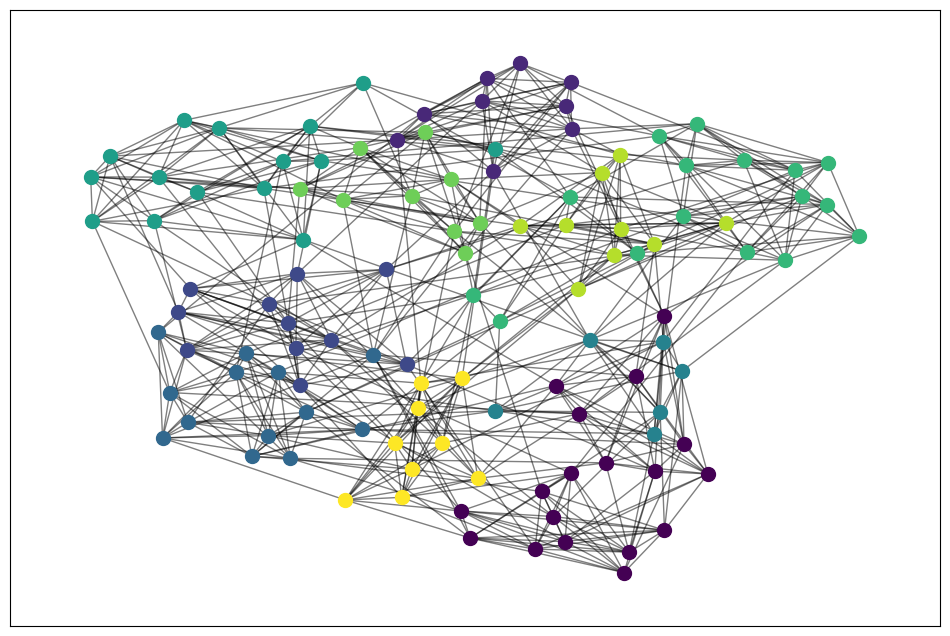

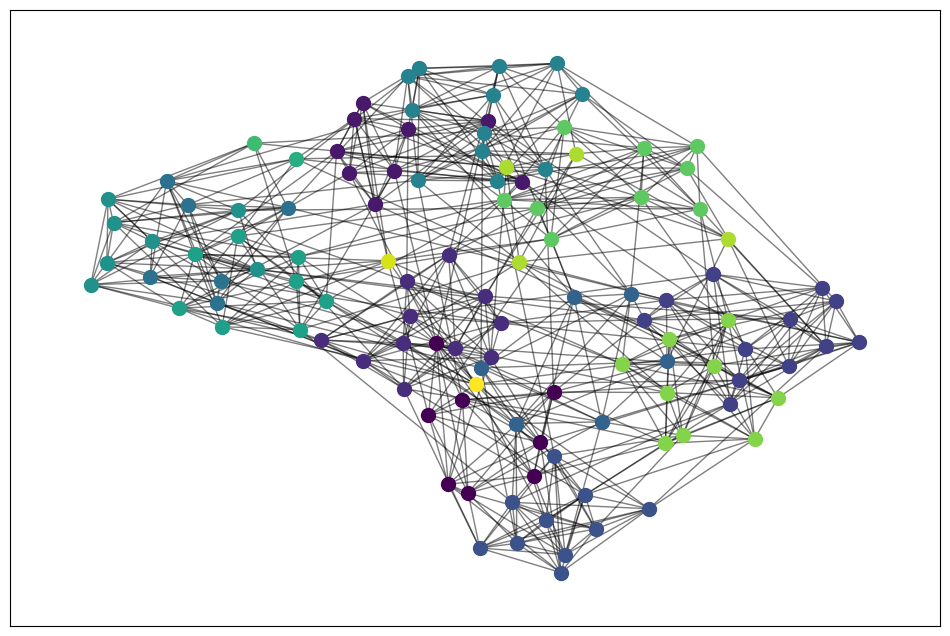

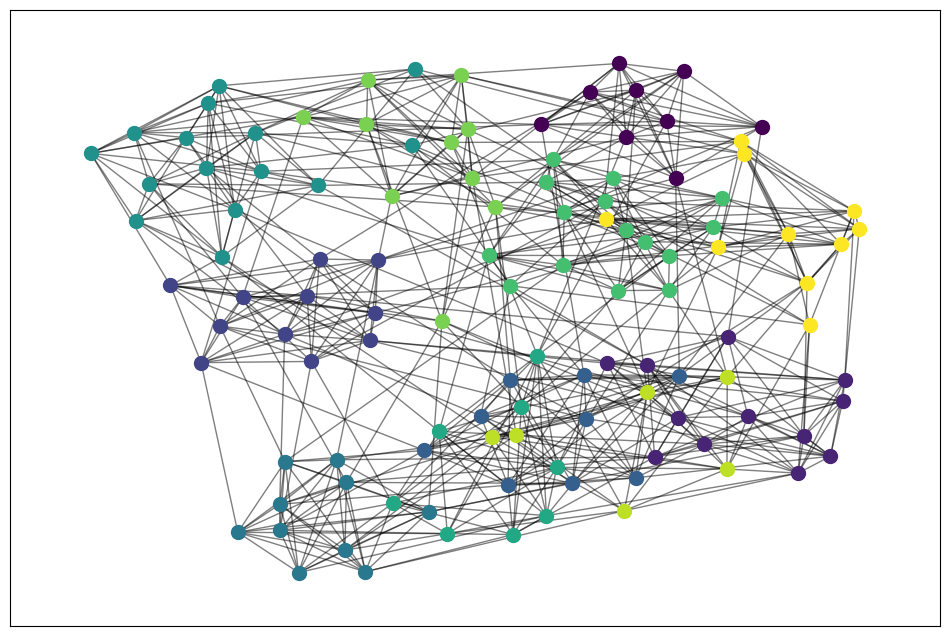

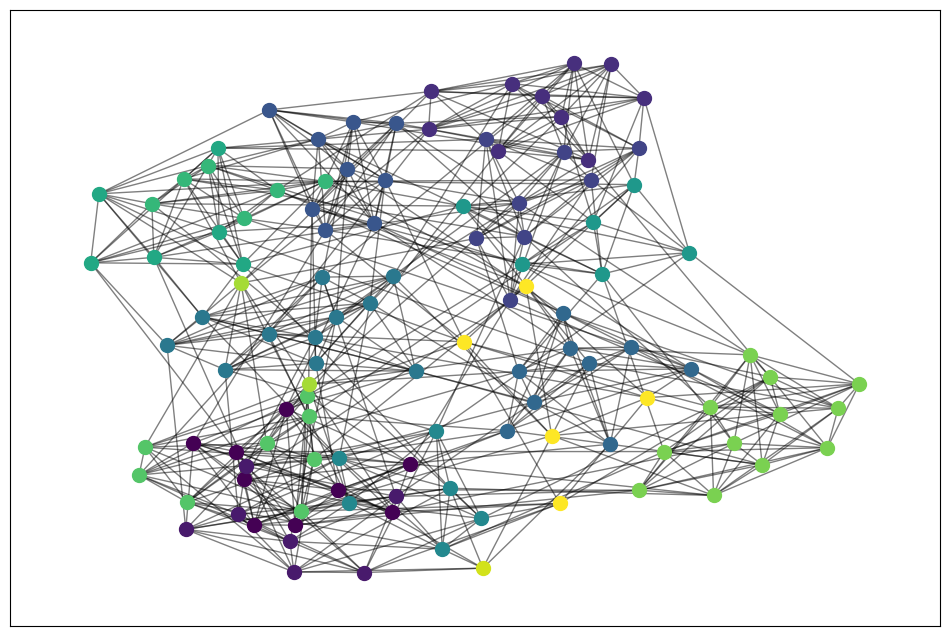

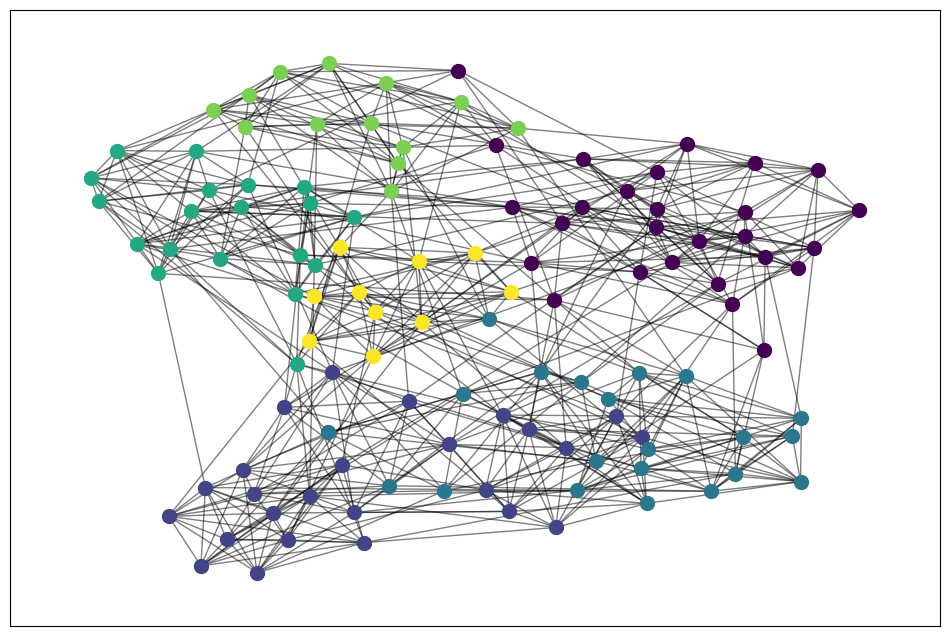

In [54]:
import matplotlib.cm as cm
def football_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(football)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(football, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(football, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])



FOOTBALL=Girvan_Newman(football)
print("\n")
print(FOOTBALL[0])
print(FOOTBALL[1])
football_community(FOOTBALL[0])
football_community(FOOTBALL[1])
print("\n")


counter=0
afc=dict()
for lists in football:
    afc[counter]=lists
    counter+=1



f=conv2int(football,0)[0]

mod=[]
BALL_spectral_clustering=Spectral_Clustering(f)
for lists in BALL_spectral_clustering[0]:
  temp=set()
  for sets in lists:
    college=afc[sets]
    temp.add(college)
  mod.append(temp)

print("Matching cities with nodes:")
print(afc)

print(f"\nModularity matching:")
print(BALL_spectral_clustering[0])
print(mod)

perf=[]
for lists in BALL_spectral_clustering[1]:
  temp=set()
  for sets in lists:
    college=afc[sets]
    temp.add(college)
  perf.append(temp)


print(f"\nPerformance matching:")
print(BALL_spectral_clustering[1])
print(perf)





football_community(mod)
football_community(perf)

print("\n")
football_MM=Modularity_Maximazation(football)
football_community(football_MM)



#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, εννοώ το τελευταίο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization.
#Με βάση τα παρακάτω διαγράμματα, θα ισχυριστώ ότι το δίκτυο football, έχει τη μορφή του συνθετικού δικτύου SW, διότι:
#Οπώς είναι γνωστό από τη θεωρία σε δίκτυα με τοπολογία SW, δεν απαιτούνται πολύ κόμβοι για να πραγματοποιηθεί η επικοινωνία,
#αλλά στη πραγματικότητα λίγοι και συγκεκριμένοι.

#### Οπτικοποίηση κοινοτήτων Game of Thrones

100%|██████████| 1/1 [00:05<00:00,  5.86s/it]
<ipython-input-16-8f0c1a32af56>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-16-8f0c1a32af56>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({'MADAME', 'MOUNTAIN', 'MERYN_TRANT', 'WALDER', 'THIN_MAN', 'ARYA', 'MACE', 'TYCHO', 'JAQEN', 'WAIF'}, {'SHAE', 'OWNER', 'GREY_WORM', 'STRONG', 'TYRION', 'MISSANDEI', 'DAARIO', 'BLACK_HAIRED_PROSTITUTE', 'AERYS', 'QUICK', 'BARRISTAN', 'HIZDAHR', 'MOSSADOR', 'DAENERYS', 'JORAH', 'RHAEGAR', 'MALKO'}, {'NYMERIA', 'OBERYN', 'DORAN', 'FALYSE', 'ELLARIA', 'TYENE', 'DORNISH_RIDER', 'BRONN', 'JAIME', 'LOLLYS', 'OBARA', 'TRYSTANE', 'AREO', 'MYRCELLA', 'TANDA'}, {'JOFFREY', 'QYBURN', 'HIGH_SEPTON', 'TYWIN', 'MARGAERY', 'TOMMEN', 'CERSEI', 'MELARA', 'ROBERT', 'PYCELLE', 'MAGGY', 'OLENNA', 'LORAS', 'KEVAN', 'VARYS', 'LANCEL', 'SEPTA_UNELLA', 'HIGH_SPARROW', 'OLYVAR'}, {'WALDA', 'LITTLEFINGER', 'LYANNA', 'CATELYN', 'MYRANDA', 'RENLY', 'BRAN', 'ROYCE', 'YOHN_ROYCE', 'BRIENNE', 'ROBB', 'CERWYN', 'THEON', 'PODRICK', 'MAESTER_WOLKAN', 'SELWYN', 'ROOSE_BOLTON', 'RICKON', 'LYSA', 'NED', 'ROBIN', 'RAMSA

100%|██████████| 49/49 [00:01<00:00, 35.18it/s]
<ipython-input-16-8f0c1a32af56>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-16-8f0c1a32af56>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{64, 35, 4, 5, 36, 37, 67, 74, 109, 47, 48, 81, 113, 25, 62}, {12, 13, 16, 17, 23, 24, 28, 31, 33, 38, 39, 46, 51, 52, 60, 70, 71, 72, 73, 78, 87, 96, 97, 101, 104, 107, 111, 112, 114, 116, 117, 118}, {8, 9, 19, 20, 32, 40, 41, 49, 50, 54, 55, 61, 63, 66, 68, 69, 77, 85, 95}, {89, 2, 3, 34, 90, 6, 7, 102, 42, 43, 45, 80, 18, 22, 57, 58, 93, 94}, {0, 1, 65, 105, 106, 44, 82, 53, 59, 30}, {56, 92, 103}, {10, 11, 14, 15, 21, 26, 27, 29, 75, 76, 79, 83, 84, 86, 88, 91, 98, 99, 100, 108, 110, 115}]
Modularity score: 0.6624228395061728
Communities in partition: 7
Performance statistics:
The partition with the maximum performance score is: [{57}, {28, 31, 52, 23}, {65, 1, 44, 53, 30}, {40, 9, 41, 19, 61}, {7, 18, 22, 89, 90}, {97, 71, 107, 12, 24}, {26, 115, 76, 29}, {83, 84, 21}, {60, 46, 87}, {104, 38, 39}, {8, 50, 68}, {113, 62}, {72, 73}, {88, 75, 15}, {2, 3, 42, 43, 45,

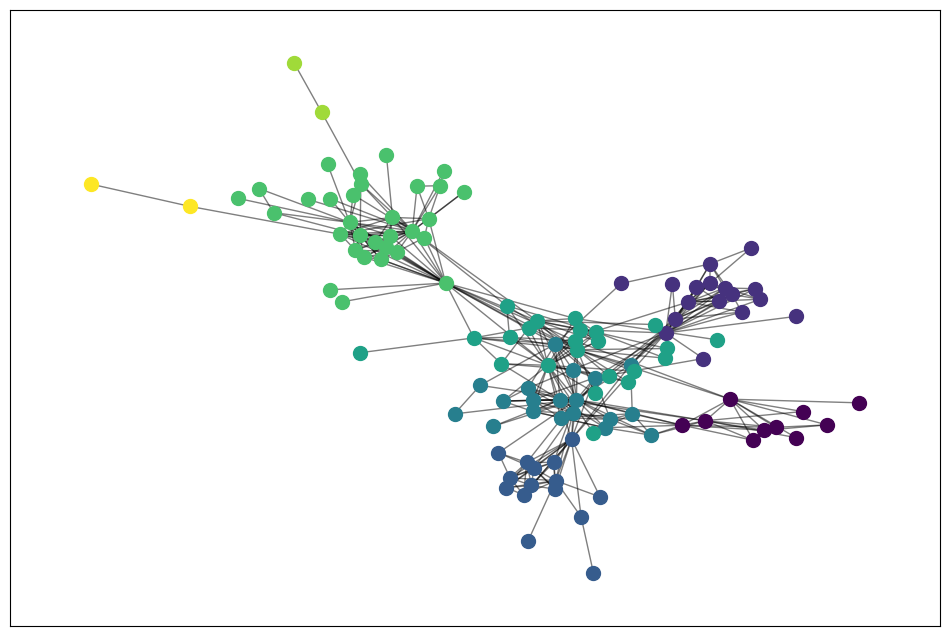

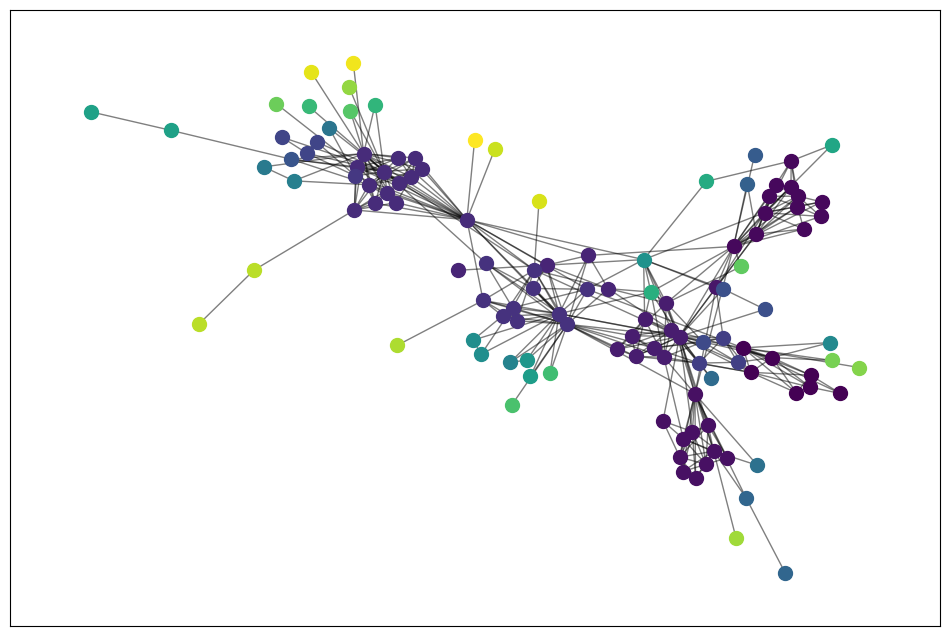

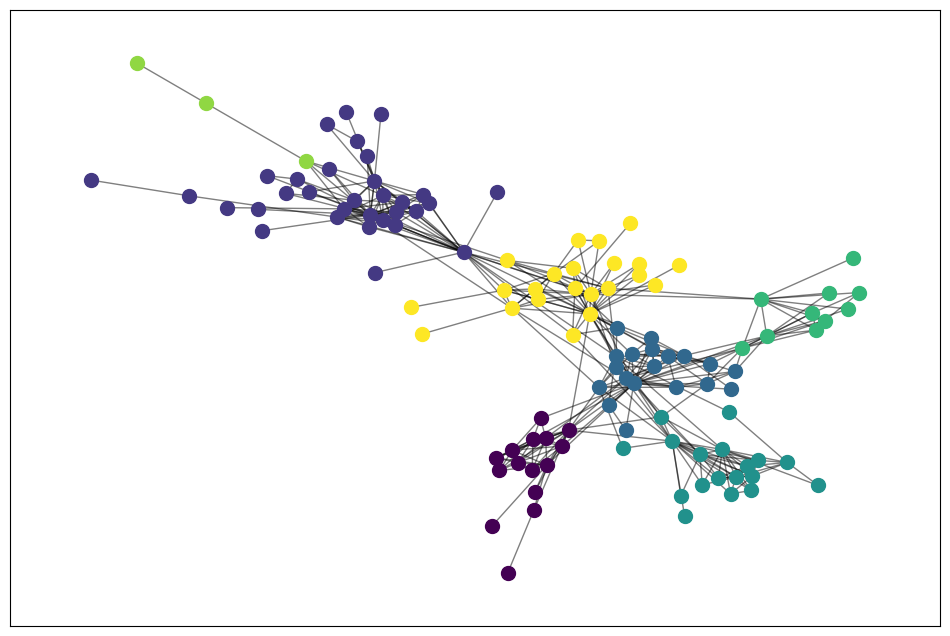

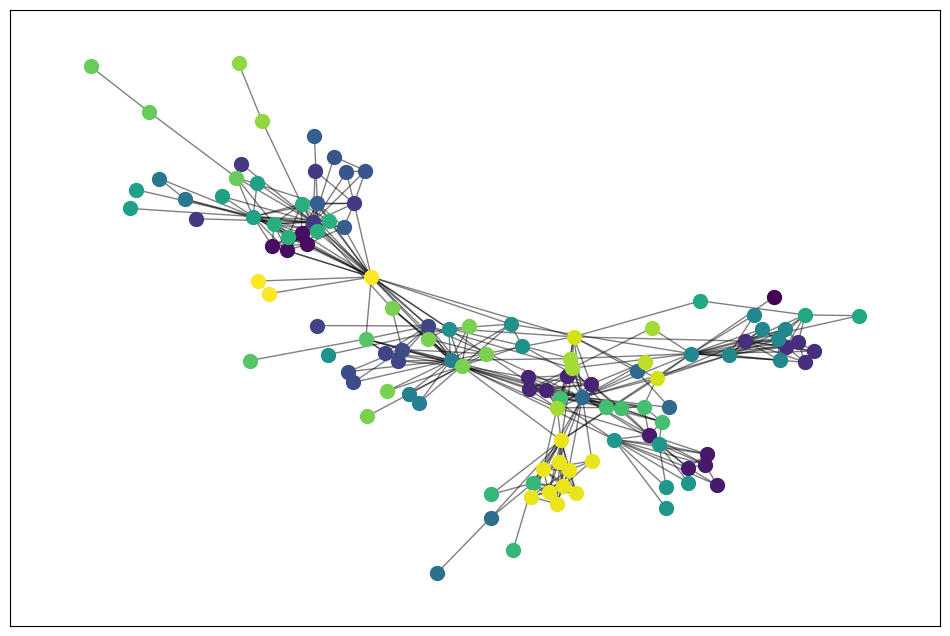

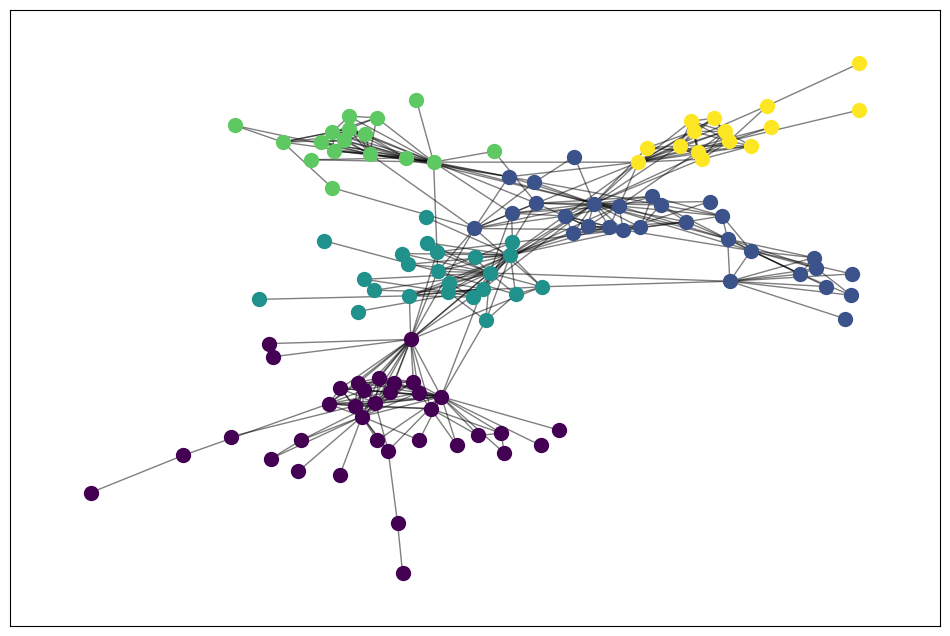

In [16]:
import matplotlib.cm as cm
def got_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(got)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(got, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(got, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])


GAME_OF_THRONES=Girvan_Newman(got)
print("\n")
got_community(GAME_OF_THRONES[0])
got_community(GAME_OF_THRONES[1])
print("\n")


counter=0
game_of_thrones=dict()
for lists in got:
    game_of_thrones[counter]=lists
    counter+=1


g=conv2int(got,0)

mod=[]
GAME_OF_THRONES_spectral_clustering=Spectral_Clustering(g[0])
for lists in GAME_OF_THRONES_spectral_clustering[0]:
  temp=set()
  for sets in lists:
    movie=game_of_thrones[sets]
    temp.add(movie)
  mod.append(temp)

print("Matching characters with nodes:")
print(game_of_thrones)

print(f"\nModularity matching:")
print(GAME_OF_THRONES_spectral_clustering[0])
print(mod)

perf=[]
for lists in GAME_OF_THRONES_spectral_clustering[1]:
  temp=set()
  for sets in lists:
    movie=game_of_thrones[sets]
    temp.add(movie)
  perf.append(temp)


print(f"\nPerformance matching:")
print(GAME_OF_THRONES_spectral_clustering[1])
print(perf)

got_community(mod)
got_community(perf)
print("\n")

got_MM=Modularity_Maximazation(got)
got_community(got_MM)


#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, εννοώ το τελευταίο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization.
#Με βάση τα παρακάτω διαγράμματα θα ισχυριστώ ότι το δίκτυο got έχει τη μορφή του συνθετικού δικτύου RGG.
#Αυτή η άποψη τεκμηριώνεται από το γεγονός ότι:
#Μέσα από τα διαγράμματα παρατηρούμε ότι η κάθε κοινότητα έχει την δική της ξεχωριστή  τοποθεσία στον γράφο. Αυτό συμβαίνει ΄
#ιδιαίτερα στις κοινότητες που περιέχουν πολλούς κόμβους. Εξαίρεση , μπορεί να αποτελέσουν οι κοινότητες με λίγους κόμβους.
#Τότε μπορεί να συμβεί ένας κόμβος να βρίσκεται σε μια περιοχή που είναι μαζεμένοι όλοι οι κόμβοι της κοινότητας.
#Συνεπώς, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που ορίζεται από την απόσταση του τελευταίου από τους υπόλοιπους
#κόμβους του δικτύου.

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

EU network and Ground Truth graphs:
({'522', '320', '620', '475', '2', '773', '116', '218', '485', '416', '234', '354', '804', '924', '378', '129', '523', '970', '249', '793', '43', '902', '259', '874', '863', '867', '671', '283', '376', '123', '826', '927', '398', '268', '662', '708', '335', '756', '60', '681', '447', '192', '980', '389', '987', '464', '958', '763', '487', '1002', '456', '250', '783', '383', '717', '52', '362', '357', '438', '828', '427', '979', '611', '269', '137', '108', '896', '602', '613', '77', '738', '967', '509', '71', '428', '308', '419', '262', '933', '845', '803', '956', '796', '920', '167', '23', '408', '572', '458', '213', '88', '364', '629', '243', '345', '394', '492', '109', '615', '38', '495', '991', '634', '50', '379', '339', '858', '106', '174', '207', '472', '254', '235', '735', '114', '786', '300', '348', '0', '550', '995', '403', '334', '7', '443', '800', '448', '315', '224', '134', '816', '626', '425', '46', '565', '642', '431', '951', '230', '203

<ipython-input-30-f25e6e9f3fd5>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-30-f25e6e9f3fd5>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
100%|██████████| 1/1 [00:03<00:00,  3.27s/it]

[frozenset({'885', '475', '2', '773', '582', '859', '234', '242', '924', '87', '281', '474', '249', '963', '902', '863', '259', '115', '22', '952', '748', '422', '826', '671', '927', '990', '774', '145', '886', '5', '540', '508', '662', '517', '641', '373', '147', '192', '958', '369', '16', '287', '763', '627', '783', '357', '536', '899', '591', '828', '941', '427', '895', '269', '108', '896', '932', '877', '607', '613', '862', '738', '77', '946', '509', '71', '72', '845', '864', '549', '803', '796', '849', '408', '489', '138', '88', '233', '364', '243', '532', '639', '962', '109', '634', '404', '492', '615', '991', '50', '755', '858', '174', '690', '106', '855', '472', '235', '254', '518', '114', '300', '20', '875', '815', '550', '679', '693', '800', '126', '733', '811', '256', '626', '285', '59', '46', '642', '431', '56', '230', '571', '49', '306', '635', '812', '516', '718', '239', '238', '704', '173', '69', '1004', '806', '898', '643', '57', '118', '631', '881', '911', '807', '121'


100%|██████████| 49/49 [00:11<00:00,  4.43it/s]
<ipython-input-30-f25e6e9f3fd5>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
Modularity statistics:
The partition with the maximum modularity score is: [{779, 782, 656, 404, 916, 918, 678, 819, 697, 185, 698, 323, 97, 98, 99, 100, 101, 102, 353, 354, 617, 752, 754, 371, 124, 125, 638}, {0, 1, 512, 513, 518, 519, 524, 16, 17, 18, 531, 20, 21, 22, 533, 536, 537, 539, 540, 546, 548, 549, 550, 42, 559, 560, 49, 50, 561, 564, 62, 64, 577, 578, 67, 68, 69, 70, 71, 72, 73, 74, 581, 588, 77, 78, 590, 80, 81, 82, 83, 84, 85, 86, 87, 593, 595, 596, 600, 730, 605, 606, 731, 611, 612, 613, 614, 615, 105, 106, 107, 625, 626, 117, 118, 120, 121, 636, 127, 639, 640, 641, 645, 647, 650, 142, 144, 145, 146, 147, 657, 661, 152, 153, 154, 155, 664, 666, 670, 671, 160, 162, 163, 166, 681, 683, 173, 685, 686, 177, 691, 692, 693, 183, 184, 186, 187, 188, 189, 190, 699, 703, 705, 714, 718, 722, 212, 215, 728, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 732, 230, 736, 740, 742, 743, 748, 753, 755, 756, 758, 248, 249, 761, 762

<ipython-input-30-f25e6e9f3fd5>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


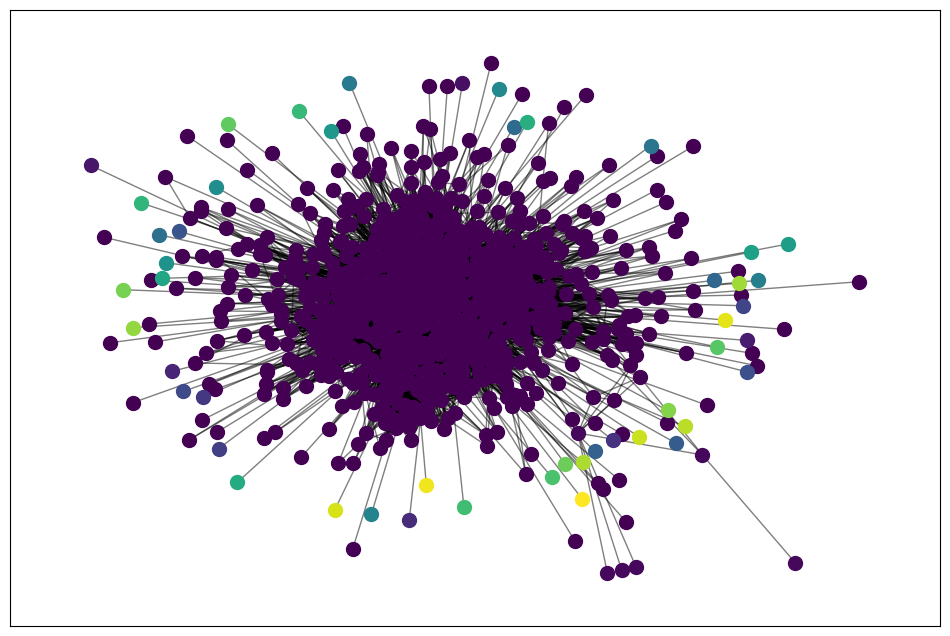

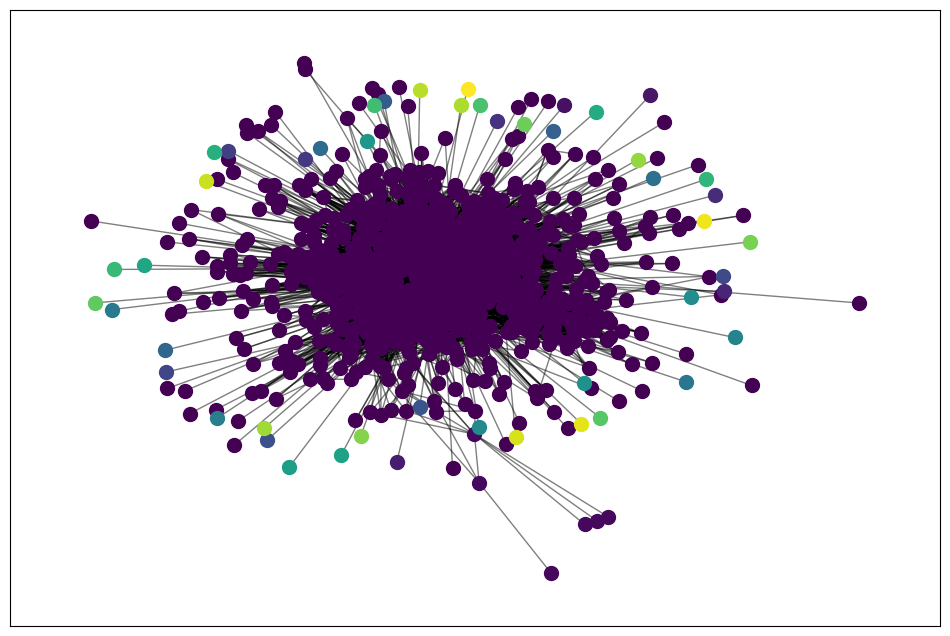

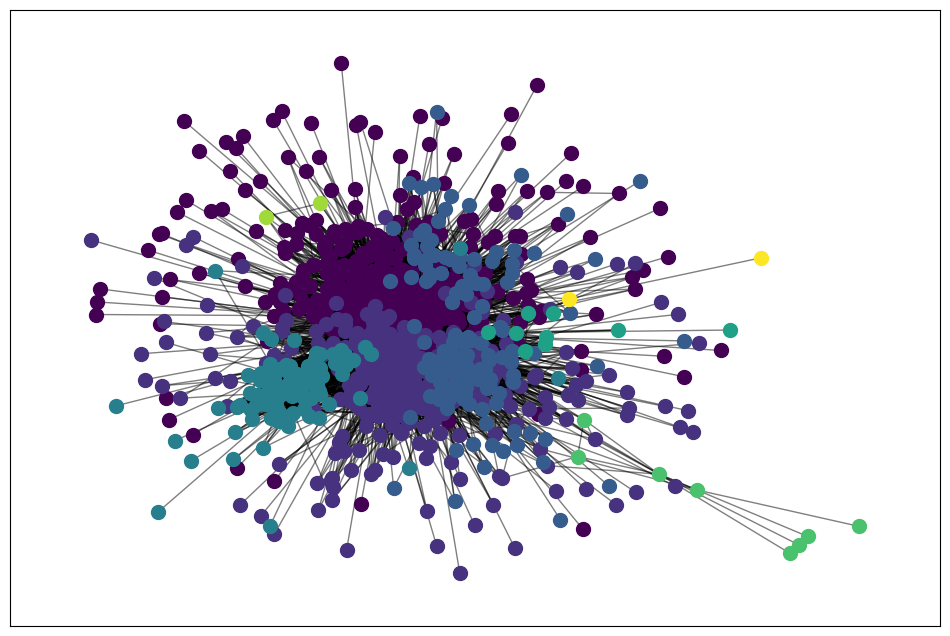

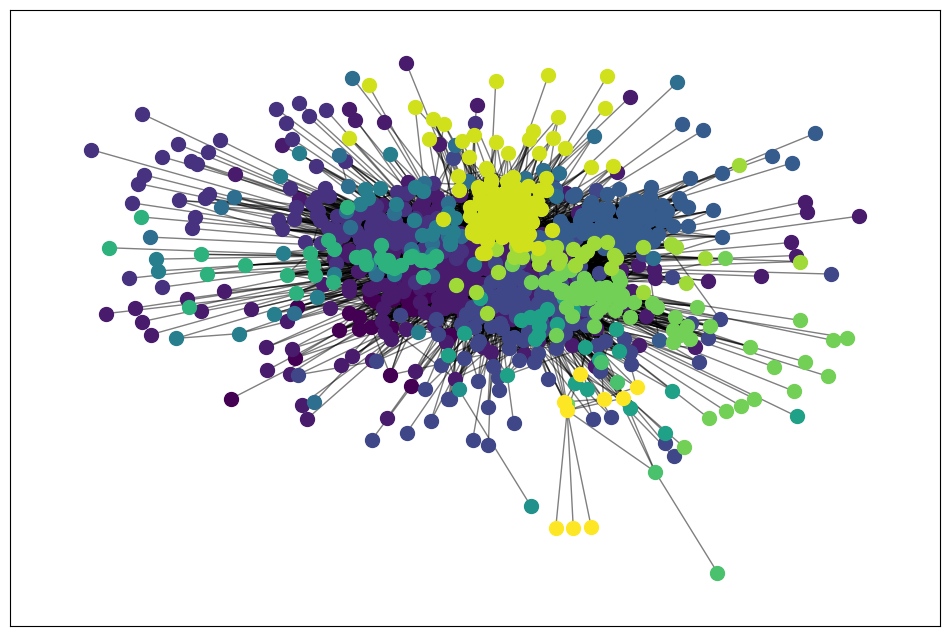

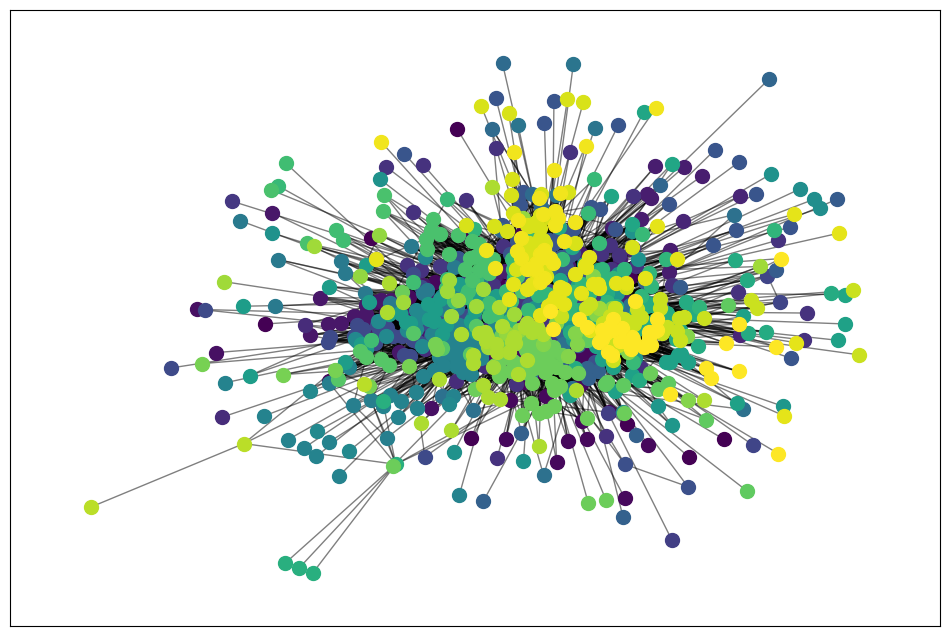

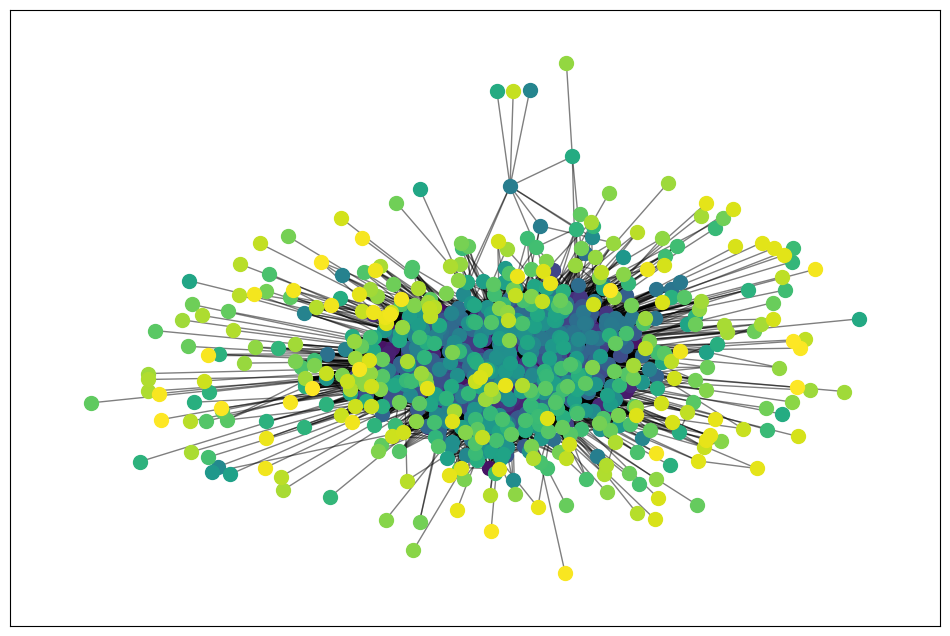

In [30]:
import matplotlib.cm as cm
def eu_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(eu)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(subgraph, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(subgraph, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])






print("EU network and Ground Truth graphs:")
print(eu_partition_modularity)
counter=0
network=dict()
for lists in subgraph:
  counter=int(lists)
  network[counter]=lists
print(f"counter:{counter}--------length:{len(subgraph)}\nnetwork:{network}")

mod=[]
for lists in eu_partition_modularity:
  temp=set()
  for sets in lists:
    n=int(sets)
    node=network[n]
    temp.add(node)
  mod.append(temp)

print("Matching nodes:")
print(network)

print(f"\nModularity matching:")
print(mod)

perf=[]
for lists in eu_partition_performance:
  temp=set()
  for sets in lists:
    n=int(sets)
    node=network[n]
    temp.add(node)
  perf.append(temp)


print(f"\nPerformance matching:")
print(perf)
print("\n")
eu_community(mod)
eu_community(perf)



eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
self_loops = list(nx.selfloop_edges(eu))
eu.remove_edges_from(self_loops)
connected_components = list(nx.connected_components(eu))
# Βρείτε τη μεγαλύτερη συνδεδεμένη συνιστώσα
largest_component = max(connected_components, key=len)
# Δημιουργία ενός subgraph από τη μεγαλύτερη συνδεδεμένη συνιστώσα
subgraph = eu.subgraph(largest_component)
EU_MM=Modularity_Maximazation(subgraph)

print("\n")
eu_community(EU_MM)



counter=0
network=dict()
for lists in subgraph:
    network[counter]=lists
    counter+=1


E=conv2int(subgraph,0)
EU=Spectral_Clustering(E[0])

mod=[]
for lists in EU[0]:
  temp=set()
  for sets in lists:
    node=network[sets]
    temp.add(node)
  mod.append(temp)

print("Matching nodes:")
print(network)

print(f"\nModularity matching:")
print(EU[0])
print(mod)

perf=[]
for lists in EU[1]:
  temp=set()
  for sets in lists:
    node=network[sets]
    temp.add(node)
  perf.append(temp)


print(f"\nPerformance matching:")
print(EU[1])
print(perf)
print("\n")
eu_community(mod)
eu_community(perf)


eu_label=nx.read_edgelist("email-Eu-core-department-labels.txt",create_using=nx.Graph())
to_remove=[]
for label in eu_label:
  if (label not in subgraph):
    to_remove.append(label)
for node in to_remove:
  eu_label.remove_node(node)
partitions = [{x} for x in eu_label]
eu_community(partitions)


#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, το επόμενο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization, ενώ το τελευταίο
#είναι η ground truth διαμέριση.
#Το συγκεκριμένο δίκτυο είναι πολύ μεγάλο, με πολλούς κόμβους και πολλές ακμές. Συνεπώς, προκείπται ένας μεγάλος συνωστισμός στην απεικόνιση
#των κοινοτήτων.


#### Οπτικοποίηση κοινοτήτων REG

Girvan Newman's statistics:
The partition with the maximum modularity score is: ({0, 1, 2, 3, 74, 75, 76, 77, 78, 79}, {4, 5, 6, 7, 8, 9, 10, 11, 12, 13}, {14, 15, 16, 17, 18, 19, 20, 21, 22, 23}, {32, 33, 24, 25, 26, 27, 28, 29, 30, 31}, {34, 35, 36, 37, 38, 39, 40, 41, 42, 43}, {44, 45, 46, 47, 48, 49, 50, 51, 52, 53}, {54, 55, 56, 57, 58, 59, 60, 61, 62, 63}, {64, 65, 66, 67, 68, 69, 70, 71, 72, 73})
Modularity score: 0.7249999999999999
The partition with the maximum performance score is: ({0, 1, 2, 3, 79}, {4, 5, 6, 7, 8}, {9, 10, 11, 12, 13}, {14, 15, 16, 17, 18}, {19, 20, 21, 22, 23}, {24, 25, 26, 27, 28}, {32, 33, 29, 30, 31}, {34, 35, 36, 37, 38}, {39, 40, 41, 42, 43}, {44, 45, 46, 47, 48}, {49, 50, 51, 52, 53}, {54, 55, 56, 57, 58}, {59, 60, 61, 62, 63}, {64, 65, 66, 67, 68}, {69, 70, 71, 72, 73}, {74, 75, 76, 77, 78})
Performance score: 0.9696202531645569
There were 79 partitions




<ipython-input-13-53151b8e5b6b>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-13-53151b8e5b6b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


100%|██████████| 49/49 [00:00<00:00, 70.70it/s]
<ipython-input-13-53151b8e5b6b>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-13-53151b8e5b6b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
The partition with the maximum modularity score is: [{64, 65, 66, 67, 57, 58, 59, 60, 61, 62, 63}, {34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44}, {11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21}, {68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78}, {45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}, {32, 33, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31}, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 79}]
Modularity score: 0.725625
The partition with the maximum performance score is: [{60, 61, 62, 63}, {8, 5, 6, 7}, {56, 53, 54, 55}, {68, 69, 70}, {48, 49, 46, 47}, {75, 76, 77}, {16, 17, 18, 19}, {9, 10, 11}, {27, 28, 29, 30}, {2, 3, 4}, {20, 21, 22}, {72, 73, 74, 71}, {40, 41, 38, 39}, {0, 1, 78, 79}, {64, 65, 66, 67}, {34, 35, 36, 37}, {57, 58, 59}, {24, 25, 26, 23}, {12, 13, 14, 15}, {32, 33, 31}, {50, 51, 52}, {42, 43, 44, 45}]
Performance score: 0.9746835443037974


Modularity Maximazation statistic's:
Partition: [frozenset({0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13

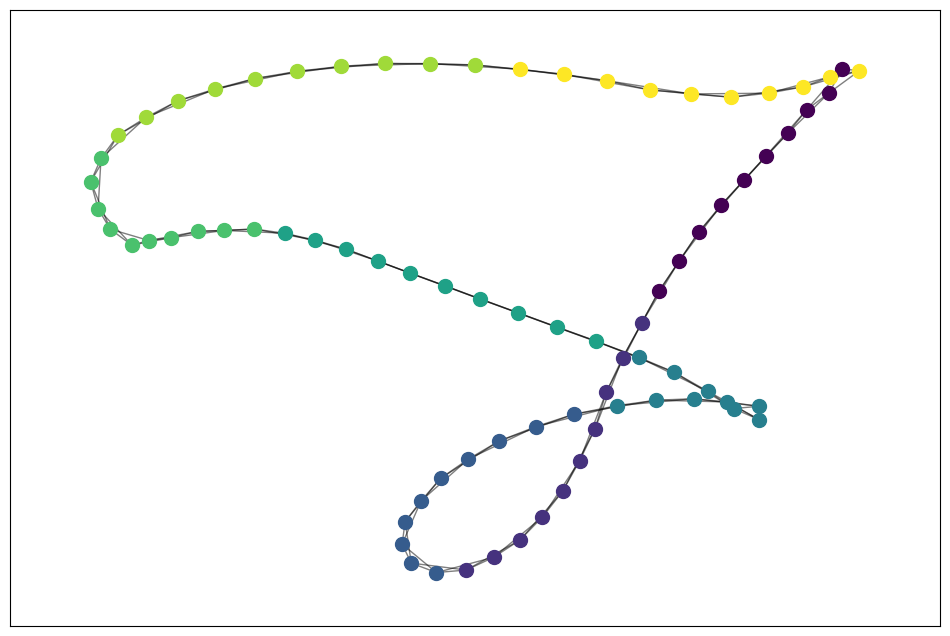

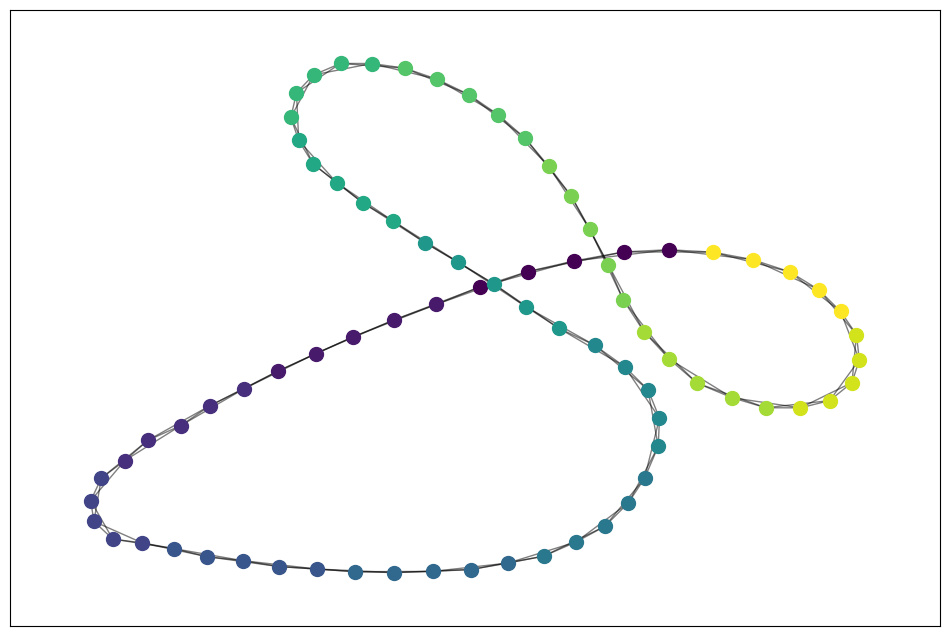

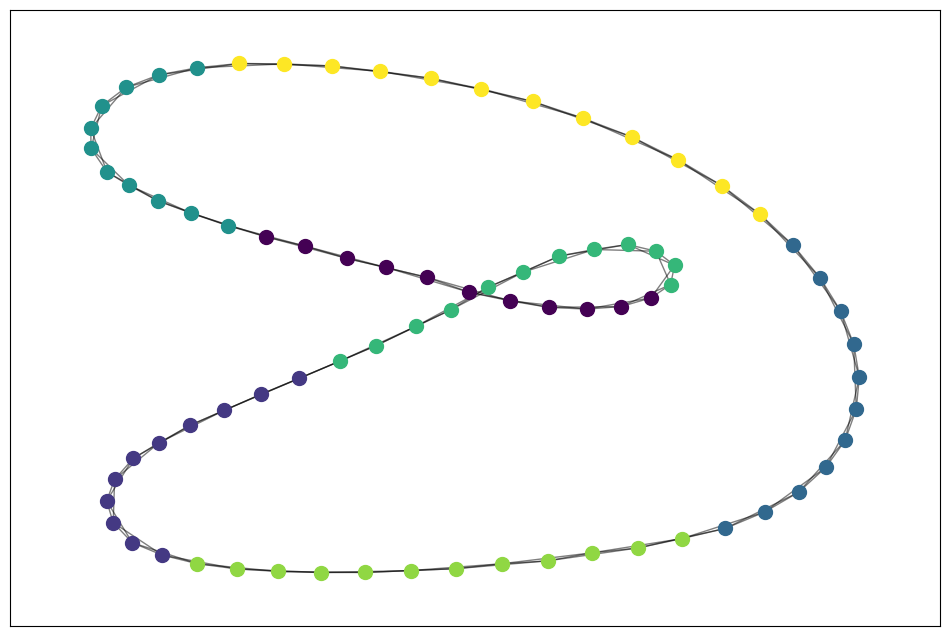

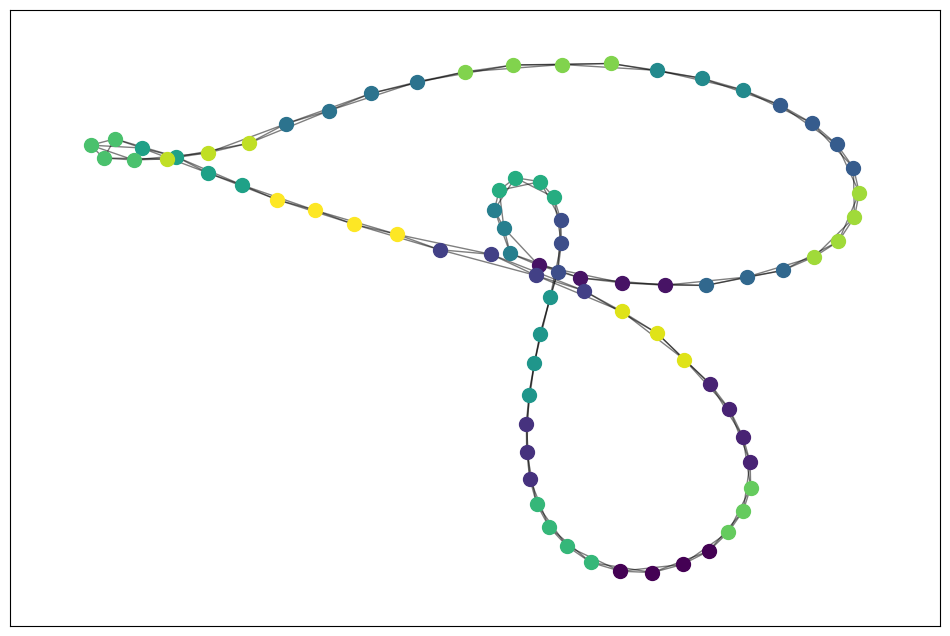

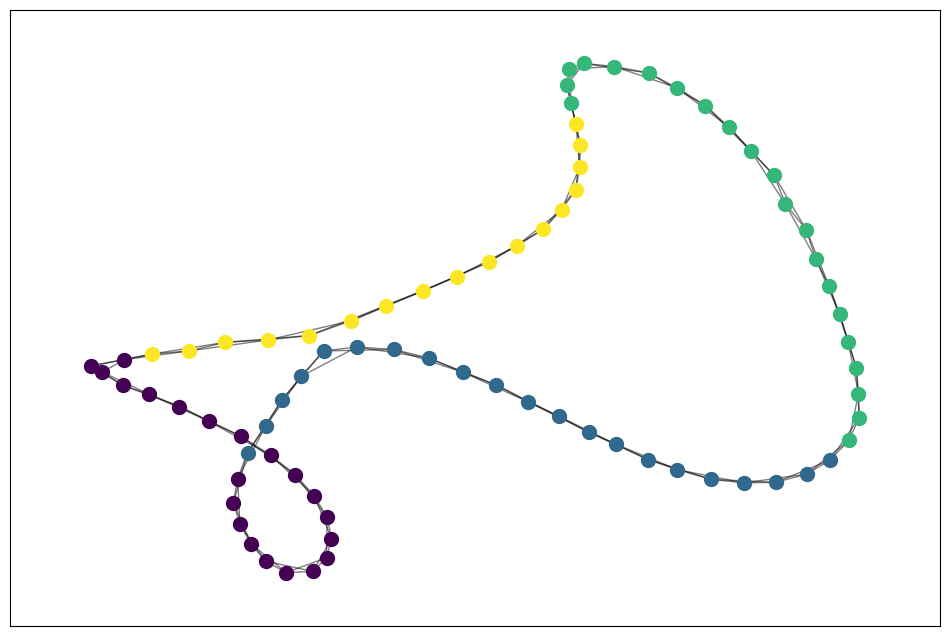

In [13]:
import matplotlib.cm as cm
def REG_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(REG)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(REG, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(REG, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])


reg=Girvan_Newman(REG)
print("\n")
REG_community(reg[0])
REG_community(reg[1])
print("\n")
reg_spectral_clustering=Spectral_Clustering(REG)
REG_community(reg_spectral_clustering[0])
REG_community(reg_spectral_clustering[1])
print("\n")
REG_MM=Modularity_Maximazation(REG)
REG_community(REG_MM)

#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, εννοώ το τελευταίο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization.
#Η τοπολογία REG προσφέρει μια ισορροπημένη συνδυαστική προσέγγιση μεταξύ της απλότητας της δομής και της ευελιξίας της επικοινωνίας.
#Οι περισσότερες κοινότητες είναι ανεξάρτητες και  δεν εφάπτονται η μία στην άλλη

#### Οπτικοποίηση κοινοτήτων RGER

Girvan Newman's statistics:
The partition with the maximum modularity score is: ({0, 33, 38, 76, 44, 52, 53}, {24, 1}, {32, 2, 4, 70, 7, 9, 75, 45, 14, 79, 16, 17, 47, 51, 58, 60, 30}, {34, 3}, {37, 5, 43, 23, 25, 26}, {35, 6, 8, 20, 59}, {10, 62}, {11, 77, 55}, {12}, {67, 13}, {56, 19, 31, 15}, {18, 66, 36, 21}, {39, 40, 49, 22, 61}, {73, 27}, {28, 63}, {29}, {41, 54}, {42, 46, 71}, {48, 72, 68}, {50}, {57}, {64}, {65, 78}, {74, 69})
Modularity score: 0.21109444444444445
The partition with the maximum performance score is: ({0, 76, 44}, {24, 1}, {2, 7}, {34, 3}, {9, 75, 4, 47}, {25, 37, 5}, {35, 6, 8, 20, 59}, {10, 62}, {11, 77, 55}, {12}, {67, 13}, {14}, {56, 19, 31, 15}, {16}, {17, 45, 30}, {18, 66, 36, 21}, {49, 22}, {26, 43, 23}, {73, 27}, {28, 63}, {29}, {32, 70, 79, 58, 60}, {33}, {52, 53, 38}, {40, 61, 39}, {41, 54}, {42, 46, 71}, {48, 72, 68}, {50}, {51}, {57}, {64}, {65, 78}, {74, 69})
Performance score: 0.9215189873417722
There were 79 partitions




<ipython-input-14-4fc0e80863dc>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-14-4fc0e80863dc>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


100%|██████████| 49/49 [00:00<00:00, 67.06it/s]
<ipython-input-14-4fc0e80863dc>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-14-4fc0e80863dc>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
The partition with the maximum modularity score is: [{6, 73, 11, 75, 77, 15, 79, 19, 54, 55, 56, 62, 31}, {0, 65, 34, 3, 35, 67, 44, 13, 59, 29}, {66, 68, 5, 37, 69, 71, 41, 72, 74, 46, 78, 48, 49, 18, 21, 23, 25, 61}, {1, 7, 17, 52, 22, 24, 57, 27}, {32, 33, 2, 64, 36, 38, 70, 8, 10, 42, 12, 76, 14, 53, 28, 63}, {4, 58, 39, 40, 9, 43, 45, 47, 16, 50, 51, 20, 26, 60, 30}]
Modularity score: 0.2695222222222222
The partition with the maximum performance score is: [{61, 62, 39}, {48, 66, 74, 69}, {24, 12}, {16, 26, 5, 23}, {65, 34, 29}, {59, 3, 20}, {49, 22}, {68, 71}, {11, 77, 55}, {57, 52, 13}, {32, 58}, {51, 44, 45}, {0, 64, 76}, {42, 36, 38, 63}, {67, 21}, {8, 41, 60, 54}, {50, 6, 15}, {56, 19, 79, 31}, {73, 4, 7}, {78, 70}, {9, 75, 30, 47}, {33, 28, 14}, {25, 18, 53, 46}, {72}, set(), {35, 37}, {1, 27, 17}, set(), {10, 43}, {40, 2}]
Performance score: 0.9164556962025316


Modularity Maximazation statistic's:
Partition: [frozenset({65, 6, 8, 

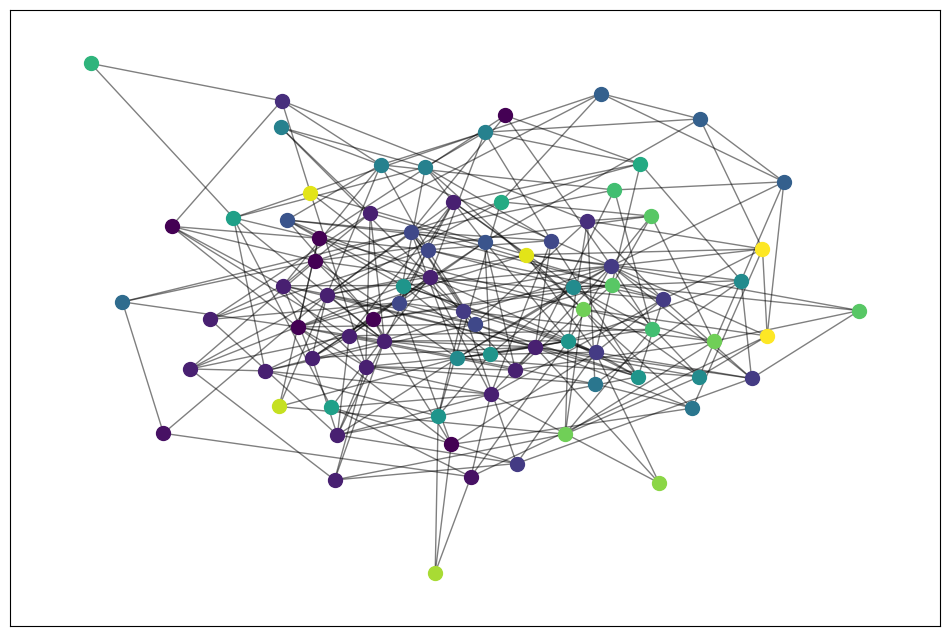

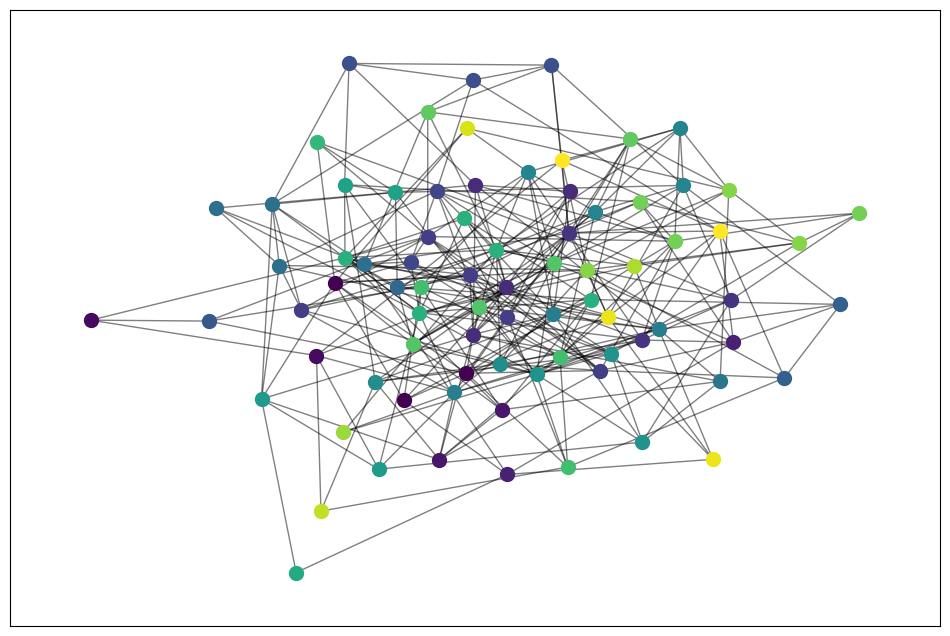

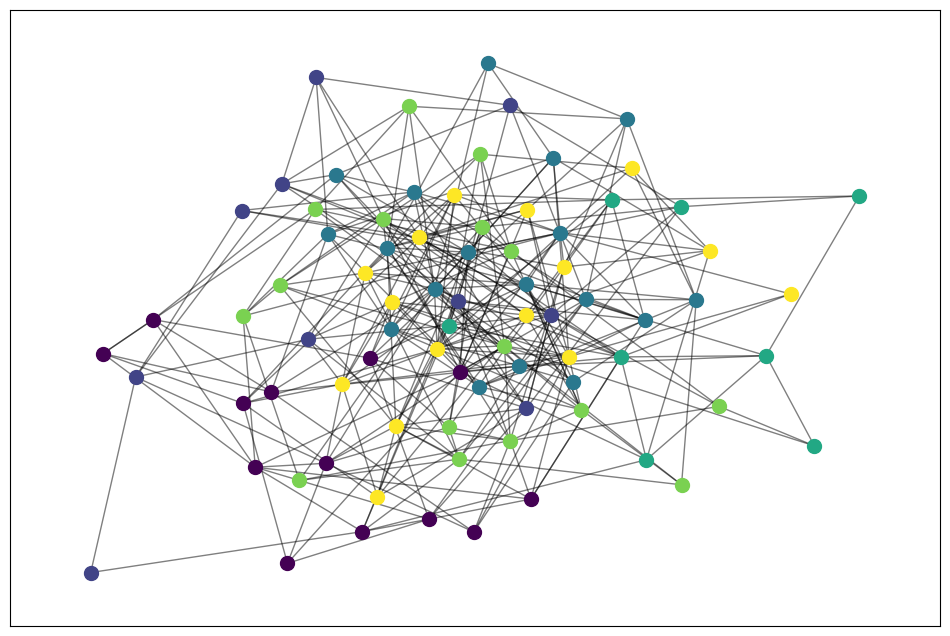

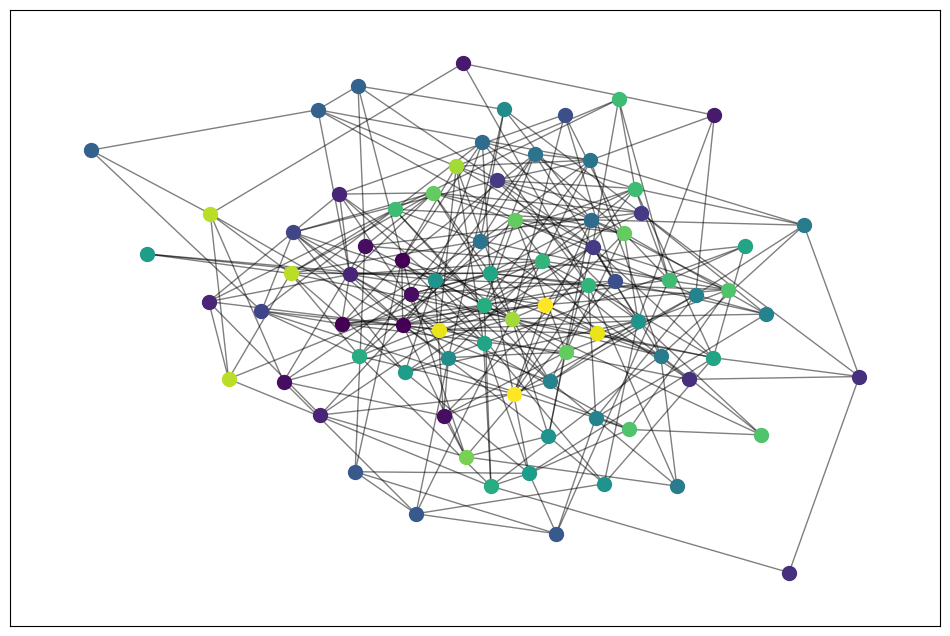

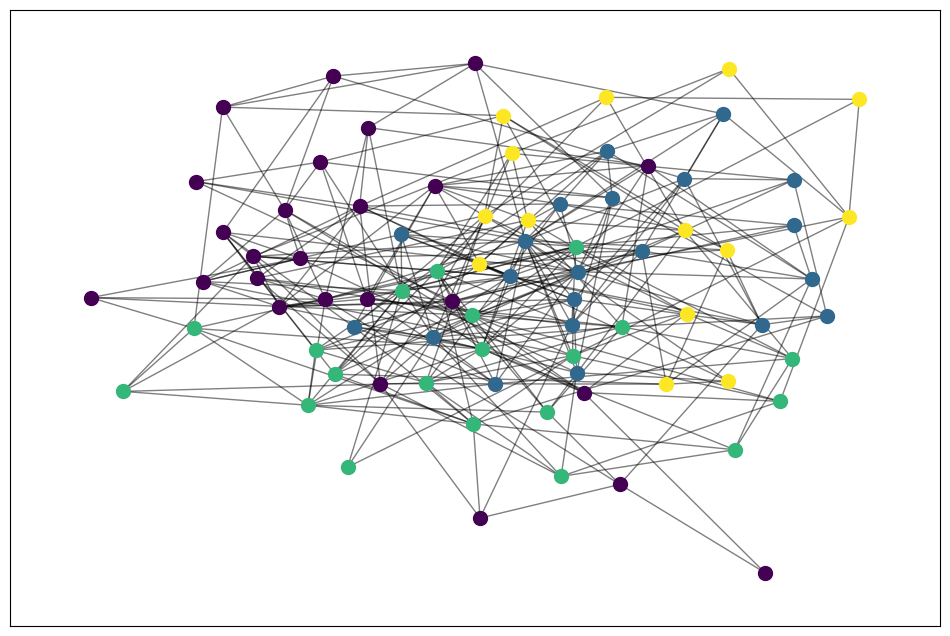

In [14]:
import matplotlib.cm as cm
def RGER_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(RGER)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(RGER, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(RGER, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])






rger=Girvan_Newman(RGER)
print("\n")
RGER_community(rger[0])
RGER_community(rger[1])
print("\n")
rger_spectral_clustering=Spectral_Clustering(RGER)
RGER_community(rger_spectral_clustering[0])
RGER_community(rger_spectral_clustering[1])
print("\n")
RGER_MM=Modularity_Maximazation(RGER)
RGER_community(RGER_MM)

#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, εννοώ το τελευταίο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization.
#Οι κόμβοι τοποθετούνται τυχαία στο χώρο, και οι συνδέσεις μεταξύ των κόμβων εξαρτώνται από την ευκλείδια απόσταση μεταξύ τους.
#Ουσιαστικά, κάθε κοινότητα δεν έχει δικό της χωρό και οπτικά, παρεμβαίνει η μία στην άλλη.

#### Οπτικοποίηση κοινοτήτων RGG

Girvan Newman's statistics:
The partition with the maximum modularity score is: ({0, 1, 2, 7, 15, 17, 19, 30, 36, 38, 40, 43, 48, 52, 57, 58, 62, 64, 71, 73, 74, 77, 79}, {3, 6, 8, 12, 14, 21, 22, 25, 27, 33, 37, 42, 45, 46, 47, 49, 51, 53, 55, 59, 61, 65, 66, 69, 70, 76}, {68, 4, 50, 26, 63}, {5, 10, 11, 20, 56, 28, 29}, {9, 13, 16, 18, 23, 24, 31, 32, 34, 35, 39, 41, 44, 54, 60, 67, 72, 75, 78})
Modularity score: 0.5970493827160495
The partition with the maximum performance score is: ({0, 1, 2, 36, 71, 40, 73, 74, 43, 77, 48, 19, 52, 57, 58, 30}, {3}, {68, 4, 50, 26, 63}, {5, 10, 11, 20, 56, 28, 29}, {65, 66, 37, 6, 69, 12, 45, 46, 51, 21, 53, 25, 61}, {7}, {33, 70, 8, 42, 14, 47, 49, 22, 59}, {34, 35, 39, 72, 9, 41, 44, 13, 78, 16, 18, 54, 60, 31}, {15}, {17}, {23}, {24}, {27}, {32}, {38}, {55}, {62}, {64}, {67}, {75}, {76}, {79})
Performance score: 0.9291139240506329
There were 79 partitions




<ipython-input-15-ded4fcd110ff>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-15-ded4fcd110ff>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


100%|██████████| 49/49 [00:01<00:00, 39.86it/s]
<ipython-input-15-ded4fcd110ff>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-15-ded4fcd110ff>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
The partition with the maximum modularity score is: [{68, 4, 50, 26, 63}, {34, 35, 67, 39, 72, 9, 41, 75, 44, 13, 78, 16, 18, 54, 24, 60, 31}, {33, 3, 70, 8, 42, 14, 47, 49, 22, 55, 59}, {5, 10, 11, 12, 20, 56, 28, 29}, {32, 65, 66, 37, 6, 7, 69, 76, 45, 46, 51, 21, 53, 23, 25, 27, 61}, {0, 1, 2, 15, 17, 19, 30, 36, 38, 40, 43, 48, 52, 57, 58, 62, 64, 71, 73, 74, 77, 79}]
Modularity score: 0.60099012345679
The partition with the maximum performance score is: [{36, 62, 15}, {65, 66, 37, 6, 69, 12, 45, 46, 51, 21, 25}, {59, 42, 3, 55}, {5, 10, 11, 20, 56, 28, 29}, {35, 39, 41, 13, 54, 24, 60, 31}, {0, 64, 38, 7, 73, 77, 79, 17}, {68, 4, 50, 26, 63}, {34, 67, 72, 9, 44, 78, 16, 18}, {33, 70, 8, 14, 47, 49, 22}, {1, 2, 71, 40, 74, 43, 48, 19, 52, 57, 58, 30}, {32, 75, 76, 53, 23, 27, 61}]
Performance score: 0.9363924050632911


Modularity Maximazation statistic's:
Partition: [frozenset({65, 66, 3, 69, 6, 70, 8, 76, 14, 21, 22, 23, 24, 25, 27, 32,

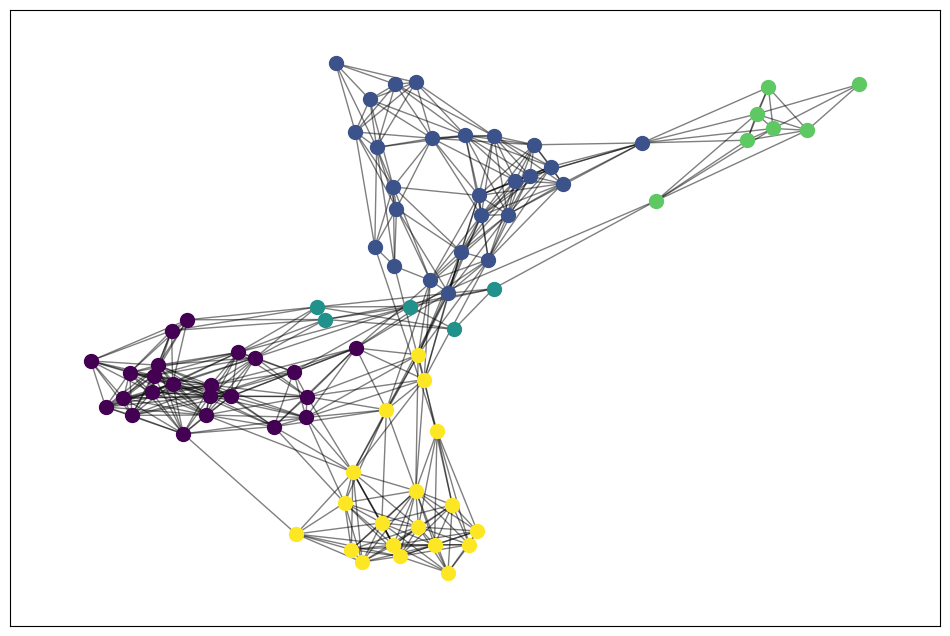

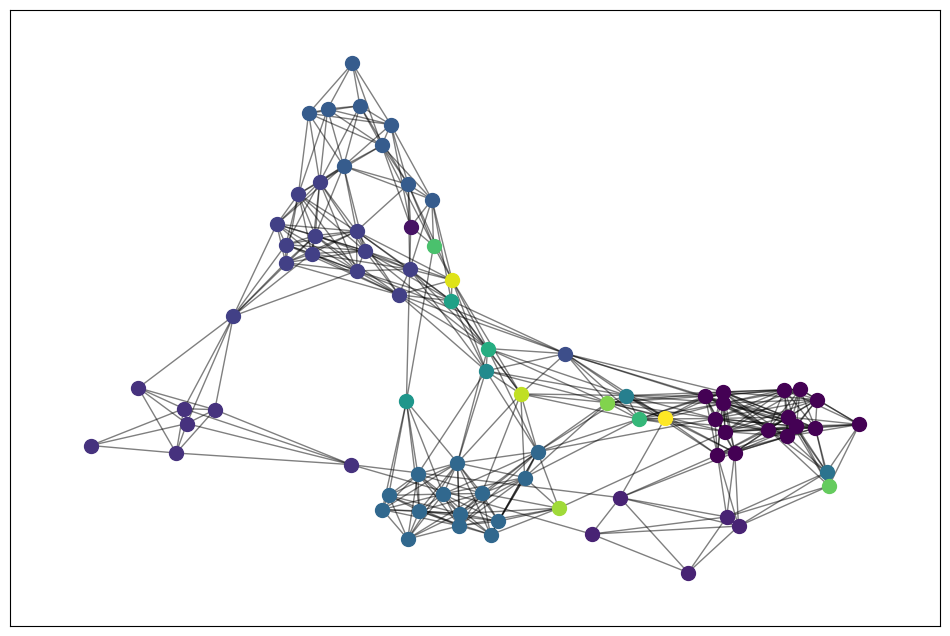

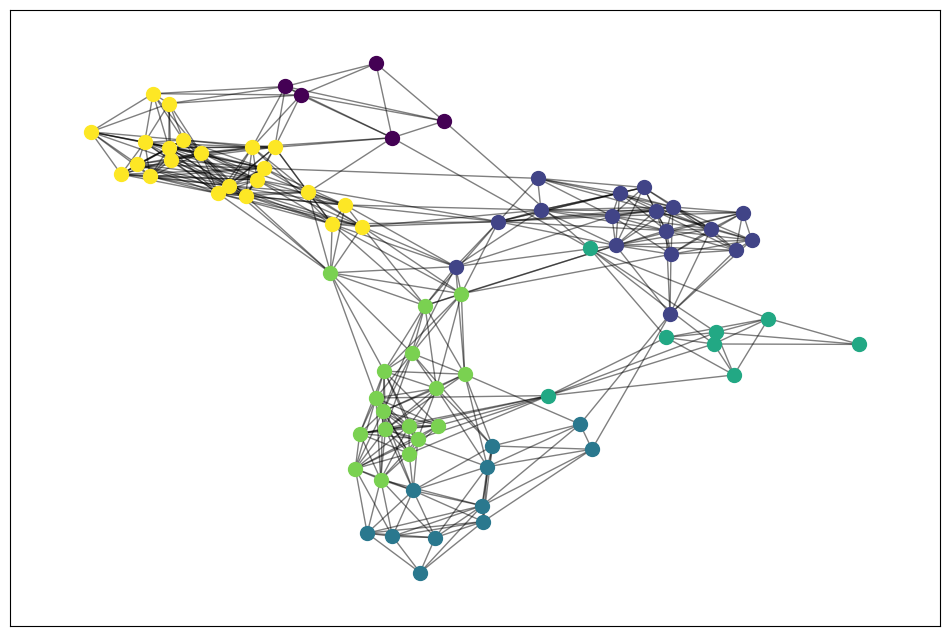

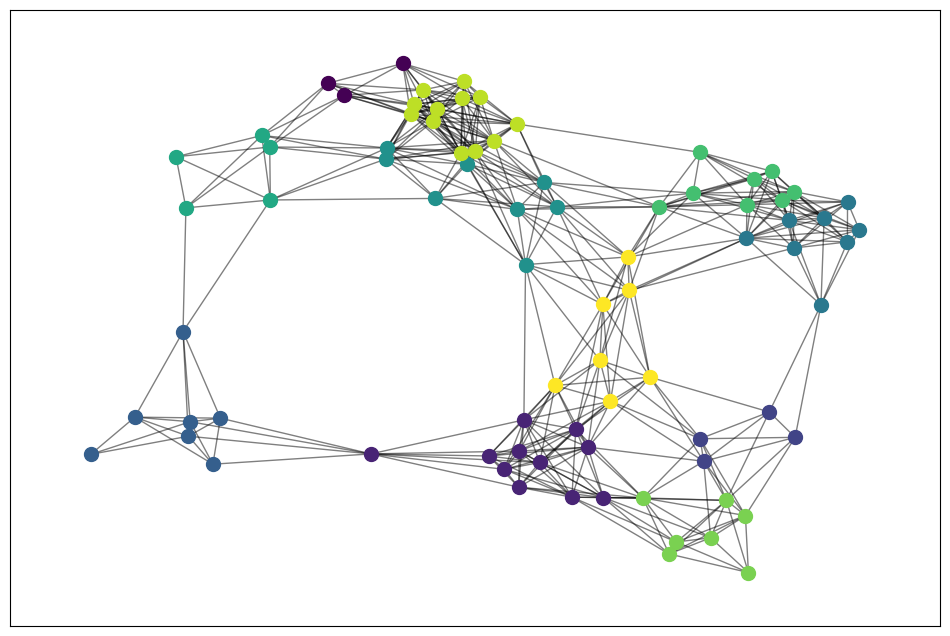

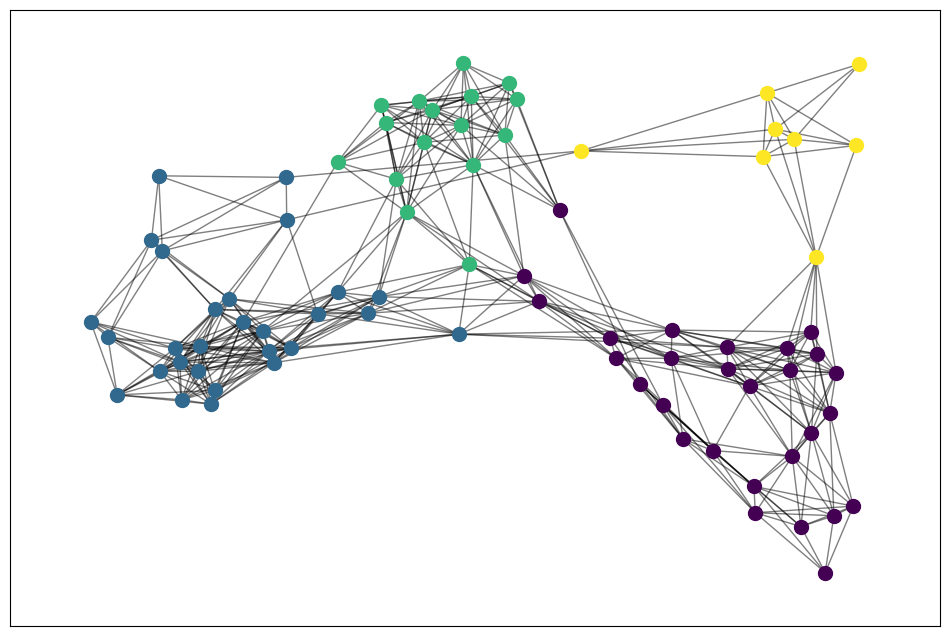

In [15]:
import matplotlib.cm as cm
def RGG_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(RGG)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(RGG, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(RGG, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])





rgg=Girvan_Newman(RGG)
print("\n")
RGG_community(rgg[0])
RGG_community(rgg[1])
print("\n\n")
rgg_spectral_clustering=Spectral_Clustering(RGG)
RGG_community(rgg_spectral_clustering[0])
RGG_community(rgg_spectral_clustering[1])
print("\n")
RGG_MM=Modularity_Maximazation(RGG)
RGG_community(RGG_MM)

#Τα πρώτα 2 διαγράμματα αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering, τα επόμενα 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan, εννοώ το τελευταίο προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization.
#Μέσα από τα διαγράμματα παρατηρούμε ότι η κάθε κοινότητα έχει την δική της ξεχωριστή  τοποθεσία στον γράφο. Αυτό συμβαίνει ΄
#ιδιαίτερα στις κοινότητες που περιέχουν πολλούς κόμβους. Εξαίρεση , μπορεί να αποτελέσουν οι κοινότητες με λίγους κόμβους.
#Τότε μπορεί να συμβεί ένας κόμβος να βρίσκεται σε μια περιοχή που είναι μαζεμένοι όλοι οι κόμβοι της κοινότητας.
#Συνεπώς, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που ορίζεται από την απόσταση του τελευταίου από τους υπόλοιπους
#κόμβους του δικτύου.

#### Οπτικοποίηση κοινοτήτων SW

Modularity Maximazation statistic's:
Partition: [frozenset({33, 2, 34, 35, 36, 38, 37, 39, 40, 41, 42, 43, 31}), frozenset({32, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30}), frozenset({9, 16, 18, 19, 51, 52, 53, 54, 55, 57, 56}), frozenset({4, 5, 6, 7, 8, 10, 11, 13, 20, 58, 59}), frozenset({66, 3, 67, 68, 69, 70, 71, 72, 73, 74, 75}), frozenset({0, 1, 12, 77, 14, 15, 78, 17, 79}), frozenset({48, 49, 50, 76, 44, 45, 46, 47}), frozenset({64, 65, 60, 61, 62, 63})]
Modularity score: 0.563203125
Performance score: 0.9003164556962026
There are 8 partitions


<ipython-input-37-f8f41f1cb50a>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-37-f8f41f1cb50a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


100%|██████████| 49/49 [00:00<00:00, 86.13it/s]
<ipython-input-37-f8f41f1cb50a>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-37-f8f41f1cb50a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
6---26
Modularity statistics:
The partition with the maximum modularity score is: [{64, 65, 66, 67, 69, 71, 72, 73, 74, 75, 76, 60, 61, 62, 63}, {68, 5, 6, 7, 8, 10, 11, 13, 20, 58, 59}, {0, 77, 78, 15, 79, 17, 19, 21, 22, 23, 24}, {9, 14, 47, 16, 48, 18, 49, 50, 51, 52, 53, 54, 55, 56, 57}, {1, 2, 3, 4, 36, 37, 38, 39, 40, 41, 42, 70}, {32, 33, 34, 35, 43, 12, 44, 45, 46, 25, 26, 27, 28, 29, 30, 31}]
Modularity score: 0.5591601562499999
Communities in partition: 6
Performance statistics:
The partition with the maximum performance score is: [{64, 61, 62, 63}, {77, 78, 79}, {51, 52, 53}, {69, 70, 71}, {41, 42, 43}, {4, 5, 6}, {17, 15}, {44, 45, 46}, {56, 57, 54, 55}, {33, 34, 35, 36}, {0, 19}, {48, 49, 50, 47}, {16, 18}, {72, 73, 74}, {10, 59, 58}, {25, 23}, {65, 66, 67}, {32, 29, 30}, {8, 20, 68, 7}, {24, 37, 21, 22}, {75, 76}, {40, 38, 39}, {11, 12, 14, 31}, {26, 27, 28, 13}, {1, 2, 3}, {9, 60}]
Performance score: 0.9664556962025317
Communit

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Girvan Newman's statistics:
Modularity statistics:
The partition with the maximum modularity score is: ({0, 77, 78, 79, 17, 19, 21, 22, 23, 24}, {1, 2, 37, 38, 39}, {66, 3, 68, 69, 70, 71, 72, 73, 74, 75, 67}, {4, 5, 6, 7, 8, 10, 11, 12, 58, 59}, {9, 47, 14, 15, 16, 49, 18, 51, 52, 53, 54, 55, 50, 57, 56, 48}, {13, 20, 26, 27, 28, 29, 30}, {32, 33, 34, 35, 36, 40, 41, 42, 43, 44, 45, 46, 25, 31}, {64, 65, 76, 60, 61, 62, 63})
Modularity score: 0.5741015625
Communities in partition: 8
Performance statistics:
The partition with the maximum performance score is: ({0, 19}, {1, 2}, {3}, {4, 5, 6}, {8, 7}, {16, 9, 18}, {59, 10, 11, 58}, {12}, {13}, {14, 15}, {17, 77, 78, 79}, {20}, {24, 21, 22, 23}, {25}, {26, 27, 28}, {29, 30}, {31}, {32}, {33, 34, 35}, {36, 40, 41, 42, 43}, {37, 38, 39}, {44, 45, 46}, {48, 49, 50, 47}, {51, 52, 53}, {56, 57, 54, 55}, {60, 76}, {64, 65, 61, 62, 63}, {66, 67, 68}, {69, 70, 71}, {72, 73, 74}, {75})
Performance score: 0.9670886075949368
Communities in partitio

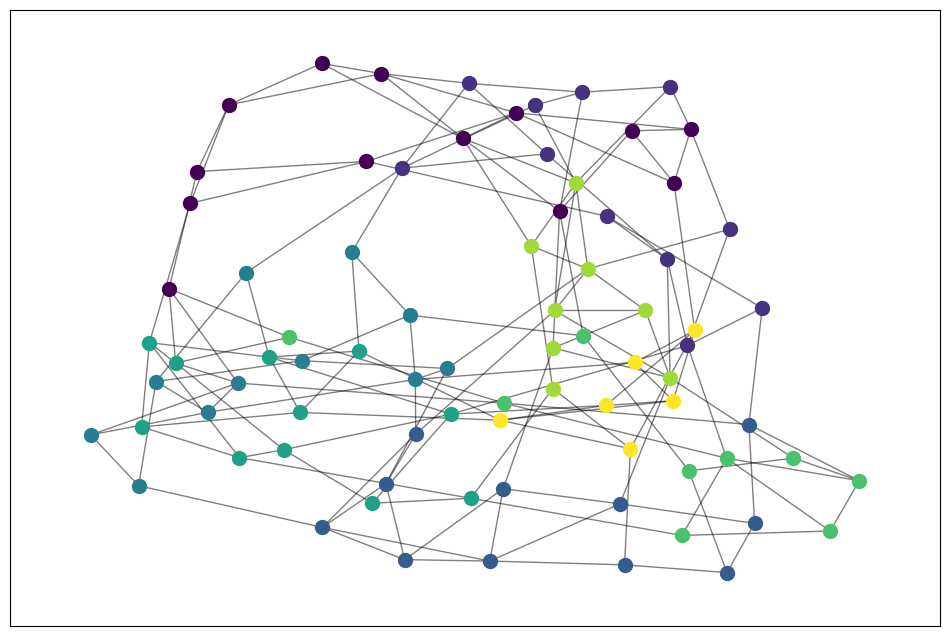

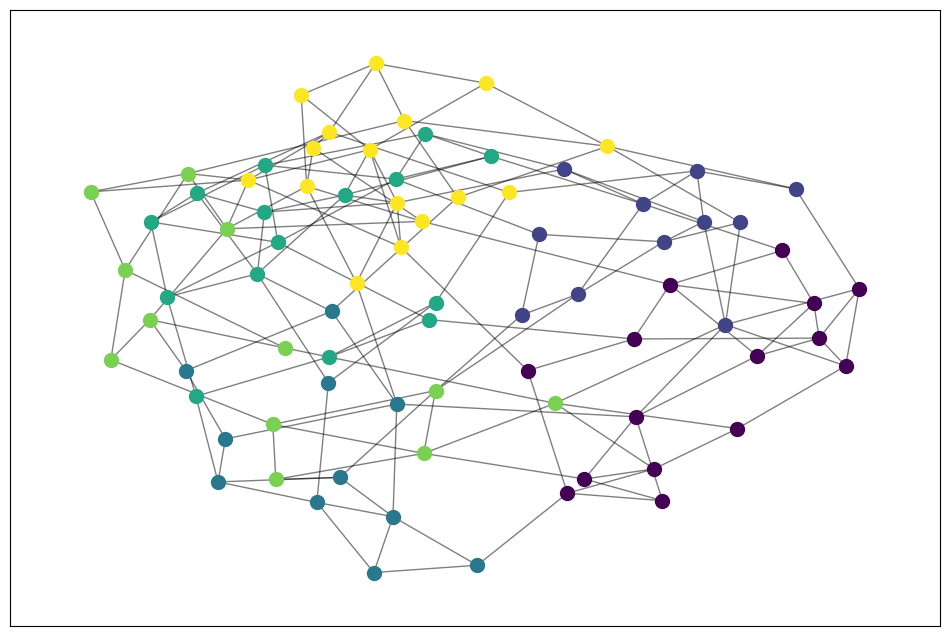

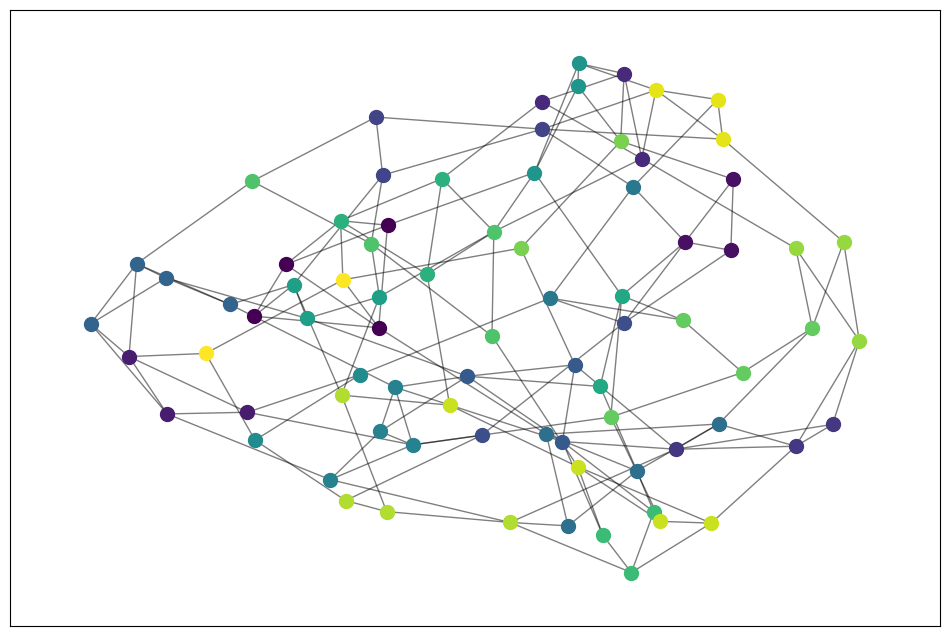

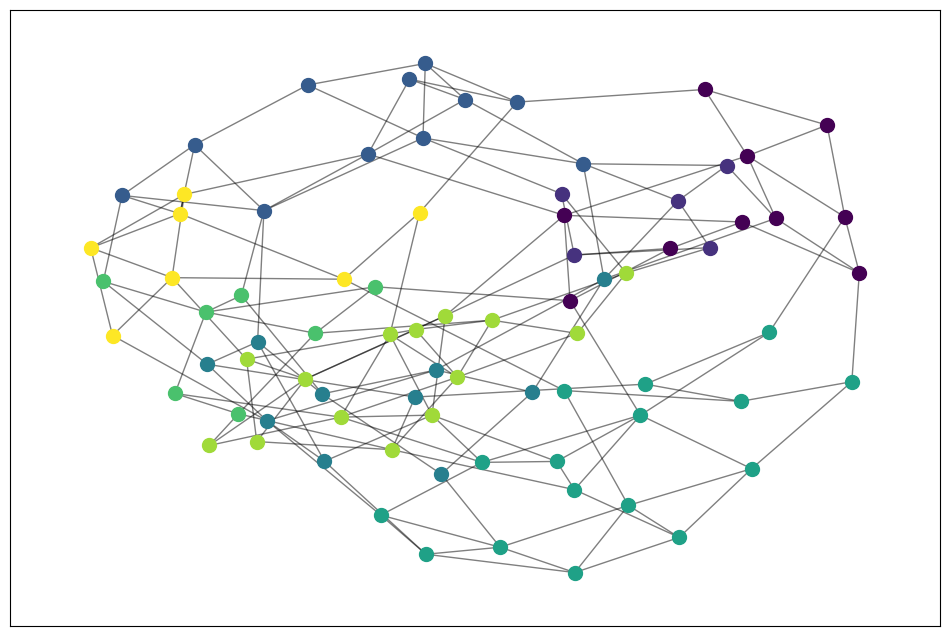

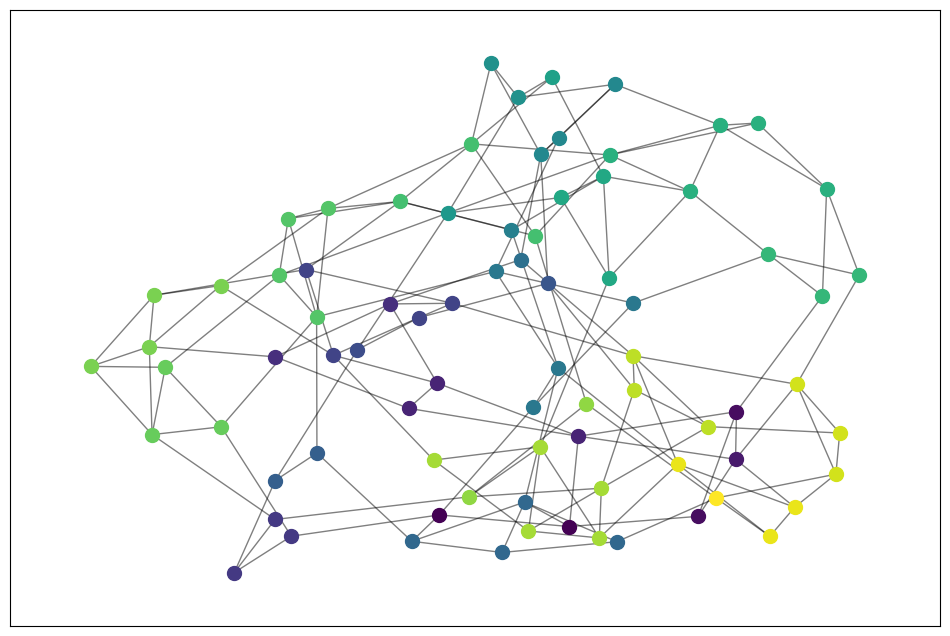

In [37]:
import matplotlib.cm as cm
def SW_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(SW)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(SW, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(SW, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])





SW_MM=Modularity_Maximazation(SW)
SW_community(SW_MM)
print("\n\n")
sw_spectral_clustering=Spectral_Clustering(SW)
SW_community(sw_spectral_clustering[0])
SW_community(sw_spectral_clustering[1])
print("\n")
sw=Girvan_Newman(SW)
SW_community(sw[0])
SW_community(sw[1])

#Το πρώτο διάγραμμα προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization. Τα επόμενα 2 διαγράμματα αναφέρονται
#στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering,ενώ τα τελευταία 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan.
#Οπώς είναι γνωστό από τη θεωρία σε δίκτυα με τοπολογία SW, δεν απαιτούνται πολύ κόμβοι για να πραγματοποιηθεί η επικοινωνία,
#αλλά στη πραγματικότητα λίγοι και συγκεκριμένοι. Όπως είναι εύκολα ορατό στα παρακάτω διαγράμματα η κάθε κοινότητα αποτελείται με
#πολύ λιγότερους κόμβους από ότι συνέβαινε στα προηγούμενα δίκτυα.

#### Οπτικοποίηση κοινοτήτων SF

Modularity Maximazation statistic's:
Partition: [frozenset({0, 1, 66, 3, 4, 69, 73, 9, 75, 76, 77, 18, 20, 24, 26, 34, 41, 42, 47, 55, 60}), frozenset({68, 7, 13, 14, 16, 17, 22, 29, 30, 32, 35, 36, 37, 38, 40, 57, 58, 59, 62, 63}), frozenset({64, 65, 5, 70, 10, 21, 27, 28, 31, 39, 44, 46, 49, 50, 53, 61}), frozenset({33, 67, 6, 72, 74, 43, 45, 78, 15, 51, 54, 25}), frozenset({2, 71, 8, 11, 12, 79, 48, 19, 52, 23, 56})]
Modularity score: 0.27000194771468145
Performance score: 0.7939873417721519


<ipython-input-17-64d6e45e9ba1>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-17-64d6e45e9ba1>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


100%|██████████| 49/49 [00:00<00:00, 67.83it/s]
<ipython-input-17-64d6e45e9ba1>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
<ipython-input-17-64d6e45e9ba1>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


Spectral Clustering algorithm's statistics:
The partition with the maximum modularity score is: [{9, 14, 15, 21, 22, 23, 24, 27, 29, 32, 33, 43, 45, 48, 53, 55, 62, 64, 67, 68}, {1, 2, 5, 6, 7, 13, 16, 17, 25, 28, 31, 34, 35, 37, 38, 40, 44, 51, 57, 58, 59, 60, 65, 70, 72, 78}, {36, 39, 71, 10, 46, 79, 49, 50, 61, 30, 63}, {0, 3, 4, 8, 11, 12, 18, 19, 20, 26, 41, 42, 47, 52, 54, 56, 66, 69, 73, 74, 75, 76, 77}]
Modularity score: 0.26934729916897504
The partition with the maximum performance score is: [{62, 21, 14, 22}, {0, 56, 3, 12}, {54, 6}, set(), {64, 43, 5, 31}, {72, 1, 78}, {38, 7}, {42, 75}, {73, 76, 69}, {24, 29, 23}, {32, 68}, {10, 27, 39}, {59}, {49, 50, 61, 46}, {52, 79}, {8, 19, 11}, {48, 2, 71, 63}, {58, 35, 37}, {16, 9, 66}, {40, 36, 30}, {25, 74, 51}, {17, 28}, {67, 45, 15}, {4, 13, 55}, {34, 60}, {57, 26, 20, 77}, {33, 53}, {41, 18, 47}, {65, 44, 70}, set(), set(), set()]
Performance score: 0.9167721518987342


Girvan Newman's statistics:
The partition with the maximum 

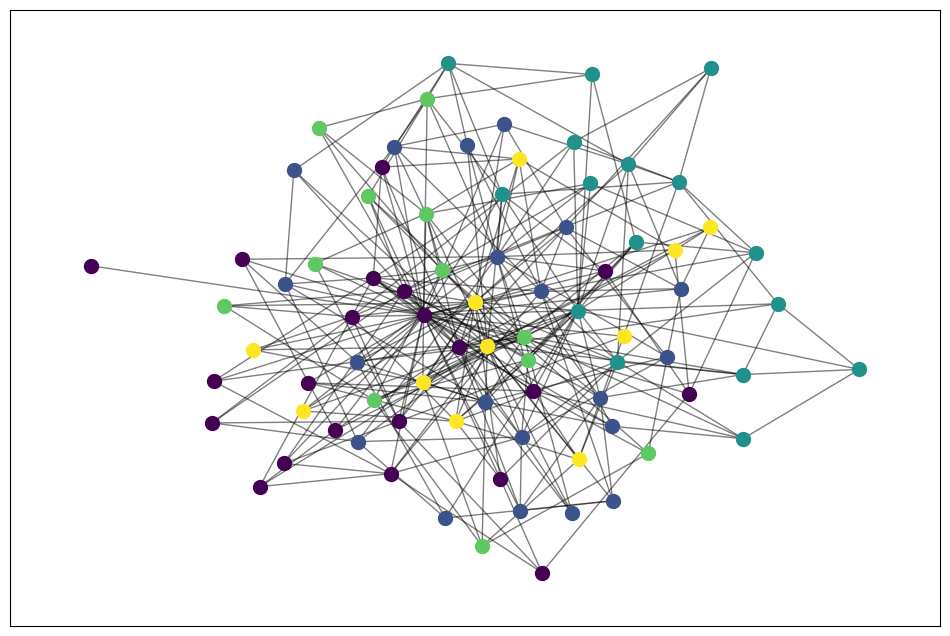

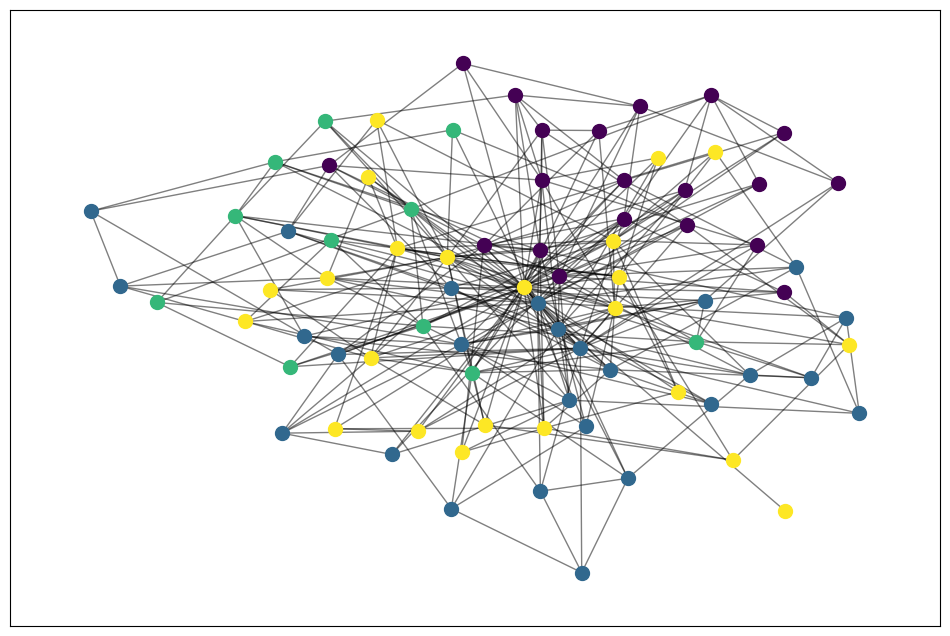

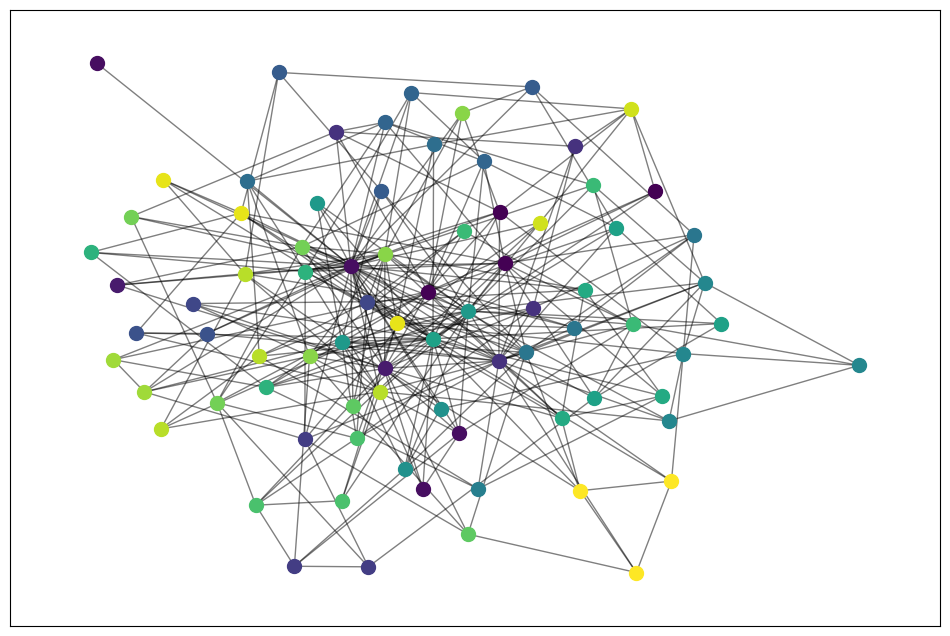

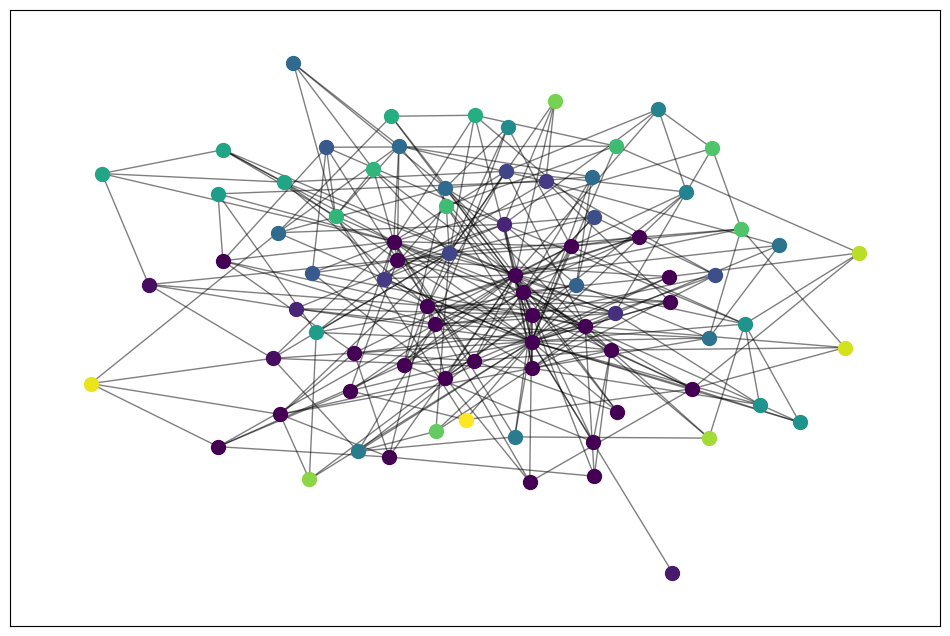

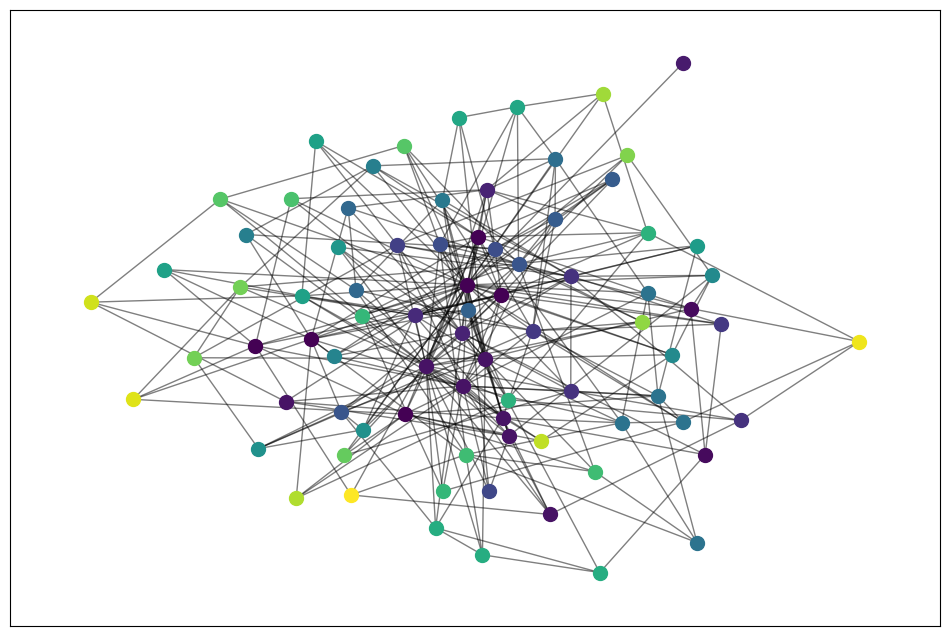

In [17]:
import matplotlib.cm as cm
def SF_community(G):
  partition_list = G
  partition = {node: color for color, nodes in enumerate(partition_list) for node in nodes}
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  plt.figure(figsize=(12,8))
  # draw the graph
  pos = nx.spring_layout(SF)
  # color the nodes according to their partition
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
  nx.draw_networkx_edges(SF, pos, alpha=0.5)
  for node, color in partition.items():
    nx.draw_networkx_nodes(SF, pos, [node], node_size=100,
                           node_color=[cmap.colors[color]])





SF_MM=Modularity_Maximazation(SF)
SF_community(SF_MM)
print("\n\n")
sf_spectral_clustering=Spectral_Clustering(SF)
SF_community(sf_spectral_clustering[0])
SF_community(sf_spectral_clustering[1])
print("\n")
sf=Girvan_Newman(SF)
print("\n")
SF_community(sf[0])
SF_community(sf[1])

#Το πρώτο διάγραμμα προκύπτει από τη διαμεριση που δημιουργεί ο αλγόριθμος Modularity Maximization. Τα επόμενα 2 διαγράμματα αναφέρονται
#στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από τον αλγόριθμο
#Spectral Clustering,ενώ τα τελευταία 2 αναφέρονται στις διαμερίσεις με το μεγαλύτερο modularity score και το μεγαλύτερο performance score από
#τον αλγόριθμο Newman Girvan.
#Στα παρακάτω διαγράμματα παρατηρείται ενά συχνό φαινόμενο για διαγράμματα scale free. Το φαινόμενο αυτό είναι να δημιουργούνται
#κοινότητες γύρω από κόμβους με πολλούς γείτονες.Σε κάθε διάγραμμα από τα παρακάτω, κάπου στο κέντρου του γραφου , βρίσκονται οι
#κόμβοι που είναι συνδεδεμένοι με τους περισσότερους κόμβους και γύρω από αυτους βρίσκονται κόμβοι που έχουν πολλά διαφορετικά
#χρώματα. Αυτό σημαίνει, ότι υπάρχουν πολλές διαφορετικές κοινότητες.